In [1]:
library(caret)
library(corrplot)
library(biomaRt)
library(MLeval)
library(GeneAnswers) # used to get gene names from entrez IDs
library(ranger)
library(praznik)

Loading required package: lattice

Loading required package: ggplot2

corrplot 0.90 loaded

Loading required package: igraph


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union


Loading required package: RCurl

Loading required package: annotate

Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:igraph’:

    normalize, path, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are mask

In [2]:
set.seed(64)

# Literature Survey

[Mechanism-driven biomarkers to guide immune checkpoint blockade in cancer therapy
Topalian et al, 2016](https://www.nature.com/articles/nrc.2016.36)<br>
[The evolving landscape of biomarkers for checkpoint inhibitor immunotherapy
Havel et al, 2019](https://www.nature.com/articles/s41568-019-0116-x)

In [3]:
path <- "/home/jp/ICP_Responders/Literature Review/GenesOfInterest.csv"
genes_lit_sur <- read.csv(path)
head(genes_lit_sur)

,Gene,ID
,<chr>,<dbl>
1,PDCD1/CD279,5133
2,CD274(PDL1),29126
3,PDCD1LG2(PDL2),80380
4,CTLA4,1493
5,CD8A,925
6,CD4,920


In [4]:
# for (i in 1:49){
#     cat(getSymbols(as.character(genes_lit_sur$ID), 'org.Hs.eg.db')[[i]])
#     cat(", ")
#     }

# Pre-Processing
1) Clean data by removing rows with > 50% missing info <br>
2) Find the most informative features <br>
3) Split the data into test and train


## Load cleaned AntiPD1 data (train set)
The first column is expected to be sample ID <br>

In [5]:
# path <- "/home/jp/ICP_Responders/DataCollectionFormatting/MergeTables/GideHugoRiazAmatoLiu_AntiPD1.csv"
# GideHugoRiazAmatoLiu_AntiPD1 <- read.csv(path, check.names=FALSE, stringsAsFactors=FALSE)
# GideHugoRiazAmatoLiu_AntiPD1[GideHugoRiazAmatoLiu_AntiPD1 == "NA" ] <- NA
# dim(GideHugoRiazAmatoLiu_AntiPD1)
# head(GideHugoRiazAmatoLiu_AntiPD1)
train <- readRDS("/home/jp/ICP_Responders/DataCollectionFormatting/MergeTables/GideHugoRiaz_AntiPD1_train.rds")


## Clean data

In [6]:
# # Check which column has > 50% NA values
# countNA <- function(x=NULL,cutOff=NULL){
#   output<-FALSE
#   perc<-sum(is.na(x))*100/length(x)
#   if(perc>cutOff){output<-TRUE}
#   output  
# }
# col_nas <- apply(GideHugoRiazAmatoLiu_AntiPD1,2,function(x){countNA(x, 50)})
# cat("Columns with NAs > 50% = ", sum(col_nas), "\n")
# # all columns have <50% NAs

# # Check which rows has > 50% NA values
# row_nas <- apply(GideHugoRiazAmatoLiu_AntiPD1,1,function(x){countNA(x, 50)})
# cat("Rows with NAs > 50% = ", sum(row_nas), "\n")

# # 25 rows have >50% NAs, removing them
# GideHugoRiazAmatoLiu_AntiPD1_filtered <- GideHugoRiazAmatoLiu_AntiPD1[-which(row_nas %in% TRUE),]

# cat("Dimensions of the filtered dataset = ", dim(GideHugoRiazAmatoLiu_AntiPD1_filtered))

## Division of test and training set

In [7]:
# train_pos <- createDataPartition(GideHugoRiazAmatoLiu_AntiPD1$Response, p = 0.8, list = F)
# train <- GideHugoRiazAmatoLiu_AntiPD1[train_pos, ]
# test <- GideHugoRiazAmatoLiu_AntiPD1[-train_pos, ]

# nrow(train)
# nrow(test)
# nrow(GideHugoRiazAmatoLiu_AntiPD1)

In [8]:
# saveRDS(train, 
#         "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/GideHugoRiazAmatoLiu_AntiPD1_train.rds")
# saveRDS(train_pos, 
#         "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/GideHugoRiazAmatoLiu_AntiPD1_train_pos.rds")
# saveRDS(test, 
#         "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/GideHugoRiazAmatoLiu_AntiPD1_test.rds")

## Look for near zero variance and remove those columns
Since all the expression values are log2 normalised, there is no near zero variance in genes

In [9]:
nzv <- nearZeroVar(train[, -which(colnames(train) %in% c("Patient, Response, Gender"))], saveMetrics= TRUE)
nzv[which(nzv$zeroVar %in% TRUE), ]

# All features were retained and there was no filtering due to near zero variance

freqRatio,percentUnique,zeroVar,nzv
<dbl>,<dbl>,<lgl>,<lgl>


## Remove genes with low expression across 50% samples
This was not used

In [10]:
# prat <- read.csv("/home/jp/ICP_Responders/DataCollectionFormatting/MergeTables/Prat.csv", 
#                   check.names=FALSE, stringsAsFactors=FALSE)
# prat_gene_list <- colnames(prat[,14:ncol(prat)])
# length(prat_gene_list)

In [11]:
# # fetch only the genes
# tmp <- GideHugoRiaz_AntiPD1_filtered
# tmp[, c("Patient", "OS", "OS.Event", "RECIST", "Age", "Gender","Response", "Source")] <- NULL
# # transpose and select genes with an expression above threshold x in p% of samples
# tmp <- t(tmp)
# nsmp <- ncol(tmp)
# x <- 1  # 2 counts per million = log2 = 1
# n <- 5  # minimum 5 samples
# ridx <- rowSums(tmp>x) > n
# table(ridx)
# exp_pass_genes <- rownames(tmp[ridx, ])
# exp_fail_genes <- rownames(tmp)[-which(rownames(tmp) %in% exp_pass_genes)]
# # create a subset with only passed expression genes
# remove_pos <- which(colnames(GideHugoRiaz_AntiPD1_filtered) %in% exp_fail_genes)
# GideHugoRiaz_AntiPD1_highexp <- GideHugoRiaz_AntiPD1_filtered[, -remove_pos]
# # percentage of passed genes overlapping with Prat
# length(which(prat_gene_list %in% exp_pass_genes))/length(which(prat_gene_list %in% rownames(tmp)))

## Look for correlation and remove highly correlated columns

In [12]:
exp_feat <- grep("[0-9]",colnames(train))

In [13]:
# find attributes that are highly corrected (ideally >0.75)
tmp <- train
tmp[is.na(tmp)] <- 0
expr_corr <-  cor(tmp[,c(exp_feat)]) 
highlyCorrelated <- findCorrelation(expr_corr, cutoff=0.75, names=TRUE, verbose=FALSE)
length(highlyCorrelated)
highlyCorrelated <- highlyCorrelated[highlyCorrelated %in% c(as.character(genes_lit_sur$ID)) == FALSE]   
length(highlyCorrelated)
train_AntiPD1_rmcorr <- train[, -which(colnames(train) %in% highlyCorrelated)]

[1] 2066

[1] 2050

## Linear dependencies(not used)
NOTE: Linear Dependencies were not used because
1) A large number of features from columns 157 to 400 were flagged as linearly dependent to columns 1 to 156 <br>
2) We will rely on feature importance and the robustness of the model selected to identify the most important features hence linear dependencies can become redundant

In [14]:
# cat("Started with train dimension = ", dim(train), "\n")
# cat("Post 50% NA filtering in rows and columns the dimension is", dim(GideHugoRiazAmatoLiu_AntiPD1_filtered), "\n")
cat("Post dividing the data into train and test the dimension of train is", dim(train), "\n")
cat("Post filtering highly correlated columns the dimension is", dim(train_AntiPD1_rmcorr), "\n")
# cat("Post removing linearly dependent columns the dimension is", dim(expr_rmLnCmb))

Post dividing the data into train and test the dimension of train is 74 16018 
Post filtering highly correlated columns the dimension is 74 13968 


# Feature Selection


There are 2 kinds of feature selection: automated and manual
1) Automated<br>
Automatic feature selection methods can be used to build many models with different subsets of a dataset and identify those attributes that are and are not required to build an accurate model.The algorithm is configured to explore all possible subsets of the attributes.Then it selects the optimal number of attributes and the most important attributes. The relevant functions in CARET are: rfeControl and rfe.<br>


2) Manual<br>
For classification, ROC curve analysis is conducted on each predictor. For two class problems, a series of cutoffs is applied to the predictor data to predict the class. The sensitivity and specificity are computed for each cutoff and the ROC curve is computed. The trapezoidal rule is used to compute the area under the ROC curve. This area is used as the measure of variable importance.The relevant functions in CARET are varImp.<br>
<br>

Note: [Chen et al, 2020](https://journalofbigdata.springeropen.com/articles/10.1186/s40537-020-00327-4#Sec14) shows that manually selecting the topmost variables using the random forest varImp function is more accurate in identifying relevant features compared to automated methods.


[Darst et al, 2018](https://bmcgenomdata.biomedcentral.com/articles/10.1186/s12863-018-0633-8) suggested that although RF-RFE decreased the importance of correlated variables, in the presence of many correlated variables, it also decreased the importance of causal variables, making both hard to detect. These findings suggest that RF-RFE may not scale to high-dimensional data.

[Sanz et al, 2018](https://bmcbioinformatics.biomedcentral.com/articles/10.1186/s12859-018-2451-4#Sec3) -> SVM

In [15]:
exp_feat_rmcorr <- grep("[0-9]",colnames(train_AntiPD1_rmcorr))

mod_inp_mat <- cbind(train_AntiPD1_rmcorr$"Response", train[, c(exp_feat_rmcorr)])
colnames(mod_inp_mat)[colnames(mod_inp_mat) == "train_AntiPD1_rmcorr$Response"] <- "Response"

# input for modeling
mod_inp_mat$Response <- as.character(mod_inp_mat$Response)
mod_inp_mat[mod_inp_mat$Response == '1',"Response"] <- 'Y' 
mod_inp_mat[mod_inp_mat$Response == '0', "Response"] <- 'N' 
mod_inp_mat$Response <- as.factor(mod_inp_mat$Response)
mod_inp_mat[is.na(mod_inp_mat)] <- 0
dim(mod_inp_mat)
#  define target and feature names
col_names = colnames(mod_inp_mat)
target = "Response"
feature_names = col_names[col_names!=target]

[1]    74 13961

In [16]:
saveRDS(mod_inp_mat, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/mod_inp_mat_AntiPD1.rds")

In [17]:
target
length(feature_names)

[1] "Response"

[1] 13960

## Automated Feature Selection

In [18]:
feature_size <- c(50, 100, 200, 400, 600, 800, 1000, 2000, 3000, 4000, 5000, 6000,
                  7000, 8000, 9000, 10000, 11000, 12000, 13000, 14000)

### Random Forest

In [20]:
date()
rf.control <- rfeControl(functions=rfFuncs, method="repeatedcv", number=10, repeats=3)
system.time(a.rf <- rfe(Response~., data=mod_inp_mat, 
            sizes=feature_size, 
            rfeControl=rf.control))

date()

[1] "Mon Aug 16 14:06:09 2021"

    user   system  elapsed 
1756.878    0.732 1757.935 

[1] "Mon Aug 16 14:35:27 2021"

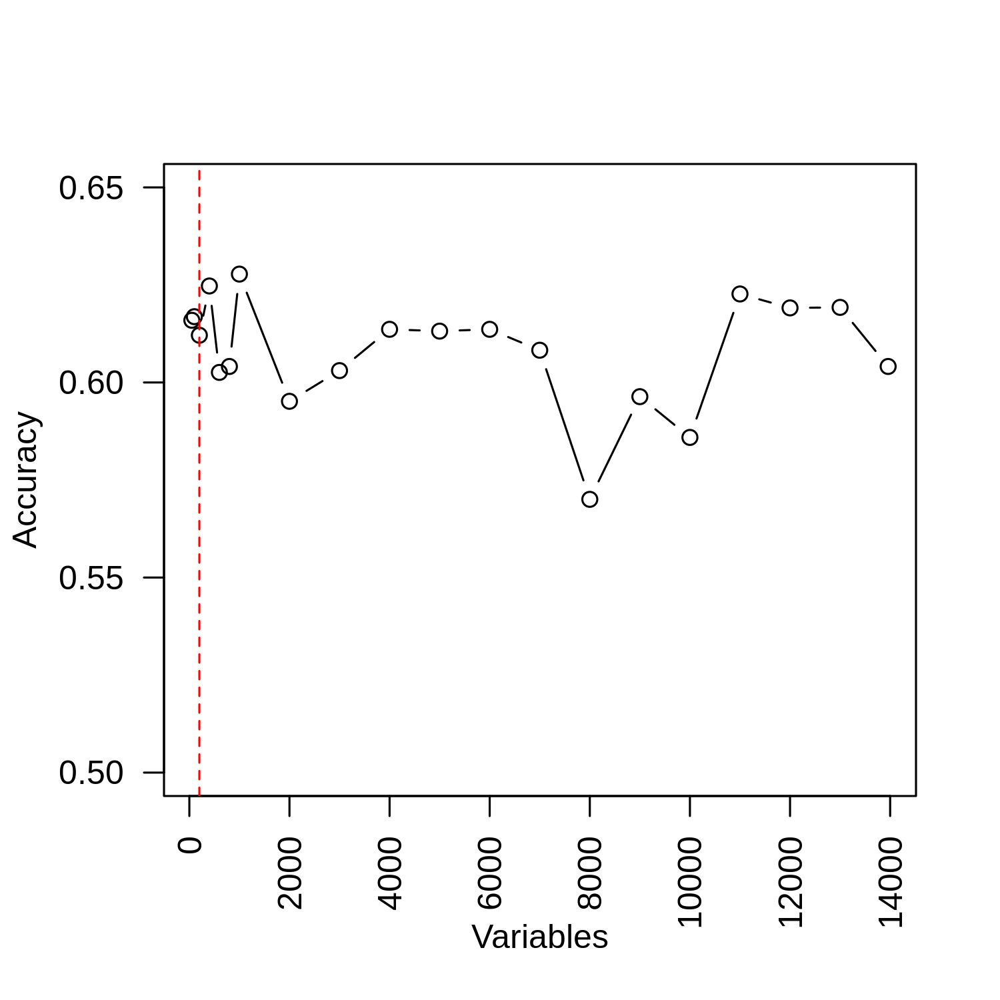

In [21]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 300)
# list the chosen featuresplot(a.rf, type=c("g", "o"))
rf.pred <- predictors(a.rf)
# plot the results
plot(a.rf$results$Variables, a.rf$results$Accuracy, ylab="Accuracy", xlab="Variables", 
     type="b", ylim =c(0.50, 0.65), las=2)
abline(v=200, lty="dashed", col="red")
a.rf.results <- a.rf$results

In [22]:
round(a.rf$results, 3)

Variables,Accuracy,Kappa,AccuracySD,KappaSD
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
50,0.616,0.194,0.193,0.395
100,0.617,0.197,0.146,0.292
200,0.612,0.187,0.152,0.303
400,0.625,0.201,0.168,0.346
600,0.603,0.169,0.166,0.325
800,0.604,0.168,0.166,0.336
1000,0.628,0.207,0.147,0.311
2000,0.595,0.142,0.169,0.343
3000,0.603,0.149,0.168,0.350


## Manual Feature Selection

In [23]:
# define a resampling approach for caret where data is divided into 10 random subsets and prediction is done on 
# 1 using the remaining 9. This approach is repeated thrice
control <- trainControl(method="repeatedcv", number=10, repeats=3)

### glmNet
A generalized linear model (GLM) is a flexible generalization of ordinary linear regression that allows for the response variable to have an error distribution other than the normal distribution. 

In [24]:
date()
m.glm <- train(Response~., data=mod_inp_mat, 
                  method="glmnet", 
                  trControl=control,
                  preProcess = c("scale", "center")
                 )
date()

[1] "Mon Aug 16 14:35:27 2021"

[1] "Mon Aug 16 14:36:26 2021"

In [25]:
# estimate variable importance
glm.imp <- varImp(m.glm, scale=TRUE)$importance
rownames(glm.imp) <- gsub("`", "", rownames(glm.imp))
glm.imp$Name <- rownames(glm.imp)
# summarize importance
glm.imp <- glm.imp[order(glm.imp$Overall, decreasing=TRUE),]
colnames(glm.imp) <- c("Score", "Name")
head(glm.imp)

,Score,Name
,<dbl>,<chr>
5588,100.00000,5588
2152,66.80526,2152
6610,51.06129,6610
2054,24.97763,2054
6624,22.61556,6624
54587,19.95574,54587


### SVM
Support vector machines (SVMs) is a representation of different classes in a hyperplane in multidimensional space. The hyperplane is generated in an iterative manner by SVM for error minimization and divide the datasets into classes to find a maximum marginal hyperplane (MMH).<br>
This is effective in high dimensional spaces.

In [26]:
date()
m.svm <- train(Response~., data=mod_inp_mat, 
                  method="svmRadial", 
                  trControl=control,
                  preProcess = c("scale", "center"))
date()

[1] "Mon Aug 16 14:36:26 2021"

[1] "Mon Aug 16 14:38:14 2021"

In [27]:
# estimate variable importance
svm.imp <- varImp(m.svm, scale=TRUE)$importance
svm.imp$Name <- rownames(svm.imp)
# summarize importance
svm.imp <- svm.imp[order(svm.imp$N, decreasing=TRUE),]
svm.imp$N <- NULL
colnames(svm.imp) <- c("Score", "Name")
head(svm.imp)

,Score,Name
,<dbl>,<chr>
5588,100.00000,5588
79722,98.57955,79722
9244,96.59091,9244
55273,92.61364,55273
80760,91.19318,80760
6610,90.90909,6610


### PCA Neural Network
The neural network is a weighted graph where nodes are the neurons, and edges with weights represent the connections. <br>
pcaNNet uses principle components to build a neural network

In [28]:
date()
m.nnet <- train(Response~., data=mod_inp_mat, 
                  method="pcaNNet", 
                  trControl=control,
                  preProcess = c("scale", "center"))
date()

[1] "Mon Aug 16 14:38:16 2021"

# weights:  68
initial  value 36.423571 
iter  10 value 32.025733
iter  20 value 27.709290
iter  30 value 27.693631
iter  40 value 26.083203
iter  50 value 25.993302
iter  60 value 25.992837
final  value 25.992833 
converged
# weights:  200
initial  value 36.450860 
iter  10 value 27.495955
iter  20 value 20.038544
iter  30 value 19.448085
iter  40 value 19.419686
iter  50 value 18.509810
iter  60 value 18.353354
final  value 18.353338 
converged
# weights:  332
initial  value 37.820624 
iter  10 value 23.632398
iter  20 value 17.422861
iter  30 value 13.865945
iter  40 value 11.689508
iter  50 value 11.489432
iter  60 value 10.473523
iter  70 value 8.256086
iter  80 value 8.078298
iter  90 value 8.027696
iter 100 value 8.018099
final  value 8.018099 
stopped after 100 iterations
# weights:  68
initial  value 34.404318 
iter  10 value 32.838833
iter  20 value 28.846985
iter  30 value 22.088564
iter  40 value 15.246631
iter  50 value 12.648053
iter  60 value 10.555625
iter  70 value 8.7

initial  value 36.429580 
iter  10 value 30.644212
iter  20 value 29.723265
iter  30 value 28.993475
iter  40 value 28.992876
final  value 28.992874 
converged
# weights:  203
initial  value 36.700360 
iter  10 value 30.347749
iter  20 value 29.381736
iter  30 value 29.210655
iter  40 value 25.898013
iter  50 value 25.687541
iter  60 value 20.120019
iter  70 value 16.343706
iter  80 value 15.913725
iter  90 value 14.682862
iter 100 value 14.594728
final  value 14.594728 
stopped after 100 iterations
# weights:  337
initial  value 39.330351 
iter  10 value 24.815186
iter  20 value 20.516842
iter  30 value 19.592375
iter  40 value 19.089552
iter  50 value 18.886237
iter  60 value 18.844847
iter  70 value 18.836000
iter  80 value 18.712288
iter  90 value 18.666741
iter 100 value 17.601060
final  value 17.601060 
stopped after 100 iterations
# weights:  69
initial  value 40.864656 
iter  10 value 32.424262
iter  20 value 22.667292
iter  30 value 18.721297
iter  40 value 14.966555
iter  50 

initial  value 33.715002 
iter  10 value 31.970540
iter  20 value 30.024330
iter  30 value 29.286768
final  value 29.286756 
converged
# weights:  203
initial  value 43.055398 
iter  10 value 30.584853
iter  20 value 28.711508
iter  30 value 28.672616
iter  40 value 28.559530
iter  50 value 28.379503
iter  60 value 24.978336
iter  70 value 21.990527
iter  80 value 21.778639
iter  90 value 19.745130
iter 100 value 19.179093
final  value 19.179093 
stopped after 100 iterations
# weights:  337
initial  value 36.163442 
iter  10 value 24.139071
iter  20 value 19.220942
iter  30 value 18.575728
iter  40 value 18.571559
iter  50 value 18.571462
iter  60 value 18.528380
iter  70 value 17.709026
iter  80 value 17.678330
final  value 17.675945 
converged
# weights:  69
initial  value 34.795746 
iter  10 value 30.484771
iter  20 value 24.946860
iter  30 value 22.192395
iter  40 value 17.105313
iter  50 value 15.242841
iter  60 value 12.441939
iter  70 value 9.565058
iter  80 value 9.032023
iter 

initial  value 35.901385 
iter  10 value 31.772656
iter  20 value 30.284011
iter  30 value 28.534169
iter  40 value 28.527987
iter  50 value 27.694157
iter  60 value 26.779735
iter  70 value 25.140628
final  value 25.140541 
converged
# weights:  203
initial  value 39.813933 
iter  10 value 29.948115
iter  20 value 27.797745
iter  30 value 27.797670
iter  40 value 27.797656
final  value 27.797654 
converged
# weights:  337
initial  value 41.562406 
iter  10 value 32.531178
iter  20 value 25.922156
iter  30 value 22.667624
iter  40 value 21.128054
iter  50 value 20.468895
iter  60 value 20.370162
iter  70 value 20.369990
iter  80 value 20.369963
iter  90 value 20.363962
iter 100 value 20.363904
final  value 20.363904 
stopped after 100 iterations
# weights:  69
initial  value 37.343765 
iter  10 value 30.191041
iter  20 value 27.708243
iter  30 value 25.142191
iter  40 value 21.801223
iter  50 value 20.254944
iter  60 value 16.967444
iter  70 value 16.384336
iter  80 value 12.625400
ite

initial  value 40.710322 
iter  10 value 28.540335
iter  20 value 23.116638
iter  30 value 20.783735
iter  40 value 19.601133
iter  50 value 19.414923
iter  60 value 18.339424
iter  70 value 18.256004
final  value 18.255999 
converged
# weights:  332
initial  value 33.679690 
iter  10 value 25.319389
iter  20 value 17.727262
iter  30 value 14.605673
iter  40 value 13.552587
iter  50 value 13.499681
iter  60 value 13.498983
iter  70 value 13.480699
iter  80 value 13.000328
iter  90 value 13.000006
final  value 13.000000 
converged
# weights:  68
initial  value 33.861227 
iter  10 value 31.076174
iter  20 value 26.196564
iter  30 value 20.053438
iter  40 value 16.080405
iter  50 value 12.936858
iter  60 value 12.775099
iter  70 value 10.226207
iter  80 value 10.058425
iter  90 value 10.045122
iter 100 value 10.043656
final  value 10.043656 
stopped after 100 iterations
# weights:  200
initial  value 42.282050 
iter  10 value 30.649626
iter  20 value 22.553192
iter  30 value 20.428662
ite

initial  value 36.582346 
iter  10 value 29.819426
iter  20 value 25.667585
iter  30 value 23.897029
iter  40 value 22.152526
iter  50 value 21.549703
iter  60 value 21.441446
iter  70 value 21.441420
iter  80 value 21.441283
iter  90 value 20.954799
iter 100 value 20.954243
final  value 20.954243 
stopped after 100 iterations
# weights:  337
initial  value 36.609986 
iter  10 value 24.696121
iter  20 value 18.820153
iter  30 value 14.181436
iter  40 value 13.733666
iter  50 value 13.447226
iter  60 value 13.444361
iter  70 value 13.443211
iter  80 value 13.442605
final  value 13.442489 
converged
# weights:  69
initial  value 37.381172 
iter  10 value 30.130806
iter  20 value 26.459102
iter  30 value 24.403144
iter  40 value 23.229619
iter  50 value 17.877715
iter  60 value 15.579179
iter  70 value 14.258540
iter  80 value 11.621094
iter  90 value 10.576608
iter 100 value 8.781183
final  value 8.781183 
stopped after 100 iterations
# weights:  203
initial  value 41.863473 
iter  10 va

initial  value 35.827991 
iter  10 value 32.522386
iter  20 value 32.032373
iter  30 value 32.014293
final  value 32.014262 
converged
# weights:  200
initial  value 34.691905 
iter  10 value 22.721967
iter  20 value 20.988986
iter  30 value 20.917516
iter  40 value 20.746627
iter  50 value 20.746344
final  value 20.746343 
converged
# weights:  332
initial  value 34.686147 
iter  10 value 26.387006
iter  20 value 23.113472
iter  30 value 22.465748
iter  40 value 22.462826
iter  50 value 22.462747
iter  60 value 22.462483
iter  70 value 22.094920
final  value 22.094872 
converged
# weights:  68
initial  value 34.823950 
iter  10 value 32.038215
iter  20 value 29.590871
iter  30 value 24.491094
iter  40 value 17.998371
iter  50 value 16.003156
iter  60 value 14.193757
iter  70 value 12.831042
iter  80 value 10.103321
iter  90 value 10.071538
iter 100 value 10.068134
final  value 10.068134 
stopped after 100 iterations
# weights:  200
initial  value 46.720266 
iter  10 value 38.694970
it

initial  value 35.373743 
iter  10 value 32.233331
iter  20 value 31.828522
iter  30 value 28.385999
iter  40 value 26.077924
iter  50 value 26.020975
iter  60 value 26.020320
iter  70 value 26.020297
iter  80 value 25.279425
final  value 25.279411 
converged
# weights:  200
initial  value 35.080976 
iter  10 value 27.199730
iter  20 value 22.982470
iter  30 value 19.863818
iter  40 value 16.749004
iter  50 value 16.365154
iter  60 value 16.364273
iter  70 value 15.453861
iter  80 value 15.447686
final  value 15.447071 
converged
# weights:  332
initial  value 38.247817 
iter  10 value 28.972507
iter  20 value 23.420451
iter  30 value 21.108798
iter  40 value 20.742453
iter  50 value 20.536935
iter  60 value 20.507320
iter  70 value 20.507153
iter  80 value 18.676410
iter  90 value 17.941631
iter 100 value 17.937784
final  value 17.937784 
stopped after 100 iterations
# weights:  68
initial  value 33.685400 
iter  10 value 28.255759
iter  20 value 21.159887
iter  30 value 16.796086
ite

initial  value 36.947508 
iter  10 value 29.760507
iter  20 value 28.530296
iter  30 value 26.955005
final  value 26.954959 
converged
# weights:  203
initial  value 36.854796 
iter  10 value 31.563555
iter  20 value 27.513424
iter  30 value 18.946017
iter  40 value 18.538674
iter  50 value 18.101084
iter  60 value 18.079969
iter  70 value 18.011755
final  value 18.011737 
converged
# weights:  337
initial  value 41.929703 
iter  10 value 27.537846
iter  20 value 19.933174
iter  30 value 17.668584
iter  40 value 17.333850
iter  50 value 17.081146
iter  60 value 16.772936
iter  70 value 14.348483
iter  80 value 12.488598
iter  90 value 11.145704
iter 100 value 10.843084
final  value 10.843084 
stopped after 100 iterations
# weights:  69
initial  value 37.108951 
iter  10 value 31.257146
iter  20 value 26.130213
iter  30 value 20.479657
iter  40 value 17.385958
iter  50 value 13.643607
iter  60 value 10.554749
iter  70 value 8.952028
iter  80 value 7.312860
iter  90 value 7.216347
iter 1

initial  value 35.098684 
iter  10 value 31.393924
iter  20 value 30.960021
iter  30 value 30.377977
iter  40 value 29.929098
iter  50 value 29.917054
final  value 29.917051 
converged
# weights:  200
initial  value 35.513560 
iter  10 value 25.195889
iter  20 value 22.337443
iter  30 value 21.709851
iter  40 value 21.709137
iter  50 value 21.438736
iter  60 value 21.401339
iter  70 value 20.884484
iter  80 value 20.884203
final  value 20.686303 
converged
# weights:  332
initial  value 37.463218 
iter  10 value 25.764477
iter  20 value 21.525244
iter  30 value 17.195511
iter  40 value 15.385943
iter  50 value 14.644965
iter  60 value 13.067133
iter  70 value 12.261350
iter  80 value 12.155234
iter  90 value 12.153345
iter 100 value 12.152903
final  value 12.152903 
stopped after 100 iterations
# weights:  68
initial  value 37.115532 
iter  10 value 32.467593
iter  20 value 30.086525
iter  30 value 23.232418
iter  40 value 20.695136
iter  50 value 15.662034
iter  60 value 14.169225
ite

initial  value 37.346863 
iter  10 value 32.655373
iter  20 value 30.685583
iter  30 value 29.772939
iter  40 value 29.604819
iter  50 value 27.966067
iter  60 value 27.024355
iter  70 value 26.901067
iter  80 value 26.153254
iter  90 value 25.338707
iter 100 value 25.322402
final  value 25.322402 
stopped after 100 iterations


[1] "Mon Aug 16 15:36:18 2021"

In [29]:
# estimate variable importance
nnet.imp <- varImp(m.nnet, scale=TRUE)$importance
rownames(nnet.imp) <- gsub("`", "", rownames(nnet.imp))
nnet.imp$Name <- rownames(nnet.imp)
# summarize importance
nnet.imp <- nnet.imp[order(nnet.imp$N, decreasing=TRUE),]
nnet.imp$N <- NULL
colnames(nnet.imp) <- c("Score", "Name")
head(nnet.imp)

,Score,Name
,<dbl>,<chr>
5588,100.00000,5588
79722,98.57955,79722
9244,96.59091,9244
55273,92.61364,55273
80760,91.19318,80760
6610,90.90909,6610


### Gradient Boosting Machines (GBM)
Gradient boosting is a machine learning technique for regression, classification and other tasks, which produces a prediction model in the form of an ensemble of weak prediction models, typically decision trees

In [30]:
date()
library(gbm)
m.gbm <- train(Response~., data=mod_inp_mat, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"))
date()

[1] "Mon Aug 16 15:36:20 2021"

Loaded gbm 2.1.8



Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3383            -nan     0.1000   -0.0193
     2        1.2962            -nan     0.1000   -0.0012
     3        1.2256            -nan     0.1000    0.0173
     4        1.1604            -nan     0.1000    0.0134
     5        1.1097            -nan     0.1000    0.0084
     6        1.1008            -nan     0.1000   -0.0283
     7        1.0564            -nan     0.1000   -0.0134
     8        1.0135            -nan     0.1000    0.0006
     9        0.9756            -nan     0.1000    0.0019
    10        0.9403            -nan     0.1000   -0.0053
    20        0.7182            -nan     0.1000    0.0000
    40        0.3864            -nan     0.1000   -0.0022
    60        0.2352            -nan     0.1000   -0.0031
    80        0.1469            -nan     0.1000   -0.0012
   100        0.0862            -nan     0.1000   -0.0011
   120        0.0508            -nan     0.1000   -0.0005
   140        

[1] "Mon Aug 16 15:45:36 2021"

In [31]:
# estimate variable importance
gbm.imp <- varImp(m.gbm, scale=TRUE)$importance
rownames(gbm.imp) <- gsub("`", "", rownames(gbm.imp))
gbm.imp$Name <- rownames(gbm.imp)
# summarize importance
gbm.imp <- gbm.imp[order(gbm.imp$Overall, decreasing=TRUE),]
colnames(gbm.imp) <- c("Score", "Name")
head(gbm.imp)

,Score,Name
,<dbl>,<chr>
1152,100.00000,1152
3628,75.28809,3628
143872,55.24299,143872
55273,52.44312,55273
6676,44.48550,6676
9699,42.67411,9699


### Partial Least Squares
Partial least squares(PLS) is a method for construct-ing predictive models when the factors are many and highly collinear. <br>
Partial least squares regression bears some relation to principal components regression; instead of finding hyperplanes of maximum variance between the response and independent variables, it finds a linear regression model by projecting the predicted variables and the observable variables to a new space

In [32]:
date()
m.pls <- train(Response~., data=mod_inp_mat, 
                  method="pls", 
                  trControl=control,
                  preProcess = c("scale", "center"))
date()

[1] "Mon Aug 16 15:45:36 2021"

[1] "Mon Aug 16 15:46:02 2021"

In [33]:
# estimate variable importance
pls.imp <- varImp(m.pls, scale=TRUE)$importance
rownames(pls.imp) <- gsub("`", "", rownames(pls.imp))
pls.imp$Name <- rownames(pls.imp)
# summarize importance
pls.imp <- pls.imp[order(pls.imp$Overall, decreasing=TRUE),]
colnames(pls.imp) <- c("Score", "Name")
head(pls.imp)


Attaching package: ‘pls’


The following object is masked from ‘package:corrplot’:

    corrplot


The following object is masked from ‘package:caret’:

    R2


The following object is masked from ‘package:stats’:

    loadings




,Score,Name
,<dbl>,<chr>
5588,100.00000,5588
6610,96.25002,6610
677832,94.74162,677832
2218,94.17254,2218
2054,91.61254,2054
388799,91.45510,388799


### Cforest
Cforest generates an ensemble of trees of the same form as ctree with random features selected at each node and subsampling (by default)

In [34]:
date()
m.cforest <- train(Response~., data=mod_inp_mat, 
                  method="cforest", 
                  trControl=control,
                  preProcess = c("scale", "center"))
date()

[1] "Mon Aug 16 15:46:03 2021"

[1] "Mon Aug 16 21:48:00 2021"

In [35]:
# estimate variable importance
cforest.imp <- varImp(m.cforest, scale=TRUE)$importance
rownames(cforest.imp) <- gsub("`", "", rownames(cforest.imp))
cforest.imp$Name <- rownames(cforest.imp)
# summarize importance
cforest.imp <- cforest.imp[order(cforest.imp$Overall, decreasing=TRUE),]
colnames(cforest.imp) <- c("Score", "Name")
head(cforest.imp)

,Score,Name
,<dbl>,<chr>
83932,100.00000,83932
962,96.19048,962
8692,95.20000,8692
10068,95.20000,10068
22879,94.48276,22879
9997,91.60494,9997


### High Dimensional Discriminant Analysis
HDDA performs linear discriminant analysis in high dimensional problems based on reliable covariance estimators for problems with (many) more variables than observations

In [36]:
date()
m.hdda <- train(Response~., data=mod_inp_mat, 
                  method="hdda", 
                  trControl=control,
                  preProcess = c("scale", "center"))
date()

[1] "Mon Aug 16 21:48:13 2021"

[1] "Mon Aug 16 21:49:17 2021"

In [37]:
hdda.imp <- varImp(m.hdda, scale=TRUE)$importance
rownames(hdda.imp) <- gsub("`", "", rownames(hdda.imp))
hdda.imp$Name <- rownames(hdda.imp)
# summarize importance
hdda.imp <- hdda.imp[order(hdda.imp$N, decreasing=TRUE),]
hdda.imp$N <- NULL
colnames(hdda.imp) <- c("Score", "Name")
head(hdda.imp)

,Score,Name
,<dbl>,<chr>
5588,100.00000,5588
79722,98.57955,79722
9244,96.59091,9244
55273,92.61364,55273
80760,91.19318,80760
6610,90.90909,6610


### Naïve Bayes
Naïve Bayes algorithm is a supervised learning algorithm, which is based on Bayes theorem and used for solving classification problems

In [38]:
date()
m.nb <- train(Response~., data=mod_inp_mat, 
                  method="naive_bayes", 
                  trControl=control,
                  preProcess = c("scale", "center"))
date()

[1] "Mon Aug 16 21:49:19 2021"

[1] "Mon Aug 16 21:59:44 2021"

In [39]:
# estimate variable importance
nb.imp <- varImp(m.nb, scale=TRUE)$importance
rownames(nb.imp) <- gsub("`", "", rownames(nb.imp))
nb.imp$Name <- rownames(nb.imp)
# summarize importance
nb.imp <- nb.imp[order(nb.imp$N, decreasing=TRUE),]
nb.imp$N <- NULL
colnames(nb.imp) <- c("Score", "Name")
head(nb.imp)

,Score,Name
,<dbl>,<chr>
5588,100.00000,5588
79722,98.57955,79722
9244,96.59091,9244
55273,92.61364,55273
80760,91.19318,80760
6610,90.90909,6610


## Rank Analysis

### Compare ranks from multiple Models

In [40]:
# getRank adds a rank column to the input matrix according to varImp scores
getRank <- function(tmp=NULL, cname=NULL){
    tmp[,cname] <- rank(-tmp$Score)
    tmp$Score <- NULL
    tmp
}

glm.rank <- getRank(glm.imp, "glm.Rank")
svm.rank <- getRank(svm.imp, "svm.Rank")
nnet.rank <- getRank(nnet.imp, "PCAnnet.Rank")
gbm.rank <- getRank(gbm.imp, "gbm.Rank")
pls.rank <- getRank(pls.imp, "pls.Rank")
cforest.rank <- getRank(cforest.imp, "cforest.Rank")
hdda.rank <- getRank(hdda.imp, "hdda.Rank")
nb.rank <- getRank(nb.imp, "nb.Rank")

all.rank <- Reduce(function(x,y) merge(x,y, by="Name"),list(glm.rank, svm.rank, nnet.rank, gbm.rank,
                                                             pls.rank, cforest.rank, hdda.rank, nb.rank))
                   
colnames(all.rank)[1] <- "Gene_ID" 
all.rank$Gene_Name <- getSymbols(all.rank$Gene_ID, 'org.Hs.eg.db')
# all.rank is the merged matrix containing gene IDs as the first column, gene names as the last column and 
# ranks for all the models as intermediate columns                  

Loading required package: org.Hs.eg.db





[1] "Warning: some genes do not have valid symbols!"


In [41]:
# to find all genes over the threshold

# rank.threshold <- 250
# rank.clmn <- grep("Rank", colnames(all.rank))
# all.rank$Threshold.250 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
# all.rank <- all.rank[order(all.rank$Threshold.250, decreasing=TRUE),]

# rank.threshold <- 200
# rank.clmn <- grep("Rank", colnames(all.rank))
# all.rank$Threshold.200 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
# all.rank <- all.rank[order(all.rank$Threshold.200, decreasing=TRUE),]

# rank.threshold <- 150
# rank.clmn <- grep("Rank", colnames(all.rank))
# all.rank$Threshold.150 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
# all.rank <- all.rank[order(all.rank$Threshold.150, decreasing=TRUE),]

rank.threshold <- 100
rank.clmn <- grep("Rank", colnames(all.rank))
all.rank$Threshold.100 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
all.rank <- all.rank[order(all.rank$Threshold.100, decreasing=TRUE),]

# rank.threshold <- 50
# rank.clmn <- grep("Rank", colnames(all.rank))
# all.rank$Threshold.50 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
# all.rank <- all.rank[order(all.rank$Threshold.50, decreasing=TRUE),]

# rank.threshold <- 30
# rank.clmn <- grep("Rank", colnames(all.rank))
# all.rank$Threshold.30 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
# all.rank <- all.rank[order(all.rank$Threshold.30, decreasing=TRUE),]

# rank.threshold <- 10
# rank.clmn <- grep("Rank", colnames(all.rank))
# all.rank$Threshold.10 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
# all.rank <- all.rank[order(all.rank$Threshold.10, decreasing=TRUE),]

In [42]:
ml.list <- all.rank[all.rank$Threshold.100 >=4, ]$Gene_ID
# save the list of genes which fall within Top 100 rank in at least 4 out of 8 models tested
saveRDS(ml.list, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/ml.list.rds")

### Merge ranks using Borda voting method
NOT used since the results are very similar to manual ranking method

In [43]:
# #merge rank using Borda method
# library(votesys)
# data <- all.rank[,2:9]
# transpose <- t(data)
# tmp <- as.matrix(transpose)
# colnames(tmp) <- all.rank$Gene_Name
# # tmp
# vote <- create_vote(tmp, xtype=1)
# res.borda <- borda_method(vote, modified = FALSE)  # Winner is with the lowest score, for modified is FALSE.
# merged.rank<-data.frame(gene=names(res.borda$other_info$count_min),
#                         rank.borda=res.borda$other_info$count_min,
#                         stringsAsFactors=F)

# merged.rank <- merged.rank[order(merged.rank$rank.borda, decreasing=FALSE),]
# head(merged.rank)

# Ranger Gene List

In [44]:
tmp <- mod_inp_mat
colnames(tmp) <- paste0("X.", colnames(tmp))
m.rf_ranger <-   ranger(X.Response~., data=tmp, importance="permutation")

ranger.imp <- importance(m.rf_ranger)
ranger.imp100 <- names(ranger.imp[order(ranger.imp, decreasing=TRUE)][1:100])
ranger.imp100 <- gsub("X.", "", ranger.imp100)


# res_ranger <- evalm(list(inp_top100_ranger),
#              gnames=c('ranger_top100'))
# res_ranger$roc

In [45]:
saveRDS(ranger.imp100, 
        "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/ranger.imp100.rds")

# AUC-ROC analysis

In [46]:
# Find literature curated genes in raw input data
genes_lit_rawdata <- genes_lit_sur$ID[which(genes_lit_sur$ID %in% colnames(train_AntiPD1_rmcorr))] 
top_genes_out <- all.rank$Gene_ID[which(genes_lit_rawdata %in% 
                                        all.rank[all.rank$Threshold.100 >= 4, "Gene_ID"])]
ctrl <- trainControl(method="repeatedcv", number=10, repeats=3, 
                     summaryFunction=twoClassSummary, classProbs=T,savePredictions = T)

In [47]:
head(mod_inp_mat)

,Response,1,503538,2,144571,144568,53947,8086,65985,51166,⋯,55754,161291,55161,59353,140738,79041,55151,55254,55116,55287
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2,N,0.44967917,-0.1256063,-0.9428421,-0.613896552,0.3001431,-0.8007014,-0.20012314,0.6050572,-1.070957859,⋯,0.1066520,-0.001637045,0.85260961,-0.06746876,0.5788970,-0.1301452,0.6588969,-0.32640918,0.09944225,0.8028685
5,N,0.67577556,-0.4820313,-1.6330965,0.490900241,2.3912536,-0.7919329,-0.07076524,0.6020135,0.515139163,⋯,-0.1936143,-0.009974824,0.40362548,-0.07548067,-1.0807325,0.1484618,-0.4399667,-0.54194283,-0.09814373,1.4521363
6,N,-0.11535008,-0.1847109,-0.4553360,0.118023126,3.3019088,-0.4543087,0.24283611,0.1082517,-0.775882897,⋯,0.5573582,-0.143680523,-0.35061245,-0.07548067,-0.1909060,0.1878571,0.5705809,0.26392863,-0.38427929,1.9384180
7,N,-0.14481244,1.3029584,-1.1511116,-0.005086172,2.9010415,1.1339221,0.76875725,0.9108753,0.256455283,⋯,-0.7794225,-0.043264200,-0.08733574,-0.07548067,0.4366862,-0.1755413,-0.7675202,0.21593801,-0.55670888,1.5198686
8,N,-0.81082941,0.8105349,1.0845835,-0.574747402,-0.3017081,0.2388977,0.16062935,-0.8485835,2.080058576,⋯,0.1417323,-0.129217787,-0.68809908,0.02847080,-0.9809572,0.4358683,-0.4514615,0.05158051,-0.23156239,-0.7264666
9,N,-0.09359233,-0.2599664,1.0586322,-0.454279206,-0.3388069,0.5777701,-0.15312547,-0.9881818,-0.001514237,⋯,0.6126148,0.062912945,-0.21595784,0.02944681,0.8635538,-0.1465716,-0.1188828,0.02693763,0.37828117,-0.3621200


In [48]:
fcbf44.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/fcbf44.list.rds")
top100var.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/top100var.list.rds")
limma86.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/limma86.list.rds")

In [49]:
m.jmim <- JMIM(mod_inp_mat[, -which(colnames(mod_inp_mat) %in% "Response")], 
               mod_inp_mat$Response, 100)

df.jmim <- data.frame(m.jmim)[order(m.jmim$score, decreasing=TRUE),]
df.jmim
jmim.list <- (rownames(df.jmim))[1:100] 

,selection,score
,<int>,<dbl>
5031,9391,0.6465210
6240,11610,0.5700426
55351,13138,0.5620362
4345,2224,0.5457816
6671,12832,0.5362316
602,1290,0.5083141
7004,13538,0.4966514
2273,4860,0.4951077
5981,11181,0.4905159


In [50]:
prat <- read.csv("/home/jp/ICP_Responders/DataCollectionFormatting/MergeTables/Prat.csv", check.names = F)
prat.list <- colnames(prat)[14:ncol(prat)]

## glmNet

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 592

Number of groups: 8

Observations per group: 74

Positive: Y

Negative: N

Group: glm_ml.top100

Positive: 32

Negative: 42

Group: glm_fcbf44

Positive: 32

Negative: 42

Group: glm_top100var

Positive: 32

Negative: 42

Group: glm_limma86

Positive: 32

Negative: 42

Group: glm_top100_ranger

Positive: 32

Negative: 42

Group: glm_jmim

Positive: 32

Negative: 42

Group: glm_litsur

Positive: 32

Negative: 42

Group: glm_prat

Positive: 32

Negative: 42

***Performance Metrics***



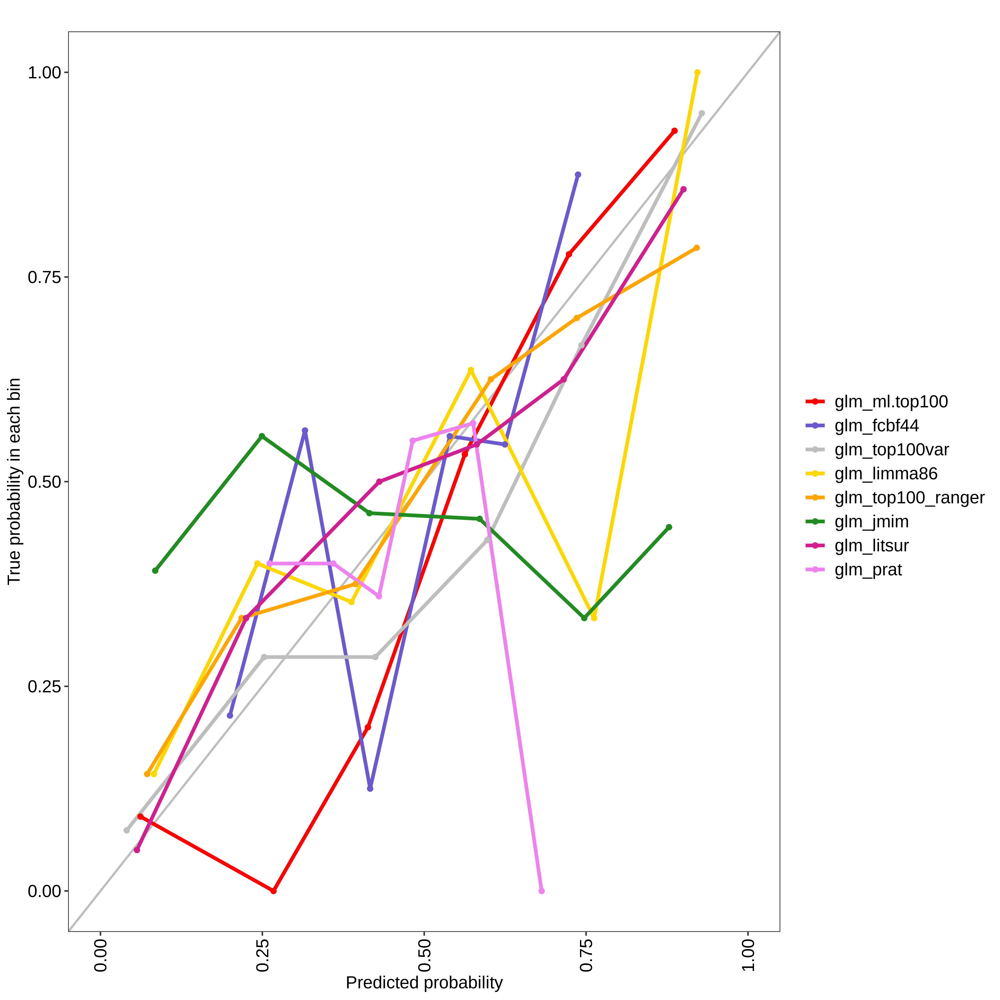

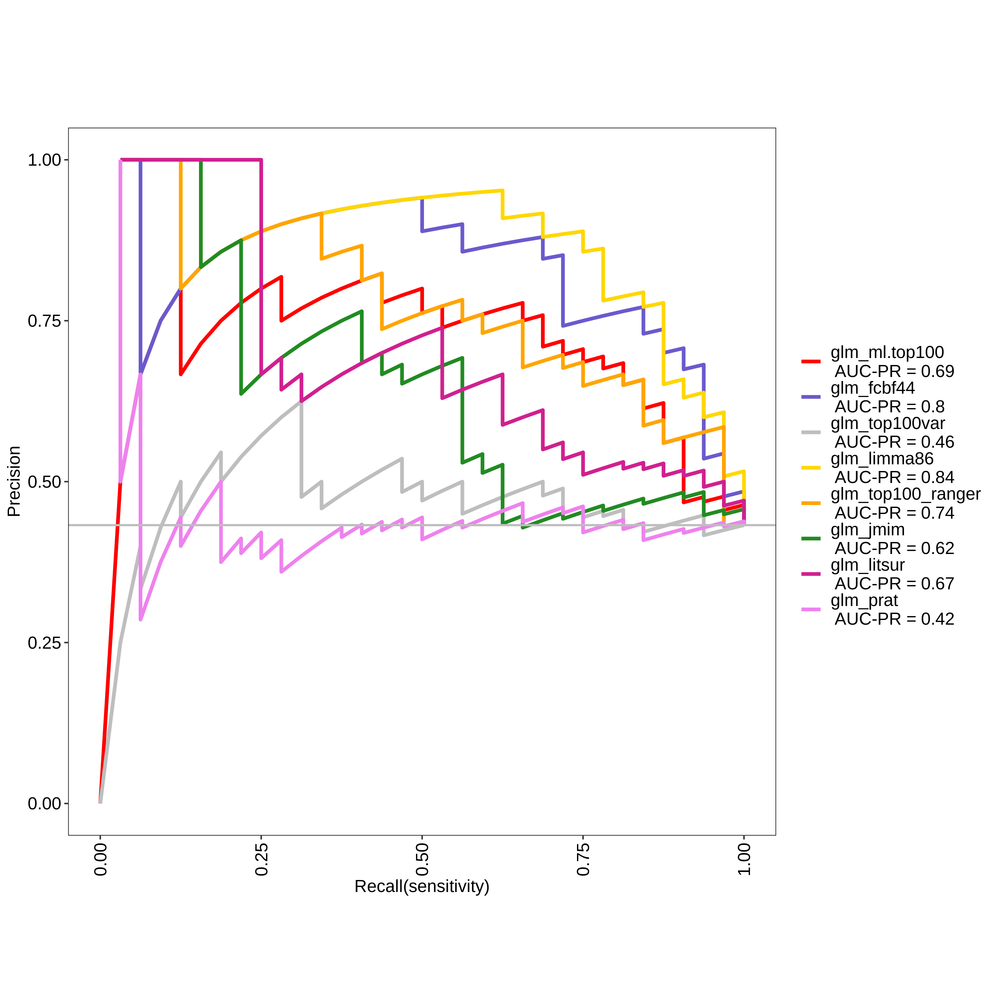

glm_ml.top100 Optimal Informedness = 0.526785714285714

glm_fcbf44 Optimal Informedness = 0.65327380952381

glm_top100var Optimal Informedness = 0.169642857142857

glm_limma86 Optimal Informedness = 0.686011904761905

glm_top100_ranger Optimal Informedness = 0.510416666666667

glm_jmim Optimal Informedness = 0.37202380952381

glm_litsur Optimal Informedness = 0.388392857142857

glm_prat Optimal Informedness = 0.0848214285714286

glm_ml.top100 AUC-ROC = 0.8

glm_fcbf44 AUC-ROC = 0.88

glm_top100var AUC-ROC = 0.56

glm_limma86 AUC-ROC = 0.9

glm_top100_ranger AUC-ROC = 0.81

glm_jmim AUC-ROC = 0.65

glm_litsur AUC-ROC = 0.73

glm_prat AUC-ROC = 0.49



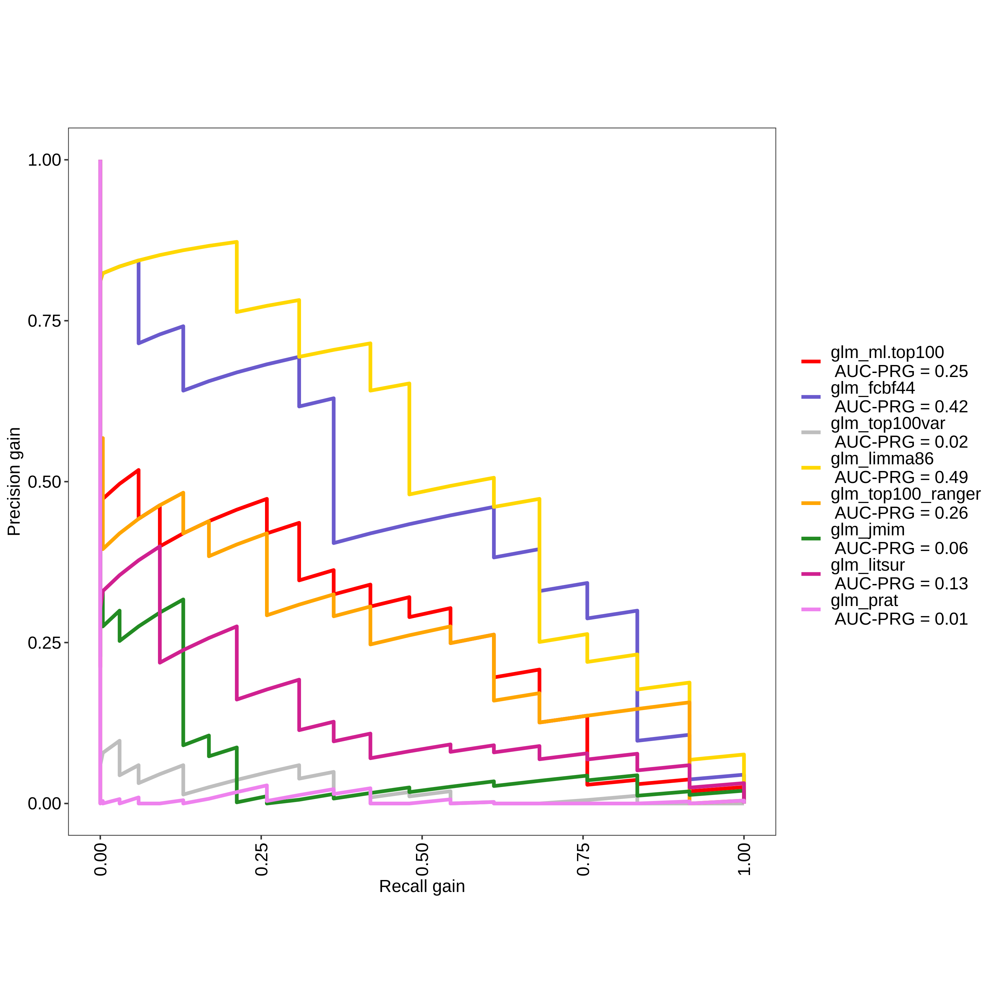

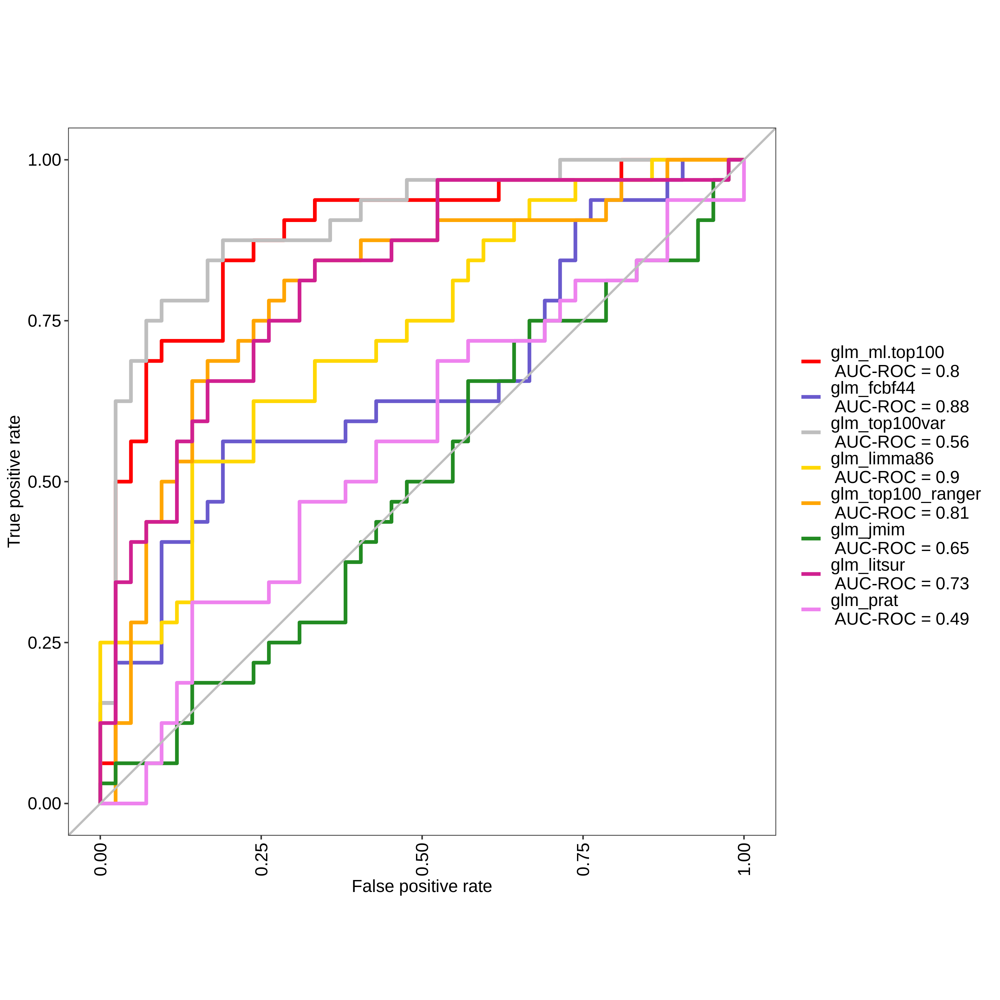

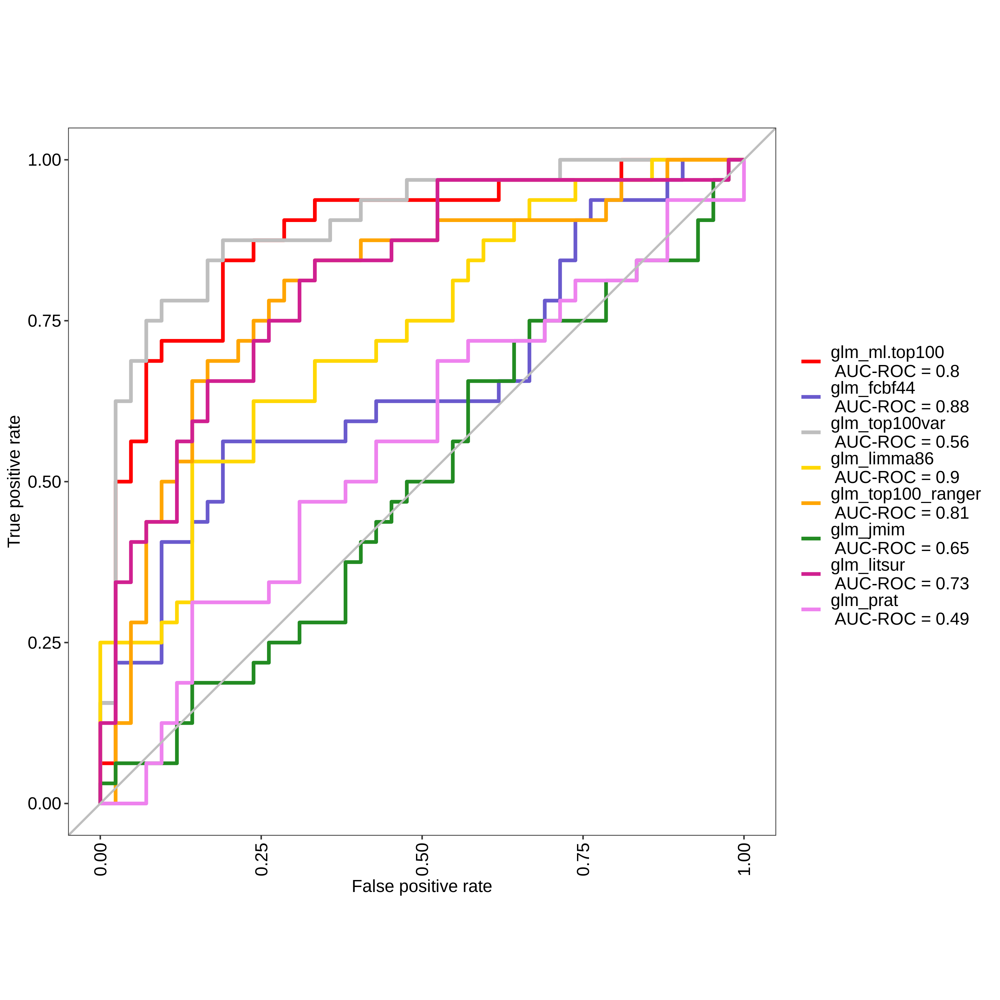

In [51]:
inp_top100_glm <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.100 >= 4, "Gene_ID"])],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf44_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf44.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100var_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top100var.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma86_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma86.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_top100_ranger_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp100))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_jmim_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_prat_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 300)
res_glm <- evalm(list(inp_top100_glm, inp_fcbf44_glm, inp_top100var_glm, inp_limma86_glm, inp_top100_ranger_glm, inp_jmim_glm, inp_litsur_glm, inp_prat_glm),
             gnames=c('glm_ml.top100', 'glm_fcbf44', 'glm_top100var', 'glm_limma86', 'glm_top100_ranger', 'glm_jmim', 'glm_litsur', 'glm_prat'))
res_glm$roc

## SVM

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 592

Number of groups: 8

Observations per group: 74

Positive: Y

Negative: N

Group: svm_ml.top100

Positive: 32

Negative: 42

Group: svm_fcbf44

Positive: 32

Negative: 42

Group: svm_top100var

Positive: 32

Negative: 42

Group: svm_limma86

Positive: 32

Negative: 42

Group: svm_top100_ranger

Positive: 32

Negative: 42

Group: svm_jmim

Positive: 32

Negative: 42

Group: svm_litsur

Positive: 32

Negative: 42

Group: svm_prat

Positive: 32

Negative: 42

***Performance Metrics***



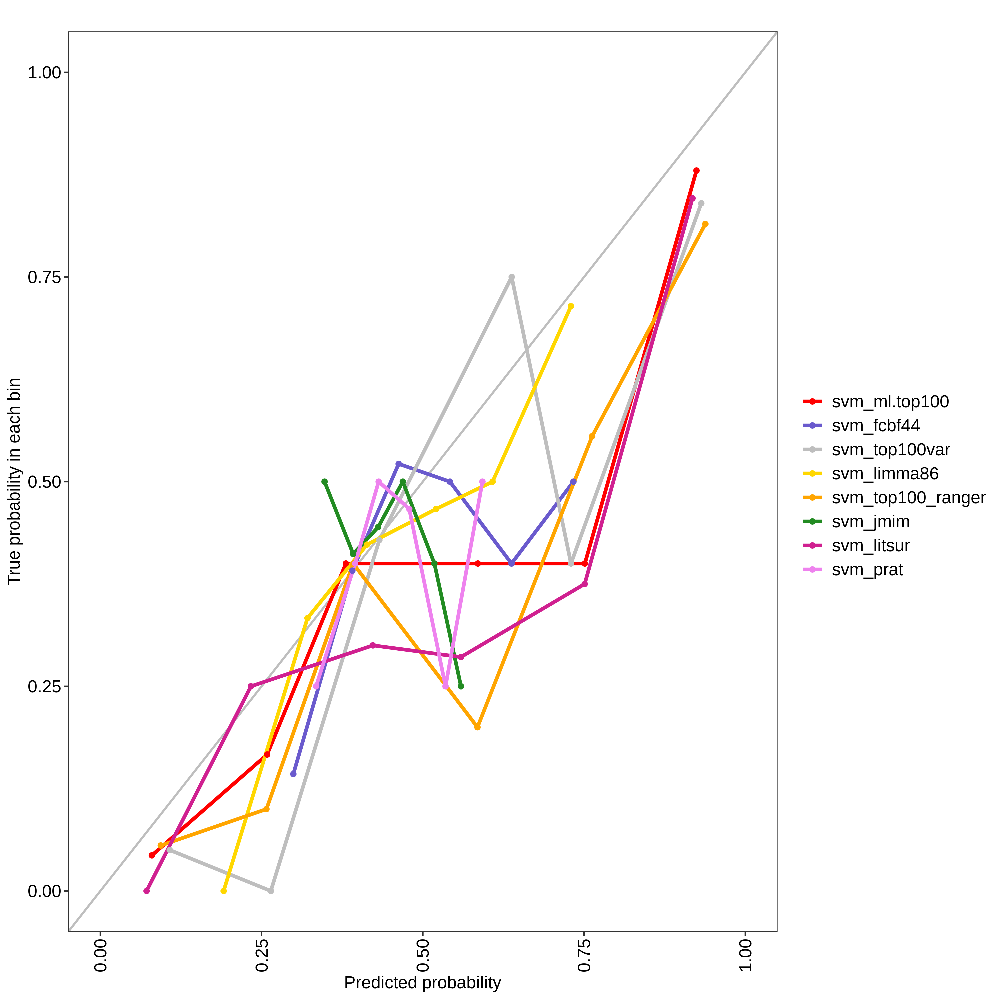

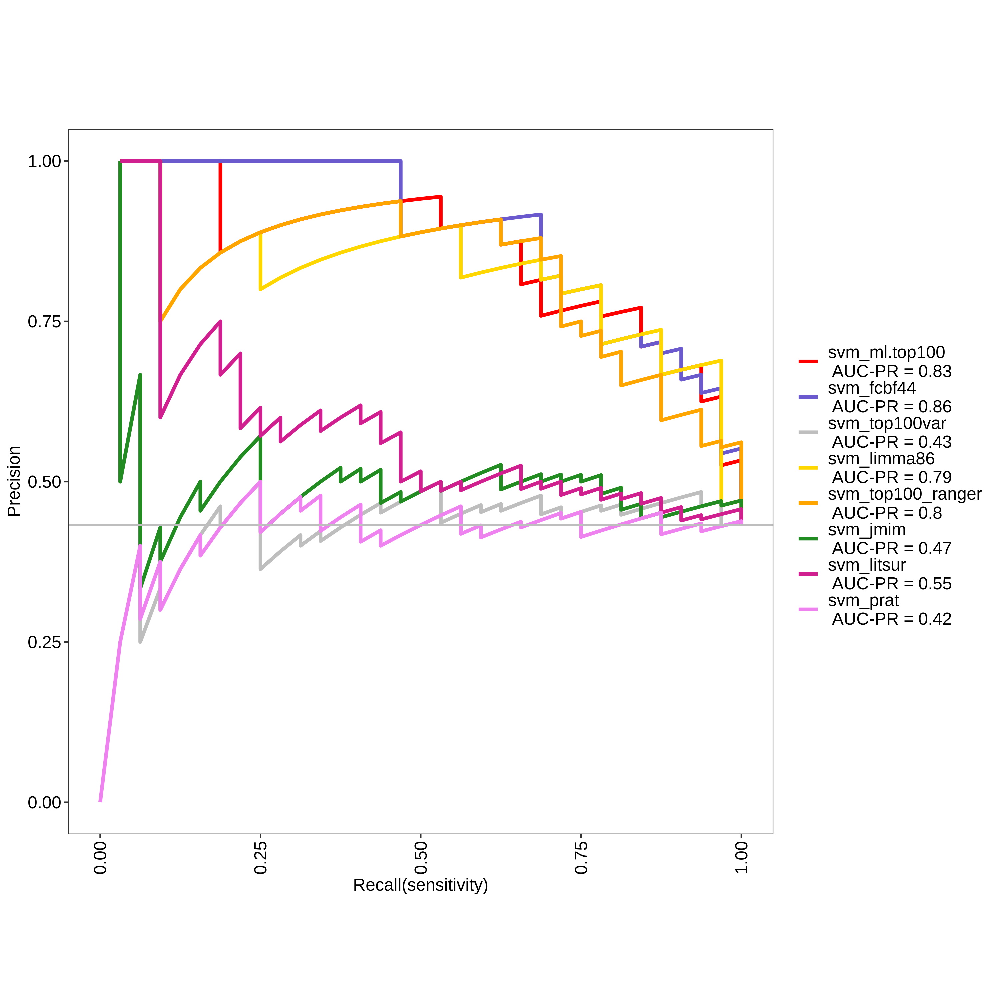

svm_ml.top100 Optimal Informedness = 0.65327380952381

svm_fcbf44 Optimal Informedness = 0.639880952380952

svm_top100var Optimal Informedness = 0.175595238095238

svm_limma86 Optimal Informedness = 0.638392857142857

svm_top100_ranger Optimal Informedness = 0.623511904761905

svm_jmim Optimal Informedness = 0.209821428571429

svm_litsur Optimal Informedness = 0.223214285714286

svm_prat Optimal Informedness = 0.0654761904761905

svm_ml.top100 AUC-ROC = 0.89

svm_fcbf44 AUC-ROC = 0.9

svm_top100var AUC-ROC = 0.54

svm_limma86 AUC-ROC = 0.88

svm_top100_ranger AUC-ROC = 0.87

svm_jmim AUC-ROC = 0.59

svm_litsur AUC-ROC = 0.62

svm_prat AUC-ROC = 0.5



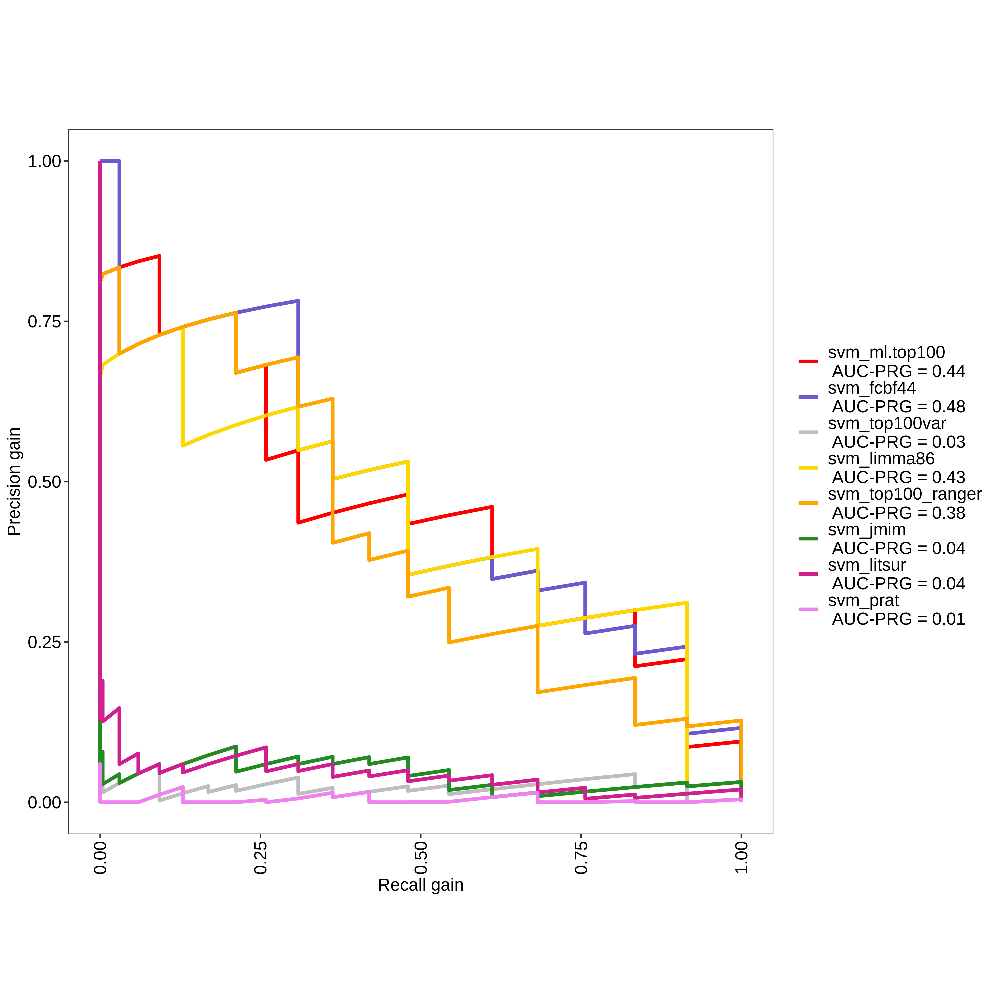

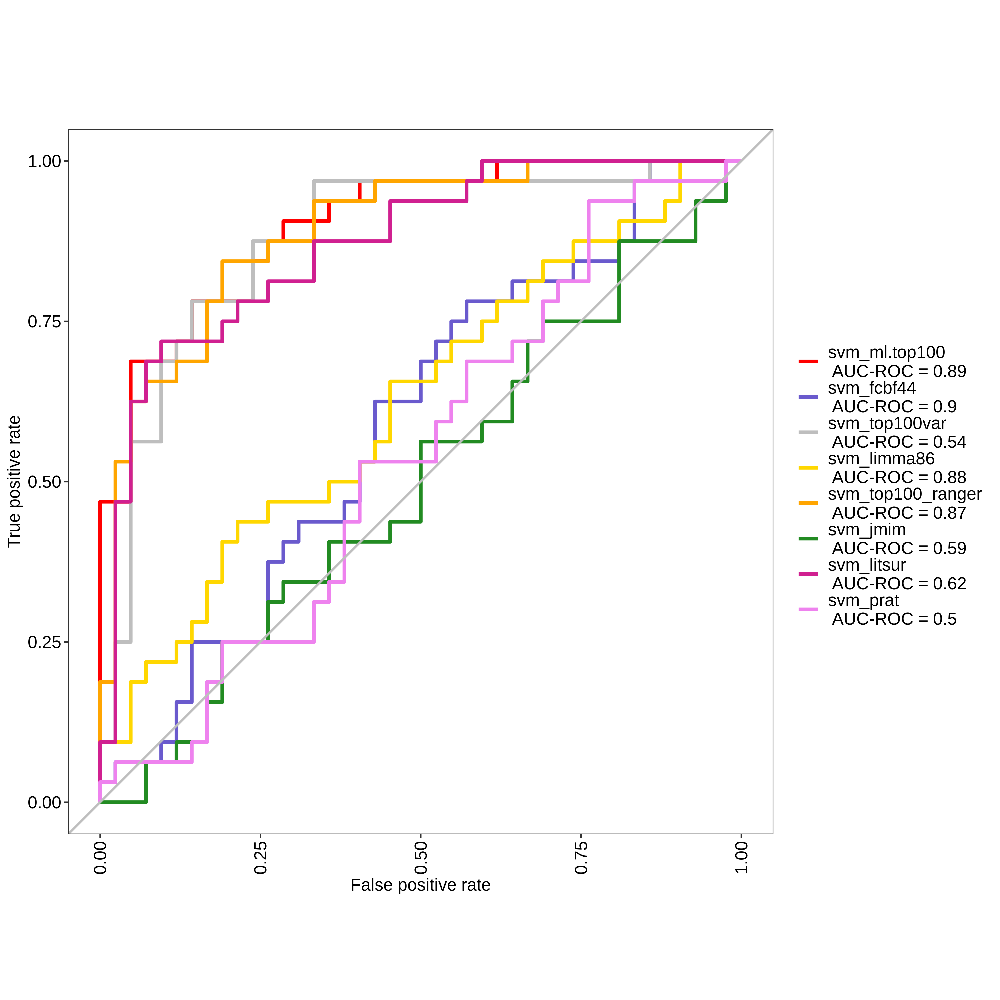

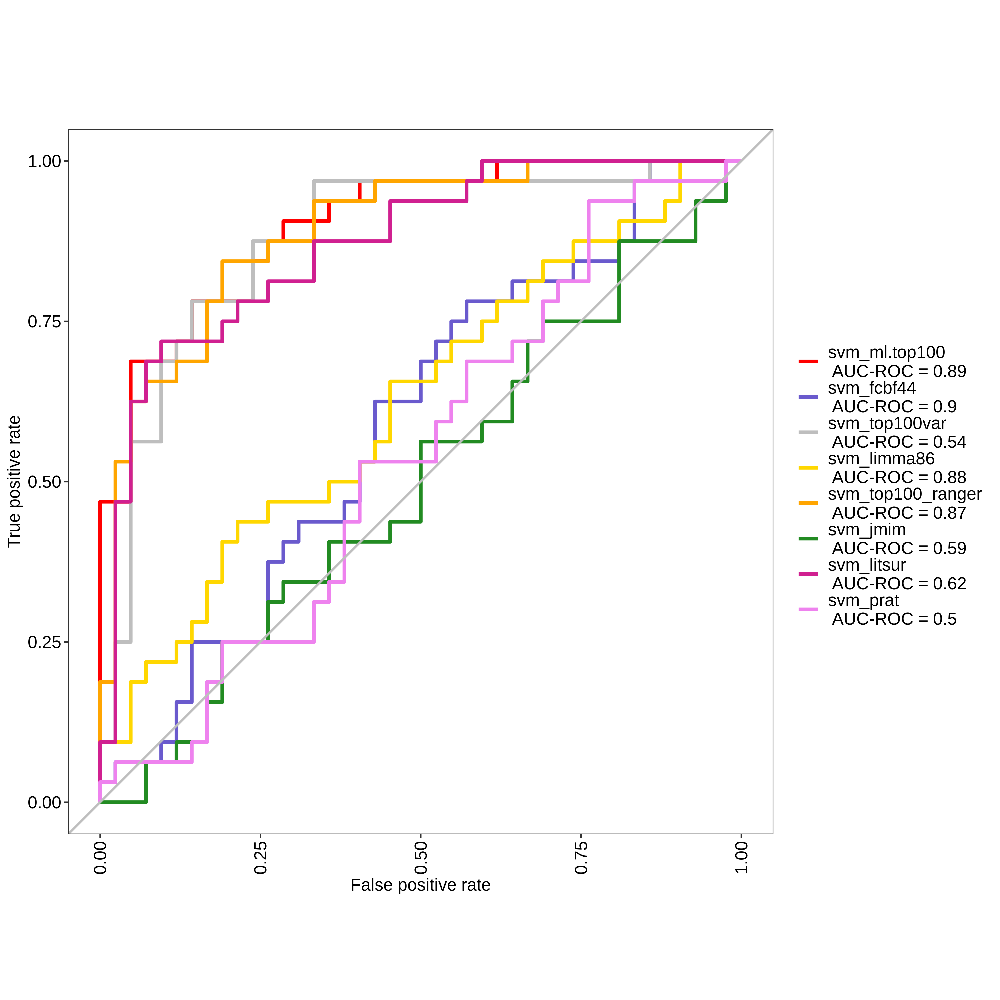

In [52]:
inp_top100_svm <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.100 >= 4, "Gene_ID"])],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf44_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf44.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100var_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top100var.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma86_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma86.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100_ranger_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp100))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_jmim_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_prat_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
res_svm <- evalm(list(inp_top100_svm, inp_fcbf44_svm, inp_top100var_svm, inp_limma86_svm, inp_top100_ranger_svm, inp_jmim_svm, inp_litsur_svm, inp_prat_svm),
             gnames=c('svm_ml.top100', 'svm_fcbf44', 'svm_top100var', 'svm_limma86', 'svm_top100_ranger', 'svm_jmim', 'svm_litsur', 'svm_prat'))
res_svm$roc

## PCA Neural Network

# weights:  60
initial  value 35.812642 
iter  10 value 11.858856
iter  20 value 10.453905
iter  30 value 10.450296
iter  40 value 10.427647
iter  50 value 10.426093
final  value 10.426041 
converged
# weights:  176
initial  value 41.733792 
iter  10 value 12.874922
iter  20 value 11.795081
iter  30 value 9.237335
iter  40 value 7.080050
iter  50 value 5.034659
iter  60 value 4.838107
iter  70 value 4.834661
iter  80 value 4.499793
iter  90 value 4.499457
iter 100 value 4.498944
final  value 4.498944 
stopped after 100 iterations
# weights:  292
initial  value 38.109841 
iter  10 value 14.160384
iter  20 value 14.000301
iter  30 value 14.000006
final  value 13.999966 
converged
# weights:  60
initial  value 37.050140 
iter  10 value 17.537686
iter  20 value 11.160007
iter  30 value 8.706618
iter  40 value 8.650645
iter  50 value 8.649586
iter  60 value 8.649567
final  value 8.649567 
converged
# weights:  176
initial  value 38.165354 
iter  10 value 11.296783
iter  20 value 6.922655
it

initial  value 35.001482 
iter  10 value 11.063310
iter  20 value 8.286548
iter  30 value 3.635680
iter  40 value 3.500787
iter  50 value 3.412366
iter  60 value 2.639031
iter  70 value 2.500816
iter  80 value 2.497658
iter  90 value 1.989037
iter 100 value 1.503019
final  value 1.503019 
stopped after 100 iterations
# weights:  59
initial  value 35.272822 
iter  10 value 17.383292
iter  20 value 11.581538
iter  30 value 9.945452
iter  40 value 9.932637
final  value 9.932616 
converged
# weights:  173
initial  value 32.926591 
iter  10 value 10.655887
iter  20 value 6.786087
iter  30 value 6.504683
iter  40 value 6.499863
iter  50 value 6.499858
final  value 6.499858 
converged
# weights:  287
initial  value 38.337579 
iter  10 value 9.557563
iter  20 value 5.736826
iter  30 value 5.030354
iter  40 value 4.915995
iter  50 value 4.884658
iter  60 value 4.884450
iter  70 value 4.866744
iter  80 value 4.864055
iter  90 value 4.864016
final  value 4.864016 
converged
# weights:  59
initial

initial  value 40.680921 
iter  10 value 12.289996
iter  20 value 5.720489
iter  30 value 5.000713
iter  40 value 4.820305
iter  50 value 4.604227
iter  60 value 4.570720
iter  70 value 4.570391
iter  80 value 4.560981
iter  90 value 4.558525
final  value 4.558513 
converged
# weights:  59
initial  value 33.157879 
iter  10 value 12.641385
iter  20 value 12.235634
iter  30 value 12.215246
iter  40 value 12.213762
iter  50 value 8.976284
iter  60 value 8.957262
iter  70 value 8.956522
iter  80 value 8.954476
iter  90 value 8.953462
iter 100 value 7.382922
final  value 7.382922 
stopped after 100 iterations
# weights:  173
initial  value 41.286630 
iter  10 value 17.895881
iter  20 value 16.084738
iter  30 value 14.683009
iter  40 value 13.893387
iter  50 value 11.608845
iter  60 value 10.602671
iter  70 value 10.401344
iter  80 value 9.371244
iter  90 value 9.286895
iter 100 value 9.134423
final  value 9.134423 
stopped after 100 iterations
# weights:  287
initial  value 39.210138 
iter

initial  value 35.416057 
iter  10 value 16.152176
iter  20 value 14.161660
iter  30 value 14.141989
iter  40 value 13.242282
iter  50 value 13.121503
iter  60 value 13.108457
iter  70 value 13.089352
iter  80 value 13.048169
iter  90 value 12.424209
iter 100 value 12.071557
final  value 12.071557 
stopped after 100 iterations
# weights:  59
initial  value 38.629403 
iter  10 value 9.305772
iter  20 value 8.972136
iter  30 value 8.971649
iter  40 value 8.971545
final  value 8.971453 
converged
# weights:  173
initial  value 39.702628 
iter  10 value 11.022599
iter  20 value 9.561958
iter  30 value 9.331786
iter  40 value 8.064743
iter  50 value 6.132313
iter  60 value 6.009274
iter  70 value 6.001870
iter  80 value 6.000973
iter  90 value 6.000387
final  value 6.000226 
converged
# weights:  287
initial  value 31.035428 
iter  10 value 11.979052
iter  20 value 3.610241
iter  30 value 3.501177
iter  40 value 3.500608
iter  50 value 3.500126
iter  60 value 3.500036
iter  70 value 3.49990

initial  value 36.712133 
iter  10 value 8.333386
iter  20 value 5.904928
iter  30 value 5.710462
iter  40 value 5.682353
iter  50 value 3.923835
iter  60 value 3.918198
iter  70 value 3.917601
iter  80 value 3.915095
iter  90 value 3.910552
iter 100 value 3.896265
final  value 3.896265 
stopped after 100 iterations
# weights:  59
initial  value 34.528447 
iter  10 value 13.465620
iter  20 value 8.676305
iter  30 value 8.486149
iter  40 value 8.484287
final  value 8.484287 
converged
# weights:  173
initial  value 37.374436 
iter  10 value 10.717356
iter  20 value 7.366018
iter  30 value 5.830439
iter  40 value 5.109731
iter  50 value 4.747446
iter  60 value 4.703182
iter  70 value 4.703067
iter  70 value 4.703067
iter  70 value 4.703067
final  value 4.703067 
converged
# weights:  287
initial  value 45.751728 
iter  10 value 10.565121
iter  20 value 4.750596
iter  30 value 4.231248
iter  40 value 4.192389
iter  50 value 4.136125
iter  60 value 4.133578
final  value 4.133571 
converged

initial  value 35.897527 
iter  10 value 9.256486
iter  20 value 5.255398
iter  30 value 4.950871
iter  40 value 4.827544
iter  50 value 4.826876
final  value 4.826875 
converged
# weights:  287
initial  value 43.386783 
iter  10 value 7.916373
iter  20 value 4.929992
iter  30 value 4.379727
iter  40 value 4.225106
iter  50 value 4.217079
iter  60 value 4.217053
iter  60 value 4.217053
iter  60 value 4.217053
final  value 4.217053 
converged
# weights:  59
initial  value 35.694057 
iter  10 value 10.076044
iter  20 value 10.032354
iter  30 value 10.013164
iter  40 value 9.921711
iter  50 value 9.885942
iter  60 value 9.859783
iter  70 value 9.816277
iter  80 value 9.703964
iter  90 value 9.651535
iter 100 value 9.544323
final  value 9.544323 
stopped after 100 iterations
# weights:  173
initial  value 35.348606 
iter  10 value 12.553197
iter  20 value 12.117023
iter  30 value 12.042958
iter  40 value 11.918715
iter  50 value 9.339398
iter  60 value 5.957047
iter  70 value 5.073432
iter

initial  value 35.741116 
iter  10 value 7.402972
iter  20 value 3.764009
iter  30 value 3.509392
iter  40 value 2.626173
iter  50 value 2.101958
iter  60 value 2.022601
iter  70 value 1.927734
iter  80 value 1.706174
iter  90 value 1.456183
iter 100 value 1.439849
final  value 1.439849 
stopped after 100 iterations
# weights:  287
initial  value 39.388122 
iter  10 value 15.181891
iter  20 value 12.136488
iter  30 value 12.087017
iter  40 value 10.110635
iter  50 value 10.022702
iter  60 value 9.064925
iter  70 value 7.022818
iter  80 value 5.935542
iter  90 value 5.912774
iter 100 value 2.826778
final  value 2.826778 
stopped after 100 iterations
# weights:  59
initial  value 34.087098 
iter  10 value 16.763081
iter  20 value 10.883374
iter  30 value 7.813025
iter  40 value 5.679717
iter  50 value 3.883263
iter  60 value 3.879652
iter  70 value 3.879036
iter  80 value 3.878622
iter  90 value 3.878483
iter 100 value 3.878476
final  value 3.878476 
stopped after 100 iterations
# weight

initial  value 35.403575 
iter  10 value 8.270252
iter  20 value 5.432219
iter  30 value 5.390651
iter  40 value 5.262485
iter  50 value 5.261681
iter  60 value 4.947607
iter  70 value 3.408417
iter  80 value 3.334778
iter  90 value 3.333605
iter 100 value 3.333506
final  value 3.333506 
stopped after 100 iterations
# weights:  292
initial  value 34.530797 
iter  10 value 14.000040
final  value 13.999989 
converged
# weights:  60
initial  value 37.697761 
iter  10 value 13.712859
iter  20 value 11.279622
iter  30 value 8.778204
iter  40 value 8.756311
final  value 8.756254 
converged
# weights:  176
initial  value 39.714379 
iter  10 value 11.032687
iter  20 value 5.820344
iter  30 value 5.070743
iter  40 value 5.028970
iter  50 value 5.028897
final  value 5.028897 
converged
# weights:  292
initial  value 43.405933 
iter  10 value 8.809805
iter  20 value 5.478357
iter  30 value 4.480753
iter  40 value 4.250867
iter  50 value 4.242509
iter  60 value 4.222544
iter  70 value 4.221211
fin

initial  value 34.811529 
iter  10 value 12.109394
iter  20 value 12.108815
iter  30 value 12.108227
iter  40 value 12.107629
iter  50 value 12.107017
iter  60 value 12.106390
iter  70 value 12.105745
iter  80 value 12.105077
iter  90 value 12.104380
iter 100 value 12.103645
final  value 12.103645 
stopped after 100 iterations
# weights:  176
initial  value 39.070180 
iter  10 value 10.123884
iter  20 value 6.592853
iter  30 value 1.989220
iter  40 value 1.759751
iter  50 value 0.110215
iter  60 value 0.097020
iter  70 value 0.093592
iter  80 value 0.086413
iter  90 value 0.079592
iter 100 value 0.076548
final  value 0.076548 
stopped after 100 iterations
# weights:  292
initial  value 35.282966 
iter  10 value 8.377624
iter  20 value 0.229028
iter  30 value 0.113589
iter  40 value 0.105578
iter  50 value 0.100369
iter  60 value 0.078292
iter  70 value 0.073547
iter  80 value 0.067601
iter  90 value 0.057773
iter 100 value 0.049028
final  value 0.049028 
stopped after 100 iterations
# 

initial  value 33.195041 
iter  10 value 5.777767
iter  20 value 4.561593
iter  30 value 3.607148
iter  40 value 3.423088
iter  50 value 3.082483
iter  60 value 3.069209
iter  70 value 3.055755
iter  80 value 3.046467
iter  90 value 3.037724
iter 100 value 2.091618
final  value 2.091618 
stopped after 100 iterations
# weights:  64
initial  value 36.987803 
iter  10 value 19.895774
iter  20 value 18.366367
iter  30 value 15.040674
iter  40 value 13.038702
iter  50 value 11.122274
iter  60 value 11.101993
iter  70 value 9.127979
iter  80 value 9.122327
iter  90 value 7.514921
iter 100 value 7.500464
final  value 7.500464 
stopped after 100 iterations
# weights:  42
initial  value 34.173013 
iter  10 value 5.865180
iter  20 value 5.780670
iter  30 value 5.760094
iter  40 value 5.759524
iter  50 value 5.759270
iter  60 value 5.759238
iter  70 value 5.759163
final  value 5.759163 
converged
# weights:  122
initial  value 31.733094 
iter  10 value 16.069001
iter  20 value 11.571582
iter  30 

initial  value 41.203735 
iter  10 value 6.001354
iter  20 value 5.991607
iter  30 value 5.987671
iter  40 value 5.977555
iter  50 value 5.905562
iter  60 value 5.021203
iter  70 value 4.999004
iter  80 value 4.948141
iter  90 value 4.059742
iter 100 value 4.000408
final  value 4.000408 
stopped after 100 iterations
# weights:  43
initial  value 36.718737 
iter  10 value 12.743974
iter  20 value 9.544326
iter  30 value 9.488074
final  value 9.488054 
converged
# weights:  125
initial  value 36.319183 
iter  10 value 8.530780
iter  20 value 7.214621
iter  30 value 7.207390
iter  40 value 7.151461
iter  50 value 6.969564
iter  60 value 6.540553
iter  70 value 6.500574
final  value 6.500376 
converged
# weights:  207
initial  value 40.285777 
iter  10 value 9.924440
iter  20 value 6.981417
iter  30 value 6.318260
iter  40 value 6.078757
iter  50 value 5.968852
iter  60 value 5.959294
iter  70 value 5.959238
iter  70 value 5.959238
iter  70 value 5.959238
final  value 5.959238 
converged
#

initial  value 34.888551 
iter  10 value 12.032876
iter  20 value 11.147751
iter  30 value 10.969024
iter  40 value 10.089245
iter  50 value 9.008614
iter  60 value 8.669105
iter  70 value 8.654716
iter  80 value 8.635499
iter  90 value 8.604652
iter 100 value 7.544224
final  value 7.544224 
stopped after 100 iterations
# weights:  125
initial  value 34.847854 
iter  10 value 2.088523
iter  20 value 2.072107
iter  30 value 2.054870
iter  40 value 2.048212
iter  50 value 2.040054
iter  60 value 2.031097
iter  70 value 2.028914
iter  80 value 2.027345
iter  90 value 2.025439
iter 100 value 2.023573
final  value 2.023573 
stopped after 100 iterations
# weights:  207
initial  value 34.632131 
iter  10 value 2.159511
iter  20 value 2.090310
iter  30 value 2.062924
iter  40 value 2.041941
iter  50 value 2.036571
iter  60 value 2.031639
iter  70 value 2.029538
iter  80 value 2.025298
iter  90 value 2.023109
iter 100 value 2.021060
final  value 2.021060 
stopped after 100 iterations
# weights:

initial  value 34.885181 
iter  10 value 9.943893
iter  20 value 9.725233
iter  30 value 9.630963
iter  40 value 9.627373
iter  50 value 9.615358
iter  60 value 9.589241
iter  70 value 9.586680
iter  80 value 9.586376
iter  90 value 9.585832
iter 100 value 9.583289
final  value 9.583289 
stopped after 100 iterations
# weights:  202
initial  value 38.527377 
iter  10 value 5.057505
iter  20 value 2.569576
iter  30 value 2.049121
iter  40 value 2.002261
iter  50 value 2.000103
iter  60 value 2.000043
iter  70 value 2.000030
iter  80 value 2.000008
iter  90 value 2.000001
iter  90 value 2.000001
iter  90 value 2.000001
final  value 2.000001 
converged
# weights:  42
initial  value 35.400013 
iter  10 value 11.270796
iter  20 value 9.546950
iter  30 value 9.531405
final  value 9.531404 
converged
# weights:  122
initial  value 37.217732 
iter  10 value 11.025811
iter  20 value 7.596359
iter  30 value 6.500318
iter  40 value 6.292884
iter  50 value 6.291692
final  value 6.291689 
converged


initial  value 39.553718 
iter  10 value 9.055958
iter  20 value 6.712009
iter  30 value 6.306306
iter  40 value 6.279988
iter  50 value 6.223417
iter  60 value 6.189484
iter  70 value 6.186118
final  value 6.186102 
converged
# weights:  42
initial  value 39.198487 
iter  10 value 10.054414
iter  20 value 9.948296
iter  30 value 7.918349
iter  40 value 7.724674
iter  50 value 7.660951
iter  60 value 3.947400
iter  70 value 3.920139
iter  80 value 3.913414
iter  90 value 3.908974
iter 100 value 3.905005
final  value 3.905005 
stopped after 100 iterations
# weights:  122
initial  value 37.202370 
iter  10 value 4.096586
iter  20 value 4.022148
iter  30 value 2.131344
iter  40 value 2.101409
iter  50 value 2.072681
iter  60 value 2.062853
iter  70 value 2.056803
iter  80 value 2.045160
iter  90 value 2.037534
iter 100 value 2.031495
final  value 2.031495 
stopped after 100 iterations
# weights:  202
initial  value 33.933207 
iter  10 value 6.068241
iter  20 value 6.045096
iter  30 value 

initial  value 33.789485 
iter  10 value 5.740201
iter  20 value 3.756910
iter  30 value 1.952712
iter  40 value 1.950087
iter  50 value 1.949085
iter  60 value 1.948991
iter  70 value 1.948741
iter  80 value 1.948740
iter  90 value 1.948724
final  value 1.948723 
converged
# weights:  122
initial  value 32.573770 
iter  10 value 10.020727
iter  20 value 9.992891
iter  30 value 9.991875
iter  40 value 9.990500
iter  50 value 9.988523
iter  60 value 9.985406
iter  70 value 9.979403
iter  80 value 7.980511
iter  90 value 5.910802
iter 100 value 4.032582
final  value 4.032582 
stopped after 100 iterations
# weights:  202
initial  value 39.242594 
iter  10 value 2.057859
iter  20 value 2.006826
iter  30 value 2.000110
iter  40 value 2.000004
final  value 2.000001 
converged
# weights:  42
initial  value 36.537291 
iter  10 value 12.306405
iter  20 value 9.589137
iter  30 value 9.496040
final  value 9.495737 
converged
# weights:  122
initial  value 33.577896 
iter  10 value 8.702882
iter  

initial  value 38.011902 
iter  10 value 9.356718
iter  20 value 7.152077
iter  30 value 7.118024
final  value 7.117965 
converged
# weights:  202
initial  value 34.555332 
iter  10 value 8.019113
iter  20 value 6.691207
iter  30 value 6.496577
iter  40 value 6.491205
iter  50 value 6.491080
final  value 6.491079 
converged
# weights:  42
initial  value 37.651676 
iter  10 value 20.714569
iter  20 value 7.411713
iter  30 value 2.043091
iter  40 value 1.992353
iter  50 value 1.990500
iter  60 value 1.983661
iter  70 value 1.979471
iter  80 value 1.977551
iter  90 value 1.977149
iter 100 value 1.976875
final  value 1.976875 
stopped after 100 iterations
# weights:  122
initial  value 34.401407 
iter  10 value 3.785061
iter  20 value 2.112959
iter  30 value 2.101797
iter  40 value 2.095008
iter  50 value 2.075932
iter  60 value 2.060430
iter  70 value 2.051729
iter  80 value 2.045758
iter  90 value 2.036966
iter 100 value 2.025618
final  value 2.025618 
stopped after 100 iterations
# weig

initial  value 41.982243 
iter  10 value 4.204150
iter  20 value 4.065552
iter  30 value 3.920722
iter  40 value 3.089000
iter  50 value 2.980480
iter  60 value 2.095985
iter  70 value 2.088175
iter  80 value 2.079937
iter  90 value 2.062355
iter 100 value 2.043941
final  value 2.043941 
stopped after 100 iterations
# weights:  42
initial  value 33.101942 
iter  10 value 5.996342
iter  20 value 5.995662
iter  30 value 5.995602
iter  40 value 5.995540
iter  50 value 5.995475
iter  60 value 5.995406
iter  70 value 5.995334
iter  80 value 5.995258
iter  90 value 5.995177
iter 100 value 5.995091
final  value 5.995091 
stopped after 100 iterations
# weights:  122
initial  value 41.673023 
iter  10 value 6.939688
iter  20 value 2.005202
iter  30 value 2.001025
iter  40 value 2.000408
iter  50 value 2.000148
iter  60 value 1.999898
iter  70 value 1.999616
iter  80 value 1.996370
iter  90 value 1.992454
iter 100 value 1.991150
final  value 1.991150 
stopped after 100 iterations
# weights:  202

initial  value 34.502153 
iter  10 value 6.051979
iter  20 value 4.004678
iter  30 value 3.996079
iter  40 value 3.991849
iter  50 value 3.934267
iter  60 value 1.903931
iter  70 value 0.076333
iter  80 value 0.003166
iter  90 value 0.001278
iter 100 value 0.000607
final  value 0.000607 
stopped after 100 iterations
# weights:  202
initial  value 33.183498 
iter  10 value 4.016165
iter  20 value 3.959229
iter  30 value 2.282605
iter  40 value 2.001727
iter  50 value 2.000209
iter  60 value 2.000146
iter  70 value 2.000018
final  value 2.000002 
converged
# weights:  42
initial  value 36.158591 
iter  10 value 11.672725
iter  20 value 9.385570
iter  30 value 9.372329
iter  30 value 9.372329
iter  30 value 9.372329
final  value 9.372329 
converged
# weights:  122
initial  value 33.285695 
iter  10 value 8.581199
iter  20 value 7.013380
iter  30 value 6.978172
iter  40 value 6.978015
final  value 6.978015 
converged
# weights:  202
initial  value 38.693756 
iter  10 value 8.270229
iter  2

initial  value 33.129490 
iter  10 value 17.346507
iter  20 value 8.139808
iter  30 value 3.734086
iter  40 value 3.368605
iter  50 value 3.232136
iter  60 value 3.000395
iter  70 value 3.000055
final  value 3.000009 
converged
# weights:  54
initial  value 35.200425 
iter  10 value 27.636261
iter  20 value 22.599652
iter  30 value 21.033488
iter  40 value 18.465319
iter  50 value 14.899176
iter  60 value 12.400098
iter  70 value 11.782861
iter  80 value 11.779044
iter  90 value 11.778553
final  value 11.778552 
converged
# weights:  158
initial  value 38.970022 
iter  10 value 20.148703
iter  20 value 9.673318
iter  30 value 7.979912
iter  40 value 7.828533
iter  50 value 7.773760
iter  60 value 7.770967
iter  70 value 7.770953
iter  70 value 7.770953
iter  70 value 7.770953
final  value 7.770953 
converged
# weights:  262
initial  value 38.104099 
iter  10 value 16.576413
iter  20 value 9.019519
iter  30 value 7.566478
iter  40 value 7.293210
iter  50 value 7.195070
iter  60 value 7.

initial  value 36.582617 
iter  10 value 19.721556
iter  20 value 13.420017
iter  30 value 12.772446
iter  40 value 12.758063
final  value 12.758021 
converged
# weights:  158
initial  value 36.776392 
iter  10 value 15.924829
iter  20 value 9.132595
iter  30 value 8.674656
iter  40 value 8.497724
iter  50 value 8.366509
iter  60 value 8.350151
iter  70 value 8.349990
final  value 8.349987 
converged
# weights:  262
initial  value 46.436602 
iter  10 value 18.063047
iter  20 value 10.498408
iter  30 value 7.676657
iter  40 value 7.402485
iter  50 value 7.304245
iter  60 value 7.292375
iter  70 value 7.290987
iter  80 value 7.290788
final  value 7.290786 
converged
# weights:  54
initial  value 34.127466 
iter  10 value 20.112895
iter  20 value 14.630703
iter  30 value 14.405187
iter  40 value 13.164055
iter  50 value 13.158811
iter  60 value 13.157687
iter  70 value 13.156755
iter  80 value 11.167601
iter  90 value 9.030805
iter 100 value 8.968433
final  value 8.968433 
stopped after 1

initial  value 33.631297 
iter  10 value 24.650637
iter  20 value 14.544541
iter  30 value 12.905259
iter  40 value 11.790300
iter  50 value 11.727897
final  value 11.727758 
converged
# weights:  158
initial  value 46.740051 
iter  10 value 16.309481
iter  20 value 9.292948
iter  30 value 7.856338
iter  40 value 7.706750
iter  50 value 7.704398
final  value 7.704360 
converged
# weights:  262
initial  value 39.392879 
iter  10 value 16.810107
iter  20 value 8.934497
iter  30 value 7.913488
iter  40 value 7.630923
iter  50 value 7.423590
iter  60 value 7.412884
iter  70 value 7.411889
iter  80 value 7.411852
final  value 7.411851 
converged
# weights:  54
initial  value 33.437591 
iter  10 value 21.844694
iter  20 value 15.422446
iter  30 value 15.273964
iter  40 value 13.634530
iter  50 value 13.627976
iter  60 value 13.619441
iter  70 value 13.603903
iter  80 value 11.854473
iter  90 value 11.851705
iter 100 value 11.847506
final  value 11.847506 
stopped after 100 iterations
# weigh

initial  value 38.438422 
iter  10 value 17.824097
iter  20 value 12.307833
iter  30 value 9.544204
iter  40 value 8.437297
iter  50 value 8.378564
iter  60 value 8.028653
iter  70 value 7.966322
iter  80 value 7.963233
iter  90 value 7.963162
final  value 7.963161 
converged
# weights:  267
initial  value 45.848358 
iter  10 value 16.939940
iter  20 value 9.945813
iter  30 value 8.121985
iter  40 value 7.962101
iter  50 value 7.788004
iter  60 value 7.660033
iter  70 value 7.567437
iter  80 value 7.563055
iter  90 value 7.562995
iter 100 value 7.562986
final  value 7.562986 
stopped after 100 iterations
# weights:  55
initial  value 34.148335 
iter  10 value 24.216473
iter  20 value 17.049346
iter  30 value 16.811362
iter  40 value 15.495107
iter  50 value 12.505200
iter  60 value 12.442860
iter  70 value 9.302575
iter  80 value 9.280399
iter  90 value 9.196616
iter 100 value 7.510032
final  value 7.510032 
stopped after 100 iterations
# weights:  161
initial  value 38.828732 
iter  1

initial  value 33.731172 
iter  10 value 17.410404
iter  20 value 11.815196
iter  30 value 11.318060
iter  40 value 11.316811
final  value 11.316810 
converged
# weights:  158
initial  value 36.070296 
iter  10 value 14.399283
iter  20 value 8.958184
iter  30 value 7.968535
iter  40 value 7.487971
iter  50 value 7.300354
iter  60 value 7.291761
final  value 7.291710 
converged
# weights:  262
initial  value 37.837872 
iter  10 value 16.060711
iter  20 value 8.612892
iter  30 value 7.534089
iter  40 value 6.951950
iter  50 value 6.840388
iter  60 value 6.836516
iter  70 value 6.836023
final  value 6.836017 
converged
# weights:  54
initial  value 34.173903 
iter  10 value 19.385085
iter  20 value 18.498849
iter  30 value 18.449395
iter  40 value 18.104403
iter  50 value 17.212190
iter  60 value 16.792837
iter  70 value 16.789232
iter  80 value 15.244607
iter  90 value 10.788838
iter 100 value 10.768704
final  value 10.768704 
stopped after 100 iterations
# weights:  158
initial  value 3

initial  value 43.548344 
iter  10 value 15.414354
iter  20 value 8.814732
iter  30 value 8.114664
iter  40 value 7.760723
iter  50 value 7.569835
iter  60 value 7.512850
iter  70 value 7.443993
iter  80 value 7.342592
iter  90 value 7.338017
iter 100 value 7.337917
final  value 7.337917 
stopped after 100 iterations
# weights:  54
initial  value 36.083476 
iter  10 value 22.909093
iter  20 value 20.905355
iter  30 value 18.140565
iter  40 value 16.927275
iter  50 value 14.096032
iter  60 value 14.068105
iter  70 value 10.932618
iter  80 value 9.286570
iter  90 value 9.273333
iter 100 value 9.271323
final  value 9.271323 
stopped after 100 iterations
# weights:  158
initial  value 33.875146 
iter  10 value 17.939669
iter  20 value 10.129121
iter  30 value 8.970383
iter  40 value 8.946470
iter  50 value 8.764897
iter  60 value 8.751658
iter  70 value 8.743274
iter  80 value 7.401070
iter  90 value 6.364033
iter 100 value 5.727540
final  value 5.727540 
stopped after 100 iterations
# wei

initial  value 40.743514 
iter  10 value 17.826431
iter  20 value 9.321306
iter  30 value 7.932257
iter  40 value 7.839076
iter  50 value 7.751995
iter  60 value 7.745216
final  value 7.745178 
converged
# weights:  262
initial  value 42.179798 
iter  10 value 13.754437
iter  20 value 8.215392
iter  30 value 7.558079
iter  40 value 7.403994
iter  50 value 7.344929
iter  60 value 7.134873
iter  70 value 7.083625
iter  80 value 7.080510
final  value 7.080491 
converged
# weights:  54
initial  value 36.107120 
iter  10 value 16.376042
iter  20 value 12.314698
iter  30 value 12.241960
iter  40 value 12.239501
iter  50 value 12.235109
iter  60 value 12.232923
iter  70 value 10.774021
iter  80 value 10.764807
iter  90 value 10.764050
iter 100 value 10.763157
final  value 10.763157 
stopped after 100 iterations
# weights:  158
initial  value 44.717845 
iter  10 value 12.910711
iter  20 value 11.403523
iter  30 value 11.152243
iter  40 value 10.858474
iter  50 value 10.643732
iter  60 value 10

initial  value 36.141050 
iter  10 value 21.059752
iter  20 value 10.451638
iter  30 value 8.380341
iter  40 value 7.534830
iter  50 value 7.309704
iter  60 value 7.270616
iter  70 value 7.255076
final  value 7.255010 
converged
# weights:  262
initial  value 42.775549 
iter  10 value 13.998639
iter  20 value 8.009598
iter  30 value 7.096610
iter  40 value 6.910907
iter  50 value 6.875303
iter  60 value 6.863204
iter  70 value 6.861069
final  value 6.861049 
converged
# weights:  54
initial  value 35.546057 
iter  10 value 17.727120
iter  20 value 15.835296
iter  30 value 15.580874
iter  40 value 15.579213
iter  50 value 15.576540
iter  60 value 15.574392
iter  70 value 15.571845
iter  80 value 13.987731
iter  90 value 12.473448
iter 100 value 9.285162
final  value 9.285162 
stopped after 100 iterations
# weights:  158
initial  value 34.558615 
iter  10 value 16.737760
iter  20 value 9.866658
iter  30 value 9.606082
iter  40 value 9.281524
iter  50 value 9.270469
iter  60 value 9.12462

initial  value 39.449678 
iter  10 value 17.050902
iter  20 value 8.459193
iter  30 value 7.397154
iter  40 value 7.087059
iter  50 value 7.026928
iter  60 value 7.017266
iter  70 value 7.010732
iter  80 value 7.010697
iter  80 value 7.010697
iter  80 value 7.010697
final  value 7.010697 
converged
# weights:  54
initial  value 35.410997 
iter  10 value 21.680763
iter  20 value 16.822379
iter  30 value 16.803776
iter  40 value 15.108195
iter  50 value 15.098562
iter  60 value 13.287369
iter  70 value 13.276193
iter  80 value 13.243097
iter  90 value 13.017737
iter 100 value 13.001333
final  value 13.001333 
stopped after 100 iterations
# weights:  158
initial  value 37.800666 
iter  10 value 19.066272
iter  20 value 14.765542
iter  30 value 13.081089
iter  40 value 10.690097
iter  50 value 10.091644
iter  60 value 9.476881
iter  70 value 8.329664
iter  80 value 7.308309
iter  90 value 7.202638
iter 100 value 7.148004
final  value 7.148004 
stopped after 100 iterations
# weights:  262
i

initial  value 38.822943 
iter  10 value 19.030661
iter  20 value 17.746852
iter  30 value 17.740825
iter  40 value 17.723885
iter  50 value 16.522519
iter  60 value 15.263962
iter  70 value 15.261484
iter  80 value 15.257650
iter  90 value 15.254438
iter 100 value 15.247738
final  value 15.247738 
stopped after 100 iterations
# weights:  161
initial  value 37.925005 
iter  10 value 15.107551
iter  20 value 10.312350
iter  30 value 8.580252
iter  40 value 7.122901
iter  50 value 7.060745
iter  60 value 6.950157
iter  70 value 6.859292
iter  80 value 6.761597
iter  90 value 6.731907
iter 100 value 5.309250
final  value 5.309250 
stopped after 100 iterations
# weights:  267
initial  value 43.333933 
iter  10 value 6.756564
iter  20 value 0.158165
iter  30 value 0.098751
iter  40 value 0.085210
iter  50 value 0.074904
iter  60 value 0.068671
iter  70 value 0.060817
iter  80 value 0.057007
iter  90 value 0.054263
iter 100 value 0.051903
final  value 0.051903 
stopped after 100 iterations
#

initial  value 36.010857 
iter  10 value 7.300837
iter  20 value 4.976013
iter  30 value 4.796898
iter  40 value 4.794331
final  value 4.794329 
converged
# weights:  262
initial  value 35.724980 
iter  10 value 7.985558
iter  20 value 4.601220
iter  30 value 4.378620
iter  40 value 4.367908
iter  50 value 4.367708
iter  50 value 4.367708
iter  50 value 4.367708
final  value 4.367708 
converged
# weights:  54
initial  value 33.488122 
iter  10 value 10.129437
iter  20 value 10.112574
iter  30 value 10.074298
iter  40 value 9.952866
iter  50 value 9.846688
iter  60 value 8.235655
iter  70 value 7.978643
iter  80 value 7.846102
iter  90 value 7.805426
iter 100 value 7.244286
final  value 7.244286 
stopped after 100 iterations
# weights:  158
initial  value 40.263368 
iter  10 value 13.221138
iter  20 value 13.126776
iter  30 value 11.431310
iter  40 value 8.547373
iter  50 value 8.293060
iter  60 value 8.279918
iter  70 value 8.274975
iter  80 value 8.266171
iter  90 value 8.240657
iter 

initial  value 34.708507 
iter  10 value 8.922634
iter  20 value 8.912851
iter  30 value 8.910260
iter  40 value 7.384692
iter  50 value 7.345504
iter  60 value 7.344737
iter  70 value 7.344653
iter  80 value 7.340547
iter  90 value 5.679223
iter 100 value 5.670566
final  value 5.670566 
stopped after 100 iterations
# weights:  158
initial  value 38.185442 
iter  10 value 6.743894
iter  20 value 4.481924
iter  30 value 3.948889
iter  40 value 3.932534
iter  50 value 3.926337
iter  60 value 3.902043
iter  70 value 3.890413
iter  80 value 3.889315
iter  90 value 3.883288
iter 100 value 3.882910
final  value 3.882910 
stopped after 100 iterations
# weights:  262
initial  value 33.702563 
iter  10 value 1.957483
iter  20 value 0.277634
iter  30 value 0.005332
iter  40 value 0.000339
iter  50 value 0.000201
final  value 0.000079 
converged
# weights:  54
initial  value 38.077943 
iter  10 value 14.130032
iter  20 value 10.051539
iter  30 value 8.946409
iter  40 value 8.929613
final  value 8

initial  value 34.411848 
iter  10 value 7.529493
iter  20 value 5.275711
iter  30 value 5.268792
final  value 5.268789 
converged
# weights:  262
initial  value 43.017112 
iter  10 value 11.119805
iter  20 value 3.936098
iter  30 value 3.731800
iter  40 value 3.730429
iter  50 value 3.730405
final  value 3.730405 
converged
# weights:  54
initial  value 36.723684 
iter  10 value 4.126043
iter  20 value 4.061585
iter  30 value 3.787995
iter  40 value 1.962287
iter  50 value 1.959551
iter  60 value 1.957823
iter  70 value 1.956721
iter  80 value 1.956171
iter  90 value 0.040031
iter 100 value 0.034561
final  value 0.034561 
stopped after 100 iterations
# weights:  158
initial  value 32.584603 
iter  10 value 3.064303
iter  20 value 2.035320
iter  30 value 2.019665
iter  40 value 2.009022
iter  50 value 1.998940
iter  60 value 1.992017
iter  70 value 1.983946
iter  80 value 1.974530
iter  90 value 0.268110
iter 100 value 0.055563
final  value 0.055563 
stopped after 100 iterations
# weig

initial  value 40.223678 
iter  10 value 17.706557
iter  20 value 15.378800
iter  30 value 11.345936
iter  40 value 9.965289
iter  50 value 8.731099
iter  60 value 3.915065
iter  70 value 2.058568
iter  80 value 0.840438
iter  90 value 0.100499
iter 100 value 0.088581
final  value 0.088581 
stopped after 100 iterations
# weights:  54
initial  value 32.491084 
iter  10 value 3.932848
iter  20 value 3.918866
iter  30 value 3.905845
iter  40 value 3.904690
iter  50 value 3.904015
iter  60 value 3.902244
iter  70 value 3.891918
iter  80 value 3.879458
iter  90 value 3.878467
final  value 3.878414 
converged
# weights:  158
initial  value 39.899830 
iter  10 value 10.897866
iter  20 value 8.162435
iter  30 value 5.836646
iter  40 value 5.735367
iter  50 value 5.733379
final  value 5.733355 
converged
# weights:  262
initial  value 34.440975 
iter  10 value 7.020025
iter  20 value 6.005846
iter  30 value 6.002724
iter  40 value 4.337929
iter  50 value 3.946572
iter  60 value 3.600239
iter  7

initial  value 28.878603 
iter  10 value 3.607209
iter  20 value 1.903759
iter  30 value 1.818428
iter  40 value 1.706655
iter  50 value 1.506992
iter  60 value 1.282003
iter  70 value 1.001135
iter  80 value 1.000232
iter  90 value 1.000038
iter  90 value 1.000038
iter  90 value 1.000038
final  value 1.000038 
converged
# weights:  55
initial  value 36.114699 
iter  10 value 10.083024
iter  20 value 8.635302
iter  30 value 7.405474
iter  40 value 7.330014
final  value 7.330012 
converged
# weights:  161
initial  value 38.622602 
iter  10 value 11.945044
iter  20 value 5.338448
iter  30 value 4.966119
iter  40 value 4.863312
iter  50 value 4.788064
iter  60 value 4.787616
final  value 4.787610 
converged
# weights:  267
initial  value 47.752226 
iter  10 value 9.766433
iter  20 value 4.516981
iter  30 value 4.278524
iter  40 value 4.226875
iter  50 value 4.226180
final  value 4.226179 
converged
# weights:  55
initial  value 34.392849 
iter  10 value 5.498809
iter  20 value 5.473603
it

initial  value 38.560342 
iter  10 value 8.238326
iter  20 value 4.968379
iter  30 value 4.621079
iter  40 value 4.608353
iter  50 value 4.608234
iter  50 value 4.608234
iter  50 value 4.608234
final  value 4.608234 
converged
# weights:  55
initial  value 35.103724 
iter  10 value 13.304726
iter  20 value 13.128286
iter  30 value 11.873091
iter  40 value 11.870080
iter  50 value 11.851190
iter  60 value 9.029747
iter  70 value 8.964822
iter  80 value 8.963466
iter  90 value 7.399301
iter 100 value 7.382770
final  value 7.382770 
stopped after 100 iterations
# weights:  161
initial  value 35.185527 
iter  10 value 7.912168
iter  20 value 6.216612
iter  30 value 6.196970
iter  40 value 5.806911
iter  50 value 5.317913
iter  60 value 3.905880
iter  70 value 3.481787
iter  80 value 3.464604
iter  90 value 2.140622
iter 100 value 2.100460
final  value 2.100460 
stopped after 100 iterations
# weights:  267
initial  value 36.554391 
iter  10 value 9.951805
iter  20 value 9.301676
iter  30 va

initial  value 34.793347 
iter  10 value 9.065593
iter  20 value 8.942767
iter  30 value 8.941650
iter  40 value 8.932303
iter  50 value 7.362693
iter  60 value 7.362295
iter  70 value 7.362279
iter  80 value 7.362228
final  value 7.362223 
converged
# weights:  158
initial  value 36.977253 
iter  10 value 8.007155
iter  20 value 8.000984
iter  30 value 5.993578
iter  40 value 5.669646
iter  50 value 5.477283
iter  60 value 5.009958
iter  70 value 5.000066
iter  80 value 4.999936
iter  90 value 4.007249
iter 100 value 4.000002
final  value 4.000002 
stopped after 100 iterations
# weights:  262
initial  value 41.503775 
iter  10 value 2.085470
iter  20 value 1.004655
iter  30 value 0.051756
iter  40 value 0.011373
iter  50 value 0.003428
iter  60 value 0.001357
iter  70 value 0.000601
iter  80 value 0.000500
iter  90 value 0.000137
iter 100 value 0.000121
final  value 0.000121 
stopped after 100 iterations
# weights:  54
initial  value 37.269993 
iter  10 value 12.821585
iter  20 value 

initial  value 40.381814 
iter  10 value 13.999999
iter  20 value 9.398489
iter  30 value 7.852699
iter  40 value 6.871616
iter  50 value 6.708289
iter  60 value 6.667711
iter  70 value 6.548426
iter  80 value 5.511011
iter  90 value 3.239556
iter 100 value 1.212982
final  value 1.212982 
stopped after 100 iterations
# weights:  267
initial  value 34.293690 
iter  10 value 11.788024
iter  20 value 4.347336
iter  30 value 4.010962
iter  40 value 3.991938
iter  50 value 2.117543
iter  60 value 2.102751
iter  70 value 2.090676
iter  80 value 2.078523
iter  90 value 1.976061
iter 100 value 1.282064
final  value 1.282064 
stopped after 100 iterations
# weights:  54
initial  value 39.465628 
iter  10 value 9.870633
iter  20 value 5.706263
iter  30 value 5.683913
iter  40 value 3.745419
iter  50 value 3.734326
iter  60 value 3.733425
iter  70 value 3.733385
iter  80 value 3.733344
final  value 3.733342 
converged
# weights:  158
initial  value 42.417924 
iter  10 value 12.116476
iter  20 valu

initial  value 35.323067 
iter  10 value 5.516471
iter  20 value 3.488044
iter  30 value 3.007950
iter  40 value 3.002231
iter  50 value 2.041784
iter  60 value 2.002069
iter  70 value 1.999768
iter  80 value 1.999759
iter  90 value 1.999750
iter 100 value 1.999741
final  value 1.999741 
stopped after 100 iterations
# weights:  267
initial  value 39.337548 
iter  10 value 4.331972
iter  20 value 1.930099
iter  30 value 0.976951
iter  40 value 0.011718
iter  50 value 0.000361
iter  60 value 0.000278
iter  70 value 0.000117
final  value 0.000095 
converged
# weights:  55
initial  value 35.086405 
iter  10 value 18.375745
iter  20 value 10.383490
iter  30 value 8.864355
iter  40 value 7.615632
iter  50 value 7.608525
final  value 7.608523 
converged
# weights:  161
initial  value 38.142019 
iter  10 value 9.157019
iter  20 value 5.347766
iter  30 value 5.186295
iter  40 value 5.143180
iter  50 value 5.141426
final  value 5.141421 
converged
# weights:  267
initial  value 39.776628 
iter  

initial  value 34.933540 
iter  10 value 9.602839
iter  20 value 6.333614
iter  30 value 6.048428
iter  40 value 6.046617
final  value 6.046616 
converged
# weights:  292
initial  value 44.575560 
iter  10 value 10.147676
iter  20 value 5.153713
iter  30 value 4.476305
iter  40 value 4.398259
iter  50 value 4.366596
iter  60 value 4.366339
final  value 4.366337 
converged
# weights:  60
initial  value 36.486702 
iter  10 value 12.199313
iter  20 value 12.197542
iter  30 value 12.195612
iter  40 value 12.193474
iter  50 value 12.191062
iter  60 value 12.188281
iter  70 value 12.184995
iter  80 value 12.181018
iter  90 value 12.176122
iter 100 value 12.170154
final  value 12.170154 
stopped after 100 iterations
# weights:  176
initial  value 41.260612 
iter  10 value 4.891043
iter  20 value 3.530335
iter  30 value 2.603486
iter  40 value 1.727173
iter  50 value 1.455477
iter  60 value 1.430753
iter  70 value 1.417477
iter  80 value 1.082497
iter  90 value 1.076359
iter 100 value 1.066820

initial  value 37.982231 
iter  10 value 4.286281
iter  20 value 4.091293
iter  30 value 3.670111
iter  40 value 2.546410
iter  50 value 2.139915
iter  60 value 2.106508
iter  70 value 2.097482
iter  80 value 2.082417
iter  90 value 2.069505
iter 100 value 2.056411
final  value 2.056411 
stopped after 100 iterations
# weights:  60
initial  value 37.875799 
iter  10 value 21.292946
iter  20 value 11.265301
iter  30 value 11.163392
iter  40 value 11.160383
iter  50 value 11.160200
iter  60 value 11.159829
iter  70 value 11.159534
iter  80 value 11.159382
iter  90 value 11.144790
iter 100 value 10.405072
final  value 10.405072 
stopped after 100 iterations
# weights:  176
initial  value 33.995617 
iter  10 value 2.490892
iter  20 value 2.011770
iter  30 value 2.003168
iter  40 value 2.000745
iter  50 value 2.000467
iter  60 value 2.000136
iter  70 value 1.999235
iter  80 value 1.590263
iter  90 value 1.333966
iter 100 value 1.333039
final  value 1.333039 
stopped after 100 iterations
# we

initial  value 35.232985 
iter  10 value 9.434648
iter  20 value 7.596931
iter  30 value 7.010021
iter  40 value 7.007703
final  value 7.007702 
converged
# weights:  176
initial  value 38.057313 
iter  10 value 9.525359
iter  20 value 5.344441
iter  30 value 5.182644
iter  40 value 5.181862
final  value 5.181862 
converged
# weights:  292
initial  value 40.659860 
iter  10 value 8.044976
iter  20 value 3.807488
iter  30 value 3.606856
iter  40 value 3.605599
final  value 3.605593 
converged
# weights:  60
initial  value 35.012087 
iter  10 value 15.678266
iter  20 value 13.292432
iter  30 value 9.537398
iter  40 value 9.523856
iter  50 value 9.483672
iter  60 value 9.012472
iter  70 value 7.392090
iter  80 value 7.386220
iter  90 value 5.706720
iter 100 value 5.701728
final  value 5.701728 
stopped after 100 iterations
# weights:  176
initial  value 32.979992 
iter  10 value 8.945608
iter  20 value 5.310787
iter  30 value 5.208424
iter  40 value 5.090474
iter  50 value 4.992052
iter  

initial  value 37.236601 
iter  10 value 10.468246
iter  20 value 6.662965
iter  30 value 5.700149
iter  40 value 4.347733
iter  50 value 4.074121
iter  60 value 4.050309
iter  70 value 4.034127
iter  80 value 4.022478
iter  90 value 3.984236
iter 100 value 3.708917
final  value 3.708917 
stopped after 100 iterations
# weights:  60
initial  value 40.679257 
final  value 17.999934 
converged
# weights:  176
initial  value 34.865452 
iter  10 value 10.420668
iter  20 value 3.581090
iter  30 value 2.019869
iter  40 value 2.000331
iter  50 value 2.000152
iter  60 value 2.000003
final  value 2.000000 
converged
# weights:  292
initial  value 41.621031 
iter  10 value 6.055501
iter  20 value 3.994433
iter  30 value 3.931126
iter  40 value 3.924512
iter  50 value 3.922557
iter  60 value 3.922289
iter  70 value 3.921849
iter  80 value 3.915128
iter  90 value 3.909214
iter 100 value 3.908860
final  value 3.908860 
stopped after 100 iterations
# weights:  60
initial  value 34.853593 
iter  10 va

initial  value 36.864444 
iter  10 value 2.938942
iter  20 value 2.023797
iter  30 value 2.000566
iter  40 value 2.000133
iter  50 value 2.000081
iter  60 value 2.000036
final  value 2.000036 
converged
# weights:  60
initial  value 39.135965 
iter  10 value 14.341222
iter  20 value 9.878571
iter  30 value 8.472291
iter  40 value 8.455991
final  value 8.455830 
converged
# weights:  176
initial  value 35.935418 
iter  10 value 8.961233
iter  20 value 7.035873
iter  30 value 6.388487
iter  40 value 6.095505
iter  50 value 6.064982
iter  60 value 5.785577
iter  70 value 5.753197
final  value 5.753143 
converged
# weights:  292
initial  value 45.783635 
iter  10 value 9.702718
iter  20 value 4.710827
iter  30 value 4.267233
iter  40 value 4.223901
iter  50 value 4.223566
final  value 4.223565 
converged
# weights:  60
initial  value 33.570691 
iter  10 value 13.578551
iter  20 value 11.422442
iter  30 value 9.439504
iter  40 value 7.455097
iter  50 value 7.412557
iter  60 value 5.714685
i

initial  value 32.726534 
iter  10 value 7.810158
iter  20 value 5.937434
iter  30 value 5.900793
iter  40 value 5.847757
iter  50 value 3.823121
iter  60 value 3.779721
iter  70 value 3.775801
iter  80 value 3.773563
iter  90 value 3.770575
iter 100 value 3.768137
final  value 3.768137 
stopped after 100 iterations
# weights:  176
initial  value 35.763590 
iter  10 value 4.565344
iter  20 value 2.424440
iter  30 value 2.088470
iter  40 value 2.076905
iter  50 value 2.056457
iter  60 value 1.997911
iter  70 value 1.848634
iter  80 value 1.192300
iter  90 value 1.082276
iter 100 value 1.078401
final  value 1.078401 
stopped after 100 iterations
# weights:  292
initial  value 33.318054 
iter  10 value 4.989136
iter  20 value 4.110528
iter  30 value 3.983803
iter  40 value 3.902792
iter  50 value 2.219927
iter  60 value 2.081055
iter  70 value 2.070749
iter  80 value 2.065154
iter  90 value 2.051539
iter 100 value 2.047183
final  value 2.047183 
stopped after 100 iterations
# weights:  60

initial  value 39.626536 
iter  10 value 15.027217
iter  20 value 4.339369
iter  30 value 2.135560
iter  40 value 2.120727
iter  50 value 2.100920
iter  60 value 2.090505
iter  70 value 2.007222
iter  80 value 0.110186
iter  90 value 0.080957
iter 100 value 0.077007
final  value 0.077007 
stopped after 100 iterations
# weights:  60
initial  value 32.831444 
iter  10 value 13.943226
iter  20 value 13.933192
iter  30 value 13.818537
iter  40 value 13.373609
iter  50 value 12.859178
iter  60 value 11.876379
iter  70 value 11.820379
final  value 11.819866 
converged
# weights:  176
initial  value 37.681567 
iter  10 value 3.315831
iter  20 value 1.428847
iter  30 value 1.348900
iter  40 value 1.331100
iter  50 value 1.007487
iter  60 value 1.000222
iter  70 value 1.000184
iter  80 value 1.000089
iter  90 value 1.000009
final  value 1.000004 
converged
# weights:  292
initial  value 34.452281 
iter  10 value 4.886844
iter  20 value 2.630474
iter  30 value 1.888117
iter  40 value 1.545426
it

initial  value 31.168932 
iter  10 value 4.130223
iter  20 value 2.558411
iter  30 value 1.974969
iter  40 value 1.933397
iter  50 value 1.918222
iter  60 value 1.883666
iter  70 value 1.866496
iter  80 value 1.782084
iter  90 value 1.778726
iter 100 value 1.750493
final  value 1.750493 
stopped after 100 iterations
# weights:  60
initial  value 35.130168 
iter  10 value 21.307080
iter  20 value 13.342516
iter  30 value 9.521469
iter  40 value 8.479130
iter  50 value 8.465272
final  value 8.465219 
converged
# weights:  176
initial  value 37.742763 
iter  10 value 7.591329
iter  20 value 5.028368
iter  30 value 4.902051
iter  40 value 4.901420
final  value 4.901420 
converged
# weights:  292
initial  value 44.866373 
iter  10 value 13.166362
iter  20 value 5.358434
iter  30 value 4.718587
iter  40 value 4.705791
iter  50 value 4.359025
iter  60 value 4.254803
iter  70 value 4.251290
iter  80 value 4.251258
iter  80 value 4.251258
iter  80 value 4.251258
final  value 4.251258 
converged

initial  value 33.790667 
iter  10 value 12.277915
iter  20 value 10.400004
iter  30 value 10.397270
iter  40 value 8.937177
iter  50 value 8.928718
iter  60 value 8.920792
iter  70 value 5.458610
iter  80 value 5.442279
iter  90 value 3.754662
iter 100 value 1.995534
final  value 1.995534 
stopped after 100 iterations
# weights:  176
initial  value 33.997569 
iter  10 value 2.104417
iter  20 value 2.027627
iter  30 value 2.008899
iter  40 value 1.978224
iter  50 value 1.960081
iter  60 value 1.929933
iter  70 value 1.721044
iter  80 value 1.358204
iter  90 value 0.081624
iter 100 value 0.065056
final  value 0.065056 
stopped after 100 iterations
# weights:  292
initial  value 31.927451 
iter  10 value 4.477946
iter  20 value 0.881365
iter  30 value 0.077134
iter  40 value 0.068111
iter  50 value 0.052902
iter  60 value 0.042716
iter  70 value 0.037620
iter  80 value 0.033750
iter  90 value 0.029765
iter 100 value 0.025916
final  value 0.025916 
stopped after 100 iterations
# weights: 

initial  value 36.633373 
iter  10 value 8.217728
iter  20 value 5.302900
iter  30 value 4.969910
iter  40 value 4.853848
iter  50 value 3.909726
iter  60 value 2.440856
iter  70 value 1.486999
iter  80 value 1.140749
iter  90 value 1.121160
iter 100 value 1.111704
final  value 1.111704 
stopped after 100 iterations
# weights:  292
initial  value 37.112843 
iter  10 value 6.338874
iter  20 value 0.400514
iter  30 value 0.256362
iter  40 value 0.234238
iter  50 value 0.197793
iter  60 value 0.179102
iter  70 value 0.157505
iter  80 value 0.138769
iter  90 value 0.121038
iter 100 value 0.098440
final  value 0.098440 
stopped after 100 iterations
# weights:  60
initial  value 33.951615 
iter  10 value 23.240580
iter  20 value 15.483053
iter  30 value 14.224789
iter  40 value 13.888570
iter  50 value 13.887384
iter  60 value 13.887163
final  value 13.887148 
converged
# weights:  176
initial  value 36.318598 
iter  10 value 13.053136
iter  20 value 9.723155
iter  30 value 9.588717
iter  40

initial  value 35.784981 
iter  10 value 15.419819
iter  20 value 13.821015
iter  30 value 13.817534
iter  40 value 12.437544
iter  50 value 12.434999
iter  60 value 10.967869
final  value 10.967770 
converged
# weights:  173
initial  value 32.853028 
iter  10 value 16.734373
iter  20 value 14.305083
iter  30 value 14.091489
iter  40 value 13.404808
iter  50 value 11.960854
iter  60 value 8.256260
iter  70 value 6.387562
iter  80 value 6.029297
iter  90 value 6.009898
iter 100 value 6.002242
final  value 6.002242 
stopped after 100 iterations
# weights:  287
initial  value 34.128028 
iter  10 value 7.785754
iter  20 value 7.504471
iter  30 value 7.500018
final  value 7.500001 
converged
# weights:  59
initial  value 36.911677 
iter  10 value 24.566580
iter  20 value 15.399336
iter  30 value 10.162826
iter  40 value 9.439037
iter  50 value 9.400143
iter  60 value 9.399059
iter  60 value 9.399059
iter  60 value 9.399059
final  value 9.399059 
converged
# weights:  173
initial  value 35.2

initial  value 33.869078 
iter  10 value 12.062107
iter  20 value 10.103066
iter  30 value 9.917914
iter  40 value 9.916997
iter  50 value 9.916827
iter  60 value 9.916739
iter  70 value 7.358270
iter  80 value 7.338356
iter  90 value 7.336750
iter 100 value 7.334760
final  value 7.334760 
stopped after 100 iterations
# weights:  287
initial  value 37.532263 
iter  10 value 7.582658
iter  20 value 6.862356
iter  30 value 5.579939
iter  40 value 5.367380
iter  50 value 5.337802
iter  60 value 4.034131
iter  70 value 4.008671
iter  80 value 4.001152
iter  90 value 4.000884
iter 100 value 4.000799
final  value 4.000799 
stopped after 100 iterations
# weights:  59
initial  value 35.846021 
iter  10 value 20.082476
iter  20 value 12.189258
iter  30 value 9.637324
iter  40 value 9.136425
iter  50 value 9.099438
iter  60 value 7.886534
iter  70 value 7.782519
iter  80 value 7.782034
iter  80 value 7.782034
iter  80 value 7.782034
final  value 7.782034 
converged
# weights:  173
initial  value

initial  value 35.243671 
iter  10 value 11.853294
iter  20 value 10.527671
iter  30 value 9.724933
iter  40 value 8.506820
iter  50 value 8.040506
iter  60 value 8.012033
iter  70 value 8.007663
iter  80 value 7.095578
iter  90 value 6.026808
iter 100 value 6.004801
final  value 6.004801 
stopped after 100 iterations
# weights:  60
initial  value 35.101034 
iter  10 value 18.569627
iter  20 value 12.339453
iter  30 value 11.736387
iter  40 value 10.605796
iter  50 value 10.540642
iter  60 value 9.170278
iter  70 value 9.164568
final  value 9.164532 
converged
# weights:  176
initial  value 40.982416 
iter  10 value 17.034403
iter  20 value 7.269937
iter  30 value 6.332456
iter  40 value 6.217682
iter  50 value 6.199549
iter  60 value 6.198910
final  value 6.198905 
converged
# weights:  292
initial  value 38.249406 
iter  10 value 11.935582
iter  20 value 6.783205
iter  30 value 5.797291
iter  40 value 5.590090
iter  50 value 5.497348
iter  60 value 5.442092
iter  70 value 5.427769
it

initial  value 39.454554 
iter  10 value 21.157378
iter  20 value 14.840073
iter  30 value 12.312134
iter  40 value 9.536926
iter  50 value 9.471223
final  value 9.470949 
converged
# weights:  176
initial  value 42.231566 
iter  10 value 14.217290
iter  20 value 7.440809
iter  30 value 6.201375
iter  40 value 5.998064
iter  50 value 5.970651
iter  60 value 5.970405
final  value 5.970405 
converged
# weights:  292
initial  value 39.338239 
iter  10 value 13.884989
iter  20 value 6.779439
iter  30 value 5.709794
iter  40 value 5.394826
iter  50 value 5.344029
iter  60 value 5.339931
iter  70 value 5.339545
final  value 5.339533 
converged
# weights:  60
initial  value 36.291175 
iter  10 value 18.194047
iter  20 value 18.129351
iter  30 value 13.192540
iter  40 value 13.174208
iter  50 value 13.103851
iter  60 value 11.303154
iter  70 value 9.941476
iter  80 value 8.553647
iter  90 value 7.059836
iter 100 value 7.058211
final  value 7.058211 
stopped after 100 iterations
# weights:  176

initial  value 33.330261 
iter  10 value 18.451522
iter  20 value 16.697482
iter  30 value 16.467067
iter  40 value 13.284703
iter  50 value 10.428139
iter  60 value 10.407367
iter  70 value 10.405478
iter  80 value 10.403720
iter  90 value 10.401007
iter 100 value 10.398116
final  value 10.398116 
stopped after 100 iterations
# weights:  173
initial  value 37.958724 
iter  10 value 15.376714
iter  20 value 13.036280
iter  30 value 10.651504
iter  40 value 9.485483
iter  50 value 8.853610
iter  60 value 8.682530
iter  70 value 8.381365
iter  80 value 8.204212
iter  90 value 8.169503
iter 100 value 6.251051
final  value 6.251051 
stopped after 100 iterations
# weights:  287
initial  value 34.200819 
iter  10 value 7.850954
iter  20 value 3.424149
iter  30 value 2.762319
iter  40 value 1.679697
iter  50 value 1.435487
iter  60 value 0.900652
iter  70 value 0.153921
iter  80 value 0.120454
iter  90 value 0.115197
iter 100 value 0.108214
final  value 0.108214 
stopped after 100 iterations


initial  value 40.744841 
iter  10 value 10.520431
iter  20 value 3.587686
iter  30 value 3.518212
iter  40 value 3.463496
iter  50 value 3.394427
iter  60 value 3.322966
iter  70 value 3.114623
iter  80 value 3.104318
iter  90 value 3.088691
iter 100 value 2.994641
final  value 2.994641 
stopped after 100 iterations
# weights:  292
initial  value 45.505781 
iter  10 value 5.867192
iter  20 value 2.238175
iter  30 value 2.130635
iter  40 value 2.112548
iter  50 value 1.713024
iter  60 value 1.105019
iter  70 value 0.188404
iter  80 value 0.120730
iter  90 value 0.110582
iter 100 value 0.102300
final  value 0.102300 
stopped after 100 iterations
# weights:  60
initial  value 32.903134 
iter  10 value 22.643870
iter  20 value 18.505121
iter  30 value 18.342795
iter  40 value 17.905044
iter  50 value 17.822452
iter  60 value 17.822241
final  value 17.822166 
converged
# weights:  176
initial  value 33.516318 
iter  10 value 17.064241
iter  20 value 14.572584
iter  30 value 14.430387
iter 

initial  value 33.817482 
iter  10 value 6.791385
iter  20 value 4.556136
iter  30 value 3.100664
iter  40 value 3.073072
iter  50 value 3.059271
iter  60 value 3.040048
iter  70 value 1.869361
iter  80 value 0.131706
iter  90 value 0.110401
iter 100 value 0.101800
final  value 0.101800 
stopped after 100 iterations
# weights:  60
initial  value 33.549204 
iter  10 value 22.085280
iter  20 value 19.111785
iter  30 value 19.111108
final  value 19.111106 
converged
# weights:  176
initial  value 34.708410 
iter  10 value 16.235642
iter  20 value 10.107714
iter  30 value 6.284293
iter  40 value 6.007783
iter  50 value 5.627609
iter  60 value 4.927774
iter  70 value 4.564400
iter  80 value 1.553774
iter  90 value 0.491890
iter 100 value 0.017833
final  value 0.017833 
stopped after 100 iterations
# weights:  292
initial  value 34.935519 
iter  10 value 9.953659
iter  20 value 3.239781
iter  30 value 1.862547
iter  40 value 1.621650
iter  50 value 1.512632
iter  60 value 1.335945
iter  70 v

initial  value 35.116789 
iter  10 value 25.712108
iter  20 value 13.965177
iter  30 value 13.220793
iter  40 value 9.612384
iter  50 value 8.682445
iter  60 value 7.682488
iter  70 value 7.682092
iter  80 value 7.681955
iter  90 value 7.681936
final  value 7.681889 
converged
# weights:  173
initial  value 39.824078 
iter  10 value 12.101550
iter  20 value 8.605645
iter  30 value 8.555360
iter  40 value 8.547523
iter  50 value 5.670876
iter  60 value 5.390791
iter  70 value 5.381665
iter  80 value 5.380997
iter  90 value 5.314447
iter 100 value 3.983981
final  value 3.983981 
stopped after 100 iterations
# weights:  287
initial  value 33.362675 
iter  10 value 14.488776
iter  20 value 9.708010
iter  30 value 8.463729
iter  40 value 7.108582
iter  50 value 6.635724
iter  60 value 2.287314
iter  70 value 2.099920
iter  80 value 2.031090
iter  90 value 2.010354
iter 100 value 2.004348
final  value 2.004348 
stopped after 100 iterations
# weights:  59
initial  value 34.321632 
iter  10 va

initial  value 40.068294 
iter  10 value 13.489394
iter  20 value 5.156821
iter  30 value 2.846434
iter  40 value 1.146851
iter  50 value 1.039274
iter  60 value 1.008324
iter  70 value 1.000521
iter  80 value 1.000088
iter  90 value 1.000053
iter 100 value 1.000037
final  value 1.000037 
stopped after 100 iterations
# weights:  187
initial  value 34.794323 
iter  10 value 2.169083
iter  20 value 1.058688
iter  30 value 1.001696
iter  40 value 1.000249
iter  50 value 1.000002
iter  50 value 1.000002
iter  50 value 1.000002
final  value 1.000002 
converged
# weights:  39
initial  value 35.571373 
iter  10 value 18.924421
iter  20 value 14.380344
iter  30 value 13.637185
iter  40 value 13.630941
final  value 13.630925 
converged
# weights:  113
initial  value 41.305740 
iter  10 value 19.036392
iter  20 value 12.234982
iter  30 value 11.065776
iter  40 value 10.952220
iter  50 value 10.949557
final  value 10.949546 
converged
# weights:  187
initial  value 43.497431 
iter  10 value 14.12

initial  value 39.182818 
iter  10 value 18.829486
iter  20 value 13.314082
iter  30 value 13.262897
final  value 13.262562 
converged
# weights:  110
initial  value 37.132157 
iter  10 value 15.607348
iter  20 value 10.431761
iter  30 value 9.919989
iter  40 value 9.877285
iter  50 value 9.874368
final  value 9.874360 
converged
# weights:  182
initial  value 36.617151 
iter  10 value 15.281090
iter  20 value 11.287506
iter  30 value 9.727217
iter  40 value 9.058069
iter  50 value 9.032600
iter  60 value 9.030625
iter  70 value 9.024240
final  value 9.024195 
converged
# weights:  38
initial  value 35.239149 
iter  10 value 13.673648
iter  20 value 9.027169
iter  30 value 8.992158
iter  40 value 8.987080
iter  50 value 8.984952
iter  60 value 8.963119
iter  70 value 7.412530
iter  80 value 5.993605
iter  90 value 5.722299
iter 100 value 5.720367
final  value 5.720367 
stopped after 100 iterations
# weights:  110
initial  value 35.176202 
iter  10 value 7.088224
iter  20 value 2.621938

initial  value 36.132530 
iter  10 value 13.983095
iter  20 value 9.534500
iter  30 value 9.152093
iter  40 value 9.072013
iter  50 value 9.045565
iter  60 value 8.974027
iter  70 value 8.969654
iter  80 value 8.969626
final  value 8.969626 
converged
# weights:  38
initial  value 36.523212 
iter  10 value 20.014019
iter  20 value 14.932283
iter  30 value 14.861348
iter  40 value 14.842131
iter  50 value 12.869136
iter  60 value 12.861710
iter  70 value 12.849330
iter  80 value 10.642948
iter  90 value 4.379316
iter 100 value 3.866148
final  value 3.866148 
stopped after 100 iterations
# weights:  110
initial  value 35.161622 
iter  10 value 19.843941
iter  20 value 11.690122
iter  30 value 9.758350
iter  40 value 9.516982
iter  50 value 9.237386
iter  60 value 8.052883
iter  70 value 7.172204
iter  80 value 7.157770
iter  90 value 7.123925
iter 100 value 6.166903
final  value 6.166903 
stopped after 100 iterations
# weights:  182
initial  value 35.125582 
iter  10 value 10.106028
iter

initial  value 33.789470 
iter  10 value 29.421416
iter  20 value 12.635388
iter  30 value 11.144524
iter  40 value 11.120129
iter  50 value 9.585655
iter  60 value 9.506564
iter  70 value 9.470698
iter  80 value 9.454581
iter  90 value 9.431785
iter 100 value 9.403185
final  value 9.403185 
stopped after 100 iterations
# weights:  113
initial  value 34.744088 
iter  10 value 11.838531
iter  20 value 10.278011
iter  30 value 8.982269
iter  40 value 7.642238
iter  50 value 6.839477
iter  60 value 6.605388
iter  70 value 6.409707
iter  80 value 6.105861
iter  90 value 6.091677
iter 100 value 5.916408
final  value 5.916408 
stopped after 100 iterations
# weights:  187
initial  value 35.933207 
iter  10 value 14.384556
iter  20 value 9.168689
iter  30 value 7.637197
iter  40 value 3.446878
iter  50 value 1.836061
iter  60 value 1.785770
iter  70 value 1.764402
iter  80 value 0.337580
iter  90 value 0.170827
iter 100 value 0.150506
final  value 0.150506 
stopped after 100 iterations
# weigh

initial  value 34.487492 
iter  10 value 12.322842
iter  20 value 6.230024
iter  30 value 5.322857
iter  40 value 3.258556
iter  50 value 3.223388
iter  60 value 3.217294
iter  70 value 3.210164
iter  80 value 2.882747
iter  90 value 2.877458
iter 100 value 2.872039
final  value 2.872039 
stopped after 100 iterations
# weights:  182
initial  value 38.611833 
iter  10 value 8.385374
iter  20 value 6.644622
iter  30 value 3.514785
iter  40 value 2.138909
iter  50 value 2.078682
iter  60 value 2.073245
iter  70 value 2.068135
iter  80 value 2.061792
iter  90 value 2.054702
iter 100 value 2.049884
final  value 2.049884 
stopped after 100 iterations
# weights:  38
initial  value 32.613823 
iter  10 value 9.365810
iter  20 value 9.008349
iter  30 value 8.997477
iter  40 value 8.983583
iter  50 value 7.396423
iter  60 value 7.372460
iter  70 value 7.362827
iter  80 value 7.362627
iter  90 value 7.362402
iter 100 value 7.362295
final  value 7.362295 
stopped after 100 iterations
# weights:  11

initial  value 36.187651 
iter  10 value 8.840714
iter  20 value 4.752446
iter  30 value 3.445023
iter  40 value 2.981033
iter  50 value 2.480930
iter  60 value 1.440100
iter  70 value 1.121889
iter  80 value 0.152624
iter  90 value 0.115344
iter 100 value 0.104720
final  value 0.104720 
stopped after 100 iterations
# weights:  38
initial  value 34.270590 
iter  10 value 18.821669
iter  20 value 16.018004
iter  30 value 10.775715
iter  40 value 10.516409
iter  50 value 8.953164
iter  60 value 7.379499
iter  70 value 7.366777
iter  80 value 7.365774
iter  90 value 7.365255
iter 100 value 7.364627
final  value 7.364627 
stopped after 100 iterations
# weights:  110
initial  value 34.093034 
iter  10 value 12.564935
iter  20 value 7.555293
iter  30 value 5.970036
iter  40 value 4.047722
iter  50 value 3.127235
iter  60 value 2.759042
iter  70 value 1.776579
iter  80 value 1.757223
iter  90 value 1.753744
iter 100 value 1.752133
final  value 1.752133 
stopped after 100 iterations
# weights:

initial  value 35.153697 
iter  10 value 17.637760
iter  20 value 11.480065
iter  30 value 11.172019
iter  40 value 9.323591
iter  50 value 9.305118
iter  60 value 9.298825
iter  70 value 7.425767
iter  80 value 7.401662
iter  90 value 7.394705
iter 100 value 7.315426
final  value 7.315426 
stopped after 100 iterations
# weights:  113
initial  value 40.054816 
iter  10 value 14.141439
iter  20 value 8.456785
iter  30 value 7.567927
iter  40 value 6.918967
iter  50 value 5.371810
iter  60 value 3.639555
iter  70 value 3.216858
iter  80 value 2.876700
iter  90 value 2.873631
iter 100 value 2.866998
final  value 2.866998 
stopped after 100 iterations
# weights:  187
initial  value 40.816724 
iter  10 value 12.406391
iter  20 value 4.162444
iter  30 value 4.015961
iter  40 value 4.004556
iter  50 value 4.000290
iter  60 value 4.000006
final  value 4.000000 
converged
# weights:  39
initial  value 36.453457 
iter  10 value 19.556117
iter  20 value 14.649865
iter  30 value 14.052076
iter  40

initial  value 35.165845 
iter  10 value 9.475857
iter  20 value 3.116034
iter  30 value 2.012684
iter  40 value 1.883412
iter  50 value 1.883172
iter  60 value 1.882797
iter  70 value 1.882558
iter  80 value 1.882491
iter  90 value 1.882225
iter 100 value 1.875231
final  value 1.875231 
stopped after 100 iterations
# weights:  187
initial  value 46.109159 
iter  10 value 7.158098
iter  20 value 4.439682
iter  30 value 3.937694
iter  40 value 0.347646
iter  50 value 0.030295
iter  60 value 0.006790
iter  70 value 0.001578
iter  80 value 0.000606
iter  90 value 0.000453
iter 100 value 0.000108
final  value 0.000108 
stopped after 100 iterations
# weights:  39
initial  value 36.510609 
iter  10 value 17.370742
iter  20 value 14.278981
iter  30 value 14.183707
iter  40 value 12.810264
iter  50 value 12.499161
iter  60 value 12.498169
final  value 12.498169 
converged
# weights:  113
initial  value 34.975600 
iter  10 value 14.872687
iter  20 value 10.630877
iter  30 value 10.272433
iter  

initial  value 33.462761 
final  value 25.000016 
converged
# weights:  182
initial  value 33.727545 
iter  10 value 11.483597
iter  20 value 4.597053
iter  30 value 3.725173
iter  40 value 2.857626
iter  50 value 2.705401
iter  60 value 2.663765
iter  70 value 2.003041
iter  80 value 1.343816
iter  90 value 1.337334
iter 100 value 1.336264
final  value 1.336264 
stopped after 100 iterations
# weights:  38
initial  value 37.845071 
iter  10 value 18.880267
iter  20 value 13.095011
iter  30 value 13.008880
final  value 13.008707 
converged
# weights:  110
initial  value 34.762493 
iter  10 value 16.427117
iter  20 value 11.390159
iter  30 value 10.472847
iter  40 value 10.071666
iter  50 value 10.030573
iter  60 value 10.029302
final  value 10.029286 
converged
# weights:  182
initial  value 40.291173 
iter  10 value 14.623636
iter  20 value 10.330846
iter  30 value 9.594093
iter  40 value 9.431180
iter  50 value 9.375533
iter  60 value 9.374962
final  value 9.374950 
converged
# weight

initial  value 36.971876 
iter  10 value 19.706051
iter  20 value 14.265497
iter  30 value 12.806698
iter  40 value 12.782317
final  value 12.782202 
converged
# weights:  113
initial  value 35.472964 
iter  10 value 19.424416
iter  20 value 11.521889
iter  30 value 10.709202
iter  40 value 10.526478
iter  50 value 10.422634
iter  60 value 10.349791
iter  70 value 10.305866
iter  80 value 10.291513
iter  90 value 10.278385
iter 100 value 10.278054
final  value 10.278054 
stopped after 100 iterations
# weights:  187
initial  value 38.006596 
iter  10 value 17.883728
iter  20 value 10.240550
iter  30 value 9.411303
iter  40 value 9.359550
iter  50 value 9.353412
final  value 9.353369 
converged
# weights:  39
initial  value 36.870875 
iter  10 value 19.499364
iter  20 value 15.712404
iter  30 value 12.383284
iter  40 value 11.161825
iter  50 value 9.321300
iter  60 value 7.635711
iter  70 value 7.565633
iter  80 value 7.553761
iter  90 value 7.549979
iter 100 value 7.549047
final  value 

initial  value 37.075225 
iter  10 value 16.433057
iter  20 value 10.092285
iter  30 value 5.950685
iter  40 value 4.319688
iter  50 value 3.922206
iter  60 value 3.681125
iter  70 value 3.637800
iter  80 value 3.637294
iter  90 value 3.637285
final  value 3.637281 
converged
# weights:  322
initial  value 39.366713 
iter  10 value 18.039328
iter  20 value 9.799019
iter  30 value 5.080518
iter  40 value 3.381893
iter  50 value 3.079585
iter  60 value 3.060533
iter  70 value 3.057368
iter  80 value 3.057126
iter  90 value 3.057062
final  value 3.057058 
converged
# weights:  66
initial  value 35.298056 
iter  10 value 23.147751
iter  20 value 21.078183
iter  30 value 19.973160
iter  40 value 19.090130
iter  50 value 17.953268
iter  60 value 16.738857
iter  70 value 16.735478
iter  80 value 16.730521
iter  90 value 16.727247
iter 100 value 16.724936
final  value 16.724936 
stopped after 100 iterations
# weights:  194
initial  value 36.653074 
iter  10 value 16.743304
iter  20 value 11.23

initial  value 40.790519 
iter  10 value 22.562636
iter  20 value 11.640342
iter  30 value 7.817279
iter  40 value 5.898635
iter  50 value 4.366922
iter  60 value 3.941031
iter  70 value 3.800143
iter  80 value 3.726875
iter  90 value 3.723631
final  value 3.723591 
converged
# weights:  327
initial  value 44.809783 
iter  10 value 18.185390
iter  20 value 8.315376
iter  30 value 5.092162
iter  40 value 3.521067
iter  50 value 3.350881
iter  60 value 3.196587
iter  70 value 3.177841
iter  80 value 3.177520
final  value 3.177517 
converged
# weights:  67
initial  value 37.060036 
iter  10 value 26.084101
iter  20 value 23.229377
iter  30 value 22.047862
iter  40 value 20.798616
iter  50 value 19.634239
iter  60 value 19.633542
iter  70 value 18.207380
iter  80 value 15.607238
iter  90 value 15.585398
iter 100 value 15.584655
final  value 15.584655 
stopped after 100 iterations
# weights:  197
initial  value 36.466075 
iter  10 value 12.638802
iter  20 value 8.641084
iter  30 value 6.567

initial  value 47.930799 
iter  10 value 22.878114
iter  20 value 12.823101
iter  30 value 5.931962
iter  40 value 4.283195
iter  50 value 3.583396
iter  60 value 3.454461
iter  70 value 3.452665
final  value 3.452661 
converged
# weights:  322
initial  value 42.884152 
iter  10 value 16.803872
iter  20 value 7.974225
iter  30 value 4.751268
iter  40 value 3.717960
iter  50 value 2.913662
iter  60 value 2.862202
iter  70 value 2.847642
iter  80 value 2.847486
final  value 2.847485 
converged
# weights:  66
initial  value 33.492244 
iter  10 value 21.825076
iter  20 value 19.749203
iter  30 value 19.648468
iter  40 value 18.357434
iter  50 value 18.308887
iter  60 value 14.073491
iter  70 value 9.332971
iter  80 value 9.258373
iter  90 value 9.257089
iter 100 value 9.254670
final  value 9.254670 
stopped after 100 iterations
# weights:  194
initial  value 32.824416 
iter  10 value 15.838550
iter  20 value 14.114986
iter  30 value 12.916647
iter  40 value 11.407605
iter  50 value 11.2508

initial  value 34.340003 
iter  10 value 23.007776
iter  20 value 13.327915
iter  30 value 9.721122
iter  40 value 9.293633
iter  50 value 9.254508
iter  60 value 7.774580
iter  70 value 7.755744
iter  80 value 7.755051
final  value 7.755050 
converged
# weights:  194
initial  value 39.849537 
iter  10 value 24.540543
iter  20 value 12.762589
iter  30 value 7.037517
iter  40 value 5.150632
iter  50 value 4.275148
iter  60 value 3.847542
iter  70 value 3.814895
iter  80 value 3.810873
iter  90 value 3.810578
iter 100 value 3.810558
final  value 3.810558 
stopped after 100 iterations
# weights:  322
initial  value 37.863453 
iter  10 value 20.474987
iter  20 value 8.364503
iter  30 value 4.695013
iter  40 value 3.598090
iter  50 value 3.256808
iter  60 value 3.084664
iter  70 value 2.989515
iter  80 value 2.982240
iter  90 value 2.981278
iter 100 value 2.981216
final  value 2.981216 
stopped after 100 iterations
# weights:  66
initial  value 34.592475 
iter  10 value 21.861701
iter  20 v

initial  value 35.121813 
iter  10 value 24.419198
iter  20 value 18.334014
iter  30 value 13.828865
iter  40 value 11.253760
iter  50 value 9.390224
iter  60 value 8.018155
iter  70 value 8.007997
iter  80 value 8.007705
final  value 8.007705 
converged
# weights:  197
initial  value 39.800540 
iter  10 value 17.041934
iter  20 value 10.820284
iter  30 value 5.966189
iter  40 value 4.360300
iter  50 value 3.897028
iter  60 value 3.620401
iter  70 value 3.610912
iter  80 value 3.610698
final  value 3.610693 
converged
# weights:  327
initial  value 53.329962 
iter  10 value 21.952797
iter  20 value 9.381992
iter  30 value 5.304919
iter  40 value 3.328185
iter  50 value 3.076948
iter  60 value 3.025502
iter  70 value 3.018204
iter  80 value 3.017057
iter  90 value 3.017010
iter 100 value 3.017003
final  value 3.017003 
stopped after 100 iterations
# weights:  67
initial  value 34.587316 
iter  10 value 21.170088
iter  20 value 15.480904
iter  30 value 13.902551
iter  40 value 13.897295


initial  value 36.132824 
iter  10 value 3.713579
iter  20 value 0.227040
iter  30 value 0.001186
final  value 0.000073 
converged
# weights:  66
initial  value 33.412482 
iter  10 value 22.611178
iter  20 value 15.515711
iter  30 value 11.128489
iter  40 value 8.092996
iter  50 value 6.944109
iter  60 value 6.372940
iter  70 value 6.364842
iter  80 value 6.364613
iter  80 value 6.364613
iter  80 value 6.364613
final  value 6.364613 
converged
# weights:  194
initial  value 38.645687 
iter  10 value 23.874834
iter  20 value 10.396814
iter  30 value 5.198220
iter  40 value 4.371729
iter  50 value 3.801118
iter  60 value 3.571735
iter  70 value 3.562884
final  value 3.562811 
converged
# weights:  322
initial  value 39.887194 
iter  10 value 16.097485
iter  20 value 7.003724
iter  30 value 3.808785
iter  40 value 3.143846
iter  50 value 3.012122
iter  60 value 2.970190
iter  70 value 2.967305
iter  80 value 2.967199
iter  90 value 2.967194
iter  90 value 2.967194
iter  90 value 2.967194


initial  value 41.063676 
iter  10 value 3.784611
iter  20 value 0.132686
iter  30 value 0.010773
iter  40 value 0.003369
iter  50 value 0.002173
iter  60 value 0.001227
iter  70 value 0.000152
final  value 0.000098 
converged
# weights:  66
initial  value 34.871209 
iter  10 value 28.178784
iter  20 value 19.511670
iter  30 value 13.072829
iter  40 value 9.606091
iter  50 value 7.968673
iter  60 value 6.650204
iter  70 value 6.528519
iter  80 value 6.508067
iter  90 value 6.507824
iter  90 value 6.507824
iter  90 value 6.507824
final  value 6.507824 
converged
# weights:  194
initial  value 36.087982 
iter  10 value 24.486251
iter  20 value 14.479258
iter  30 value 6.947895
iter  40 value 4.201088
iter  50 value 3.595063
iter  60 value 3.549753
iter  70 value 3.539960
iter  80 value 3.537792
iter  90 value 3.537400
iter 100 value 3.537357
final  value 3.537357 
stopped after 100 iterations
# weights:  322
initial  value 40.957078 
iter  10 value 21.061497
iter  20 value 6.979667
iter 

initial  value 32.644788 
iter  10 value 16.874614
iter  20 value 11.629913
iter  30 value 10.652827
iter  40 value 10.515461
iter  50 value 10.407150
iter  60 value 9.038185
iter  70 value 9.012046
iter  80 value 8.512623
iter  90 value 7.815049
iter 100 value 7.812504
final  value 7.812504 
stopped after 100 iterations
# weights:  322
initial  value 38.780501 
iter  10 value 17.331970
iter  20 value 8.386889
iter  30 value 3.472488
iter  40 value 3.118290
iter  50 value 2.488014
iter  60 value 2.361960
iter  70 value 2.344971
iter  80 value 2.335940
iter  90 value 2.334765
iter 100 value 2.334037
final  value 2.334037 
stopped after 100 iterations
# weights:  66
initial  value 32.908972 
iter  10 value 24.695938
iter  20 value 17.337575
iter  30 value 12.186515
iter  40 value 8.091542
iter  50 value 6.326781
iter  60 value 6.310607
iter  70 value 6.310529
final  value 6.310529 
converged
# weights:  194
initial  value 36.761250 
iter  10 value 23.788656
iter  20 value 11.997964
iter 

initial  value 38.487861 
iter  10 value 25.115653
iter  20 value 22.916063
iter  30 value 22.579392
iter  40 value 17.927854
iter  50 value 17.531395
iter  60 value 16.574210
iter  70 value 16.060083
iter  80 value 15.234880
iter  90 value 13.128009
iter 100 value 12.860549
final  value 12.860549 
stopped after 100 iterations
# weights:  322
initial  value 37.084272 
iter  10 value 12.208787
iter  20 value 6.052977
iter  30 value 5.491601
iter  40 value 3.465264
iter  50 value 2.966460
iter  60 value 2.925998
iter  70 value 1.846481
iter  80 value 1.089518
iter  90 value 1.011610
iter 100 value 1.003345
final  value 1.003345 
stopped after 100 iterations
# weights:  66
initial  value 36.797350 
iter  10 value 25.400479
iter  20 value 18.462779
iter  30 value 16.388080
iter  40 value 13.456902
iter  50 value 9.850590
iter  60 value 7.403834
iter  70 value 6.522564
iter  80 value 6.391138
iter  90 value 6.380540
iter 100 value 6.379924
final  value 6.379924 
stopped after 100 iterations

initial  value 36.142503 
iter  10 value 10.291898
iter  20 value 8.211477
iter  30 value 8.141467
iter  40 value 8.132582
iter  50 value 8.131649
iter  60 value 8.130680
iter  70 value 8.130177
iter  80 value 8.129984
iter  90 value 8.055310
iter 100 value 8.049954
final  value 8.049954 
stopped after 100 iterations
# weights:  327
initial  value 38.354300 
iter  10 value 17.087921
iter  20 value 5.831156
iter  30 value 2.633445
iter  40 value 1.276038
iter  50 value 1.065838
iter  60 value 1.002610
iter  70 value 1.000692
iter  80 value 1.000016
iter  90 value 1.000009
iter 100 value 1.000004
final  value 1.000004 
stopped after 100 iterations
# weights:  67
initial  value 34.559522 
iter  10 value 23.430572
iter  20 value 15.113466
iter  30 value 9.731614
iter  40 value 8.205704
iter  50 value 7.879010
iter  60 value 7.798507
iter  70 value 7.793823
iter  80 value 7.793584
iter  90 value 6.465134
iter 100 value 6.452400
final  value 6.452400 
stopped after 100 iterations
# weights: 

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 592

Number of groups: 8

Observations per group: 74

Positive: Y

Negative: N

Group: pcannet_ml.top100

Positive: 32

Negative: 42

Group: pcannet_fcbf44

Positive: 32

Negative: 42

Group: pcannet_top100var

Positive: 32

Negative: 42

Group: pcannet_limma86

Positive: 32

Negative: 42

Group: pcannet_top100_ranger

Positive: 32

Negative: 42

Group: pcannet_jmim

Positive: 32

Negative: 42

Group: pcannet_litsur

Positive: 32

Negative: 42

Group: pcannet_prat

Positive: 32

Negative: 42

***Performance Metrics***



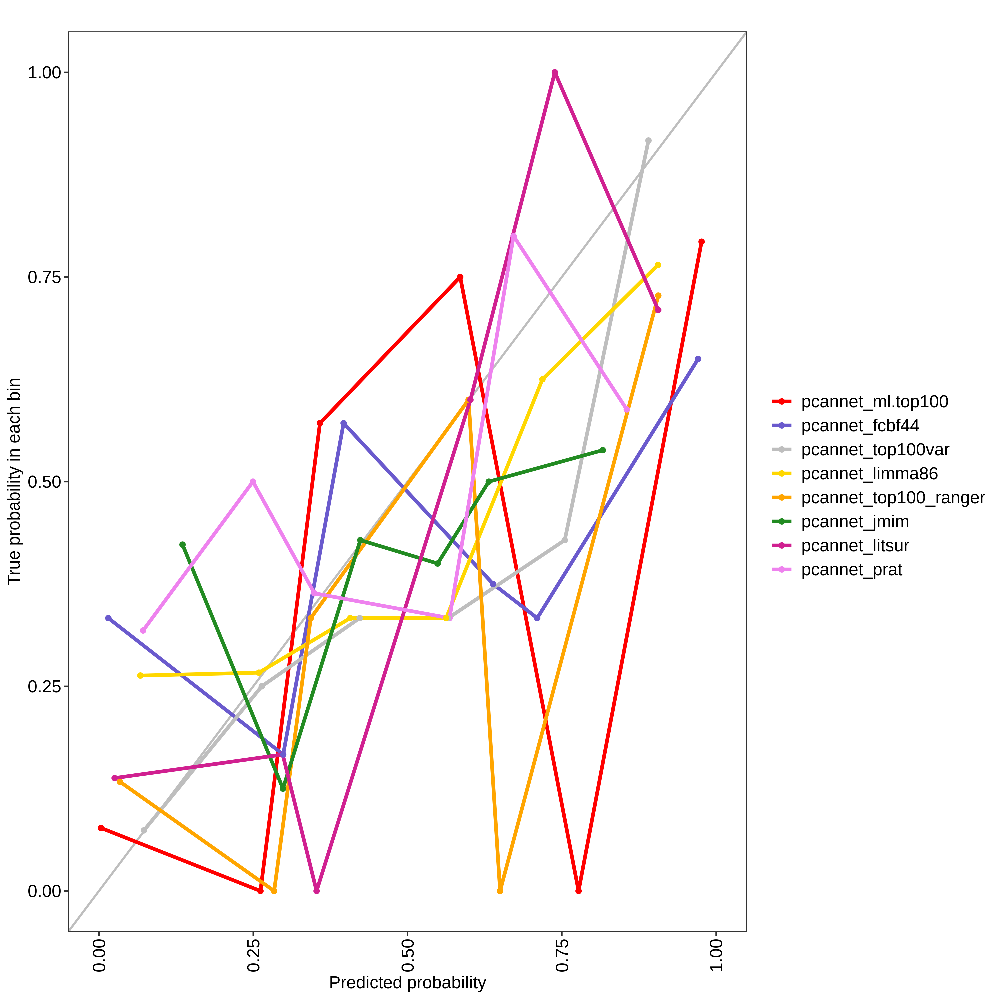

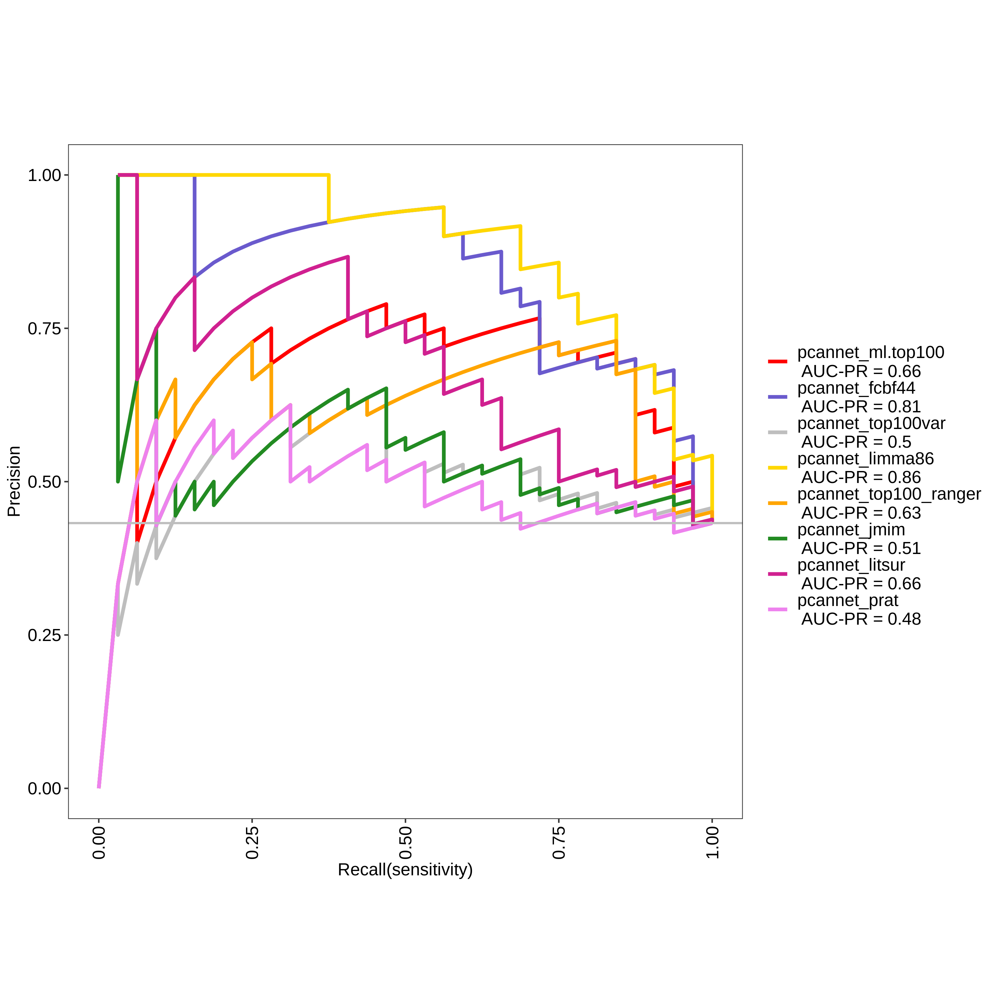

pcannet_ml.top100 Optimal Informedness = 0.589285714285714

pcannet_fcbf44 Optimal Informedness = 0.604166666666667

pcannet_top100var Optimal Informedness = 0.254464285714286

pcannet_limma86 Optimal Informedness = 0.654761904761905

pcannet_top100_ranger Optimal Informedness = 0.605654761904762

pcannet_jmim Optimal Informedness = 0.27827380952381

pcannet_litsur Optimal Informedness = 0.395833333333333

pcannet_prat Optimal Informedness = 0.175595238095238

pcannet_ml.top100 AUC-ROC = 0.8

pcannet_fcbf44 AUC-ROC = 0.87

pcannet_top100var AUC-ROC = 0.61

pcannet_limma86 AUC-ROC = 0.9

pcannet_top100_ranger AUC-ROC = 0.76

pcannet_jmim AUC-ROC = 0.62

pcannet_litsur AUC-ROC = 0.73

pcannet_prat AUC-ROC = 0.57



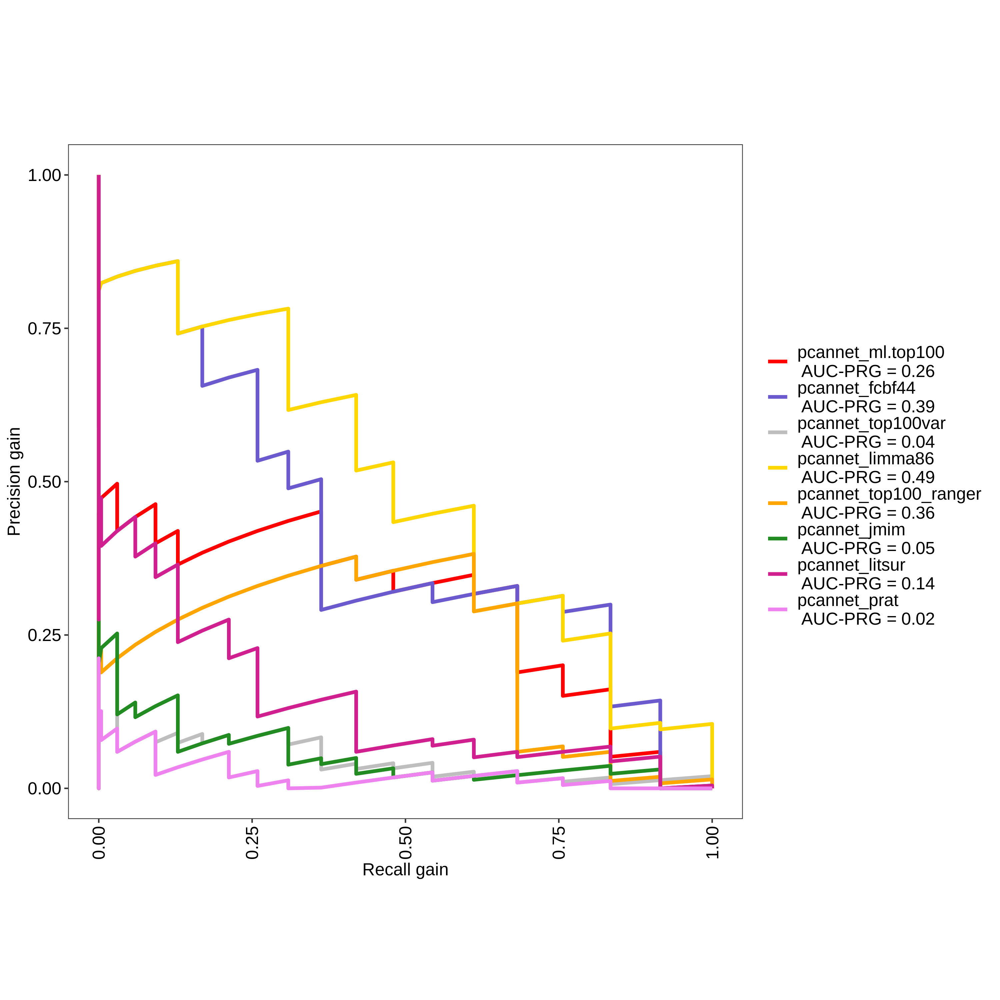

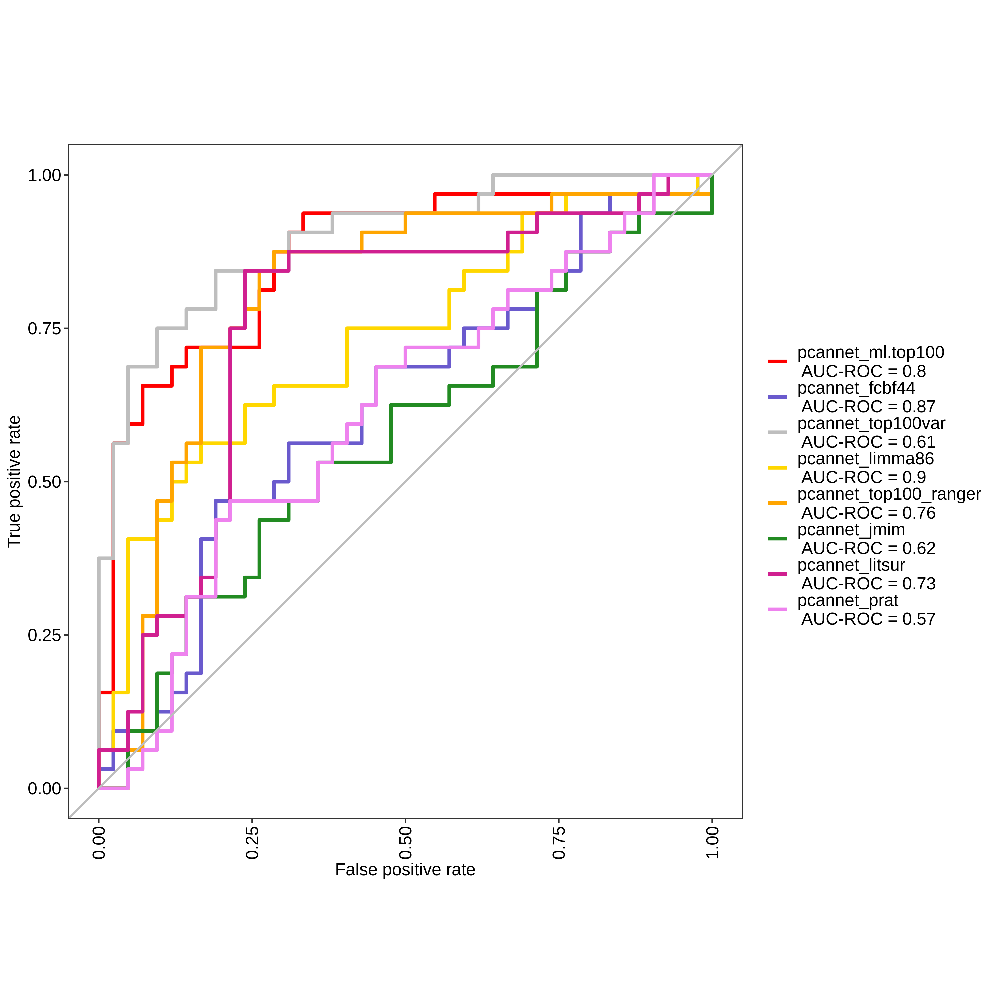

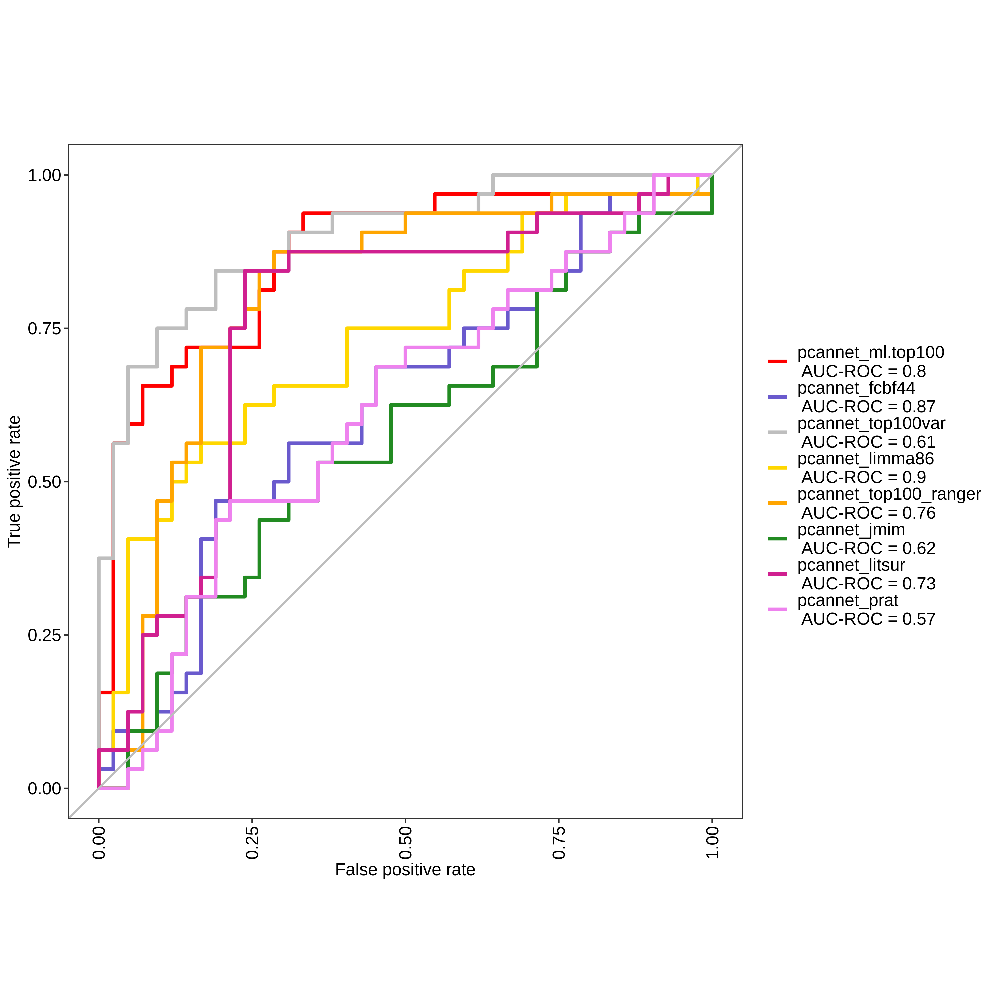

In [53]:
inp_top100_nnet <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.100 >= 4, "Gene_ID"])],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf44_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf44.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100var_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top100var.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma86_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma86.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100_ranger_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp100))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_jmim_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))


res_nnet <- evalm(list(inp_top100_nnet, inp_fcbf44_nnet, inp_top100var_nnet, inp_limma86_nnet, inp_top100_ranger_nnet, inp_jmim_nnet, inp_litsur_nnet, inp_prat_nnet),
             gnames=c('pcannet_ml.top100', 'pcannet_fcbf44', 'pcannet_top100var', 'pcannet_limma86', 'pcannet_top100_ranger', 'pcannet_jmim', 'pcannet_litsur', 'pcannet_prat'))
res_nnet$roc

## Gradient Boosting Machines (GBM)

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3184            -nan     0.1000    0.0007
     2        1.2559            -nan     0.1000    0.0126
     3        1.2104            -nan     0.1000    0.0044
     4        1.1820            -nan     0.1000   -0.0059
     5        1.1460            -nan     0.1000    0.0040
     6        1.1106            -nan     0.1000    0.0025
     7        1.0655            -nan     0.1000    0.0088
     8        1.0216            -nan     0.1000    0.0024
     9        0.9843            -nan     0.1000    0.0033
    10        0.9476            -nan     0.1000    0.0080
    20        0.6933            -nan     0.1000    0.0035
    40        0.3834            -nan     0.1000   -0.0017
    60        0.2190            -nan     0.1000    0.0002
    80        0.1394            -nan     0.1000   -0.0012
   100        0.0855            -nan     0.1000   -0.0002
   120        0.0546            -nan     0.1000   -0.0012
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3404            -nan     0.1000    0.0013
     2        1.3133            -nan     0.1000   -0.0130
     3        1.2730            -nan     0.1000   -0.0000
     4        1.2278            -nan     0.1000    0.0044
     5        1.1845            -nan     0.1000    0.0058
     6        1.1491            -nan     0.1000    0.0058
     7        1.1198            -nan     0.1000    0.0042
     8        1.0873            -nan     0.1000    0.0026
     9        1.0590            -nan     0.1000   -0.0023
    10        1.0360            -nan     0.1000    0.0012
    20        0.8090            -nan     0.1000   -0.0014
    40        0.5292            -nan     0.1000    0.0004
    60        0.3575            -nan     0.1000   -0.0001
    80        0.2550            -nan     0.1000   -0.0005
   100        0.1830            -nan     0.1000    0.0001
   120        0.1331            -nan     0.1000   -0.0001
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3413            -nan     0.1000   -0.0093
     2        1.2936            -nan     0.1000    0.0094
     3        1.2551            -nan     0.1000    0.0096
     4        1.2441            -nan     0.1000   -0.0165
     5        1.2223            -nan     0.1000   -0.0070
     6        1.1974            -nan     0.1000   -0.0060
     7        1.1643            -nan     0.1000    0.0109
     8        1.1369            -nan     0.1000    0.0031
     9        1.1240            -nan     0.1000   -0.0101
    10        1.1118            -nan     0.1000   -0.0104
    20        0.9238            -nan     0.1000   -0.0031
    40        0.6611            -nan     0.1000   -0.0053
    60        0.5023            -nan     0.1000    0.0014
    80        0.3913            -nan     0.1000   -0.0051
   100        0.3054            -nan     0.1000   -0.0008
   120        0.2422            -nan     0.1000   -0.0022
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.2980            -nan     0.1000    0.0310
     2        1.2496            -nan     0.1000    0.0188
     3        1.1907            -nan     0.1000    0.0217
     4        1.1361            -nan     0.1000    0.0184
     5        1.0957            -nan     0.1000    0.0144
     6        1.0681            -nan     0.1000   -0.0056
     7        1.0368            -nan     0.1000   -0.0057
     8        1.0057            -nan     0.1000    0.0031
     9        0.9672            -nan     0.1000   -0.0056
    10        0.9255            -nan     0.1000    0.0110
    20        0.6859            -nan     0.1000    0.0021
    40        0.4158            -nan     0.1000    0.0007
    60        0.2649            -nan     0.1000   -0.0050
    80        0.1706            -nan     0.1000    0.0011
   100        0.1243            -nan     0.1000   -0.0023
   120        0.0815            -nan     0.1000   -0.0004
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3064            -nan     0.1000    0.0215
     2        1.2513            -nan     0.1000    0.0146
     3        1.2022            -nan     0.1000   -0.0004
     4        1.1644            -nan     0.1000   -0.0044
     5        1.1264            -nan     0.1000    0.0092
     6        1.0850            -nan     0.1000    0.0045
     7        1.0445            -nan     0.1000    0.0083
     8        1.0071            -nan     0.1000    0.0085
     9        0.9787            -nan     0.1000    0.0006
    10        0.9538            -nan     0.1000   -0.0082
    20        0.6996            -nan     0.1000    0.0063
    40        0.4142            -nan     0.1000    0.0003
    60        0.2475            -nan     0.1000    0.0025
    80        0.1626            -nan     0.1000    0.0006
   100        0.1072            -nan     0.1000   -0.0015
   120        0.0691            -nan     0.1000   -0.0009
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3295            -nan     0.1000    0.0053
     2        1.3127            -nan     0.1000   -0.0165
     3        1.2727            -nan     0.1000    0.0121
     4        1.2618            -nan     0.1000   -0.0125
     5        1.1945            -nan     0.1000    0.0150
     6        1.1470            -nan     0.1000    0.0113
     7        1.1299            -nan     0.1000   -0.0089
     8        1.0999            -nan     0.1000   -0.0041
     9        1.0691            -nan     0.1000    0.0068
    10        1.0542            -nan     0.1000   -0.0065
    20        0.8446            -nan     0.1000    0.0030
    40        0.5766            -nan     0.1000   -0.0013
    60        0.4056            -nan     0.1000   -0.0025
    80        0.2918            -nan     0.1000   -0.0016
   100        0.2067            -nan     0.1000    0.0006
   120        0.1518            -nan     0.1000   -0.0012
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3285            -nan     0.1000    0.0050
     2        1.2952            -nan     0.1000    0.0075
     3        1.2735            -nan     0.1000   -0.0066
     4        1.2467            -nan     0.1000    0.0057
     5        1.2134            -nan     0.1000    0.0035
     6        1.1930            -nan     0.1000    0.0008
     7        1.1628            -nan     0.1000    0.0011
     8        1.1317            -nan     0.1000    0.0098
     9        1.1119            -nan     0.1000    0.0036
    10        1.0781            -nan     0.1000    0.0089
    20        0.8716            -nan     0.1000   -0.0006
    40        0.6883            -nan     0.1000   -0.0034
    60        0.5438            -nan     0.1000   -0.0028
    80        0.4353            -nan     0.1000    0.0003
   100        0.3562            -nan     0.1000   -0.0016
   120        0.3055            -nan     0.1000   -0.0031
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3402            -nan     0.1000   -0.0135
     2        1.2921            -nan     0.1000    0.0092
     3        1.2586            -nan     0.1000    0.0012
     4        1.2518            -nan     0.1000   -0.0326
     5        1.2084            -nan     0.1000    0.0087
     6        1.1781            -nan     0.1000   -0.0029
     7        1.1472            -nan     0.1000   -0.0032
     8        1.1158            -nan     0.1000    0.0014
     9        1.0932            -nan     0.1000   -0.0107
    10        1.0673            -nan     0.1000    0.0018
    20        0.8825            -nan     0.1000    0.0019
    40        0.6058            -nan     0.1000   -0.0094
    60        0.4309            -nan     0.1000    0.0007
    80        0.3180            -nan     0.1000   -0.0038
   100        0.2377            -nan     0.1000   -0.0041
   120        0.1705            -nan     0.1000   -0.0021
   140        

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 592

Number of groups: 8

Observations per group: 74

Positive: Y

Negative: N

Group: gbm_ml.top100

Positive: 32

Negative: 42

Group: gbm_fcbf44

Positive: 32

Negative: 42

Group: gbm_top100var

Positive: 32

Negative: 42

Group: gbm_limma86

Positive: 32

Negative: 42

Group: gbm_top100_ranger

Positive: 32

Negative: 42

Group: gbm_jmim

Positive: 32

Negative: 42

Group: gbm_litsur

Positive: 32

Negative: 42

Group: gbm_prat

Positive: 32

Negative: 42

***Performance Metrics***



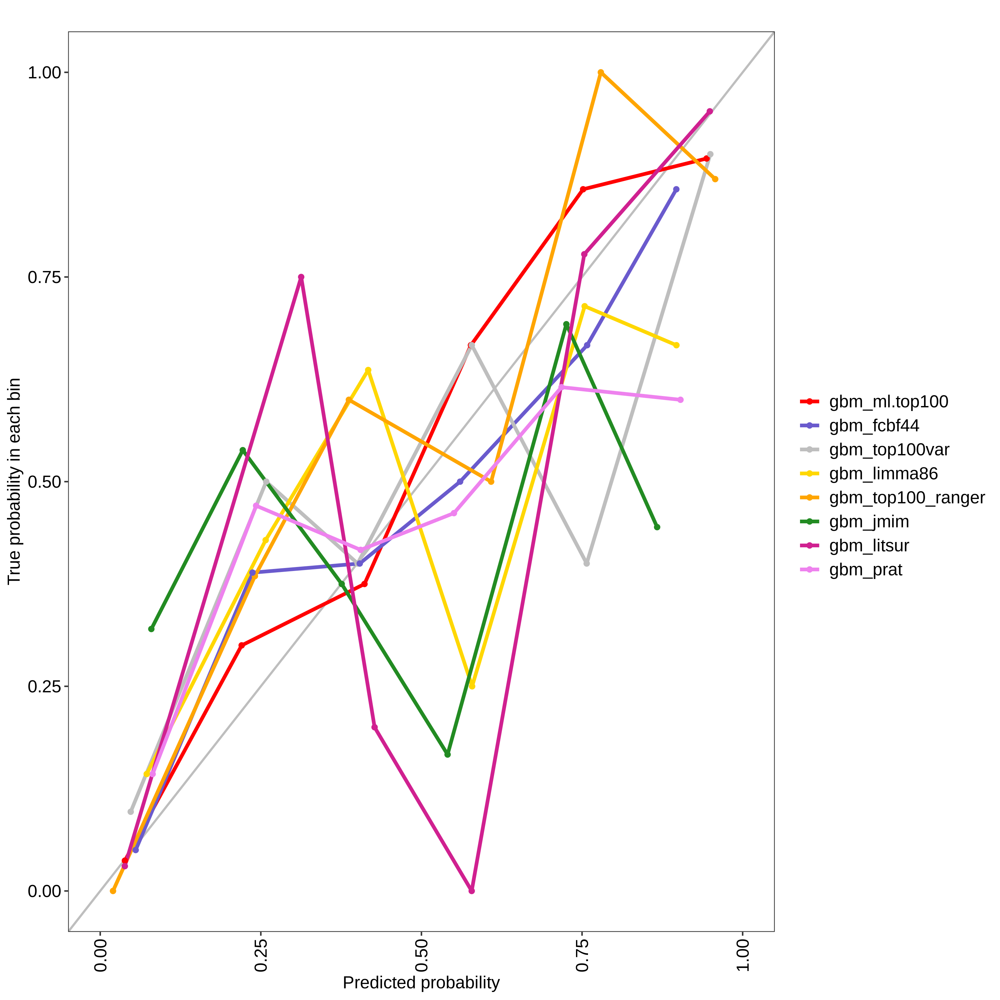

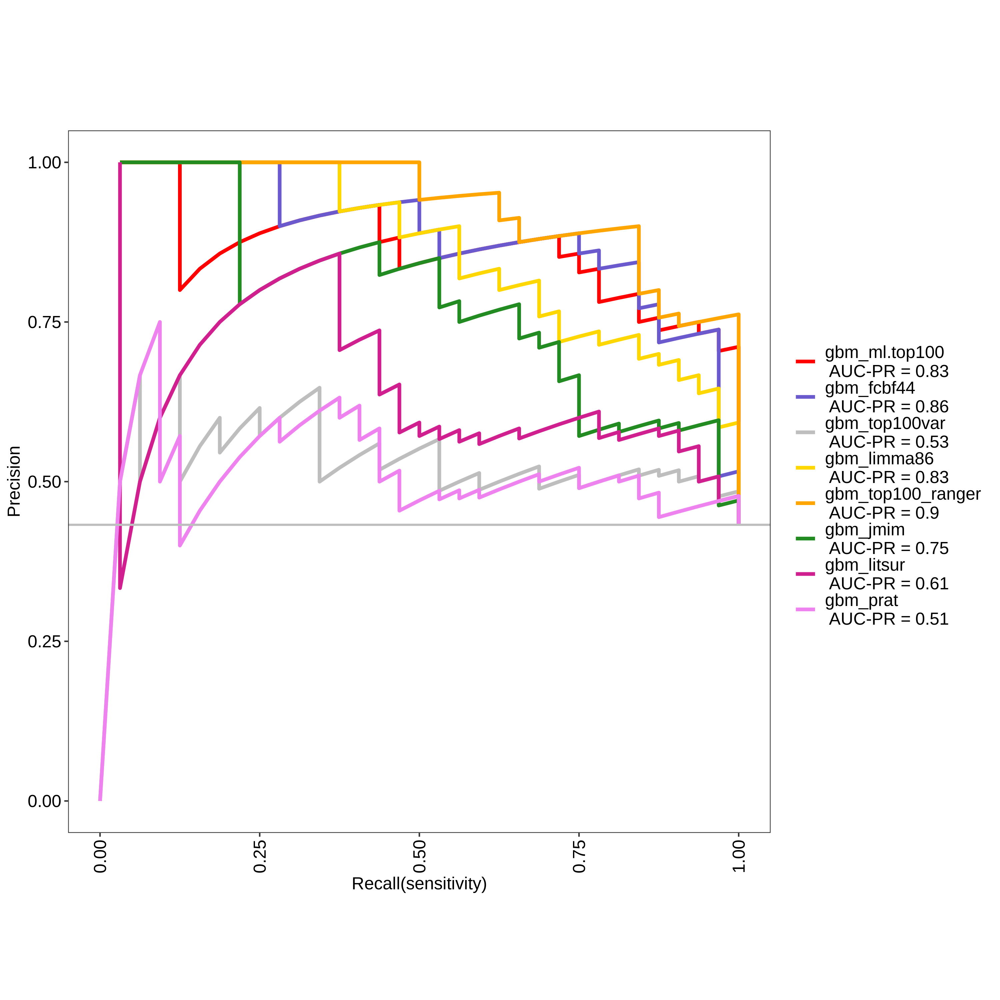

gbm_ml.top100 Optimal Informedness = 0.706845238095238

gbm_fcbf44 Optimal Informedness = 0.724702380952381

gbm_top100var Optimal Informedness = 0.263392857142857

gbm_limma86 Optimal Informedness = 0.605654761904762

gbm_top100_ranger Optimal Informedness = 0.772321428571429

gbm_jmim Optimal Informedness = 0.513392857142857

gbm_litsur Optimal Informedness = 0.40625

gbm_prat Optimal Informedness = 0.226190476190476

gbm_ml.top100 AUC-ROC = 0.92

gbm_fcbf44 AUC-ROC = 0.91

gbm_top100var AUC-ROC = 0.65

gbm_limma86 AUC-ROC = 0.89

gbm_top100_ranger AUC-ROC = 0.95

gbm_jmim AUC-ROC = 0.82

gbm_litsur AUC-ROC = 0.74

gbm_prat AUC-ROC = 0.62



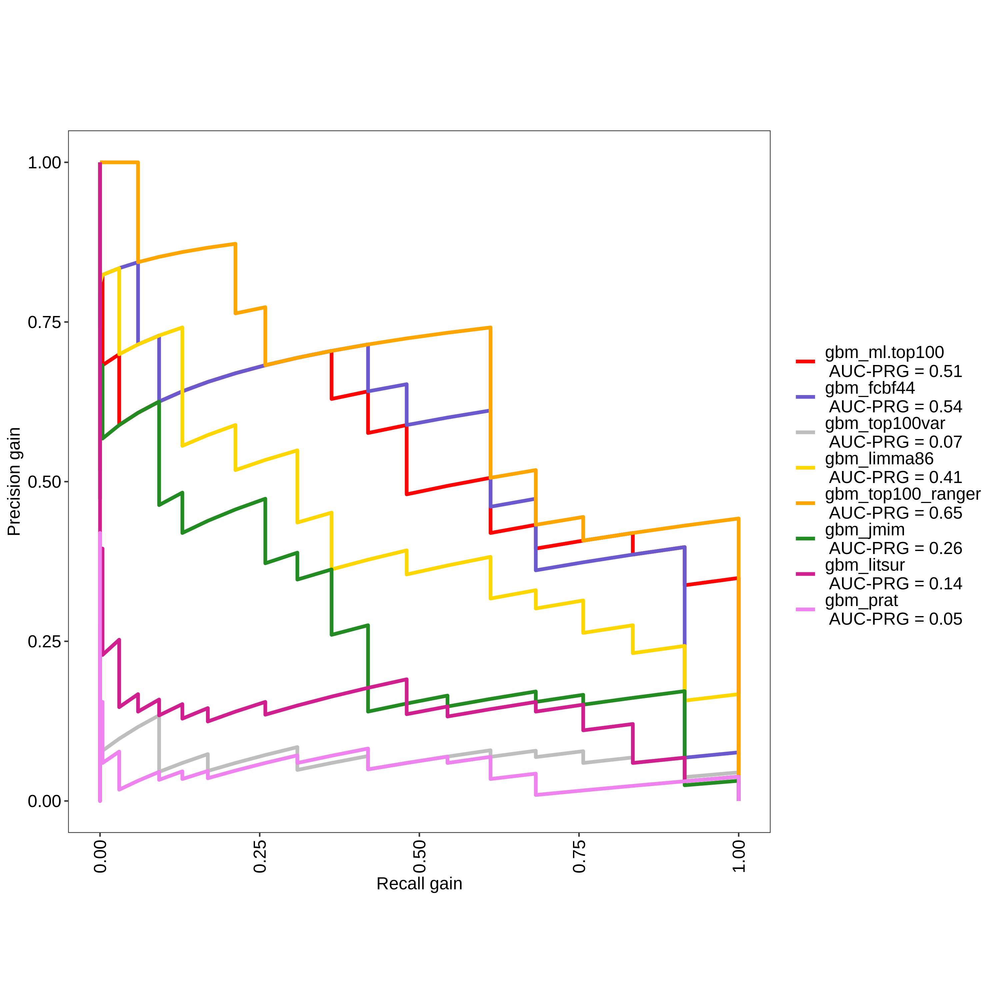

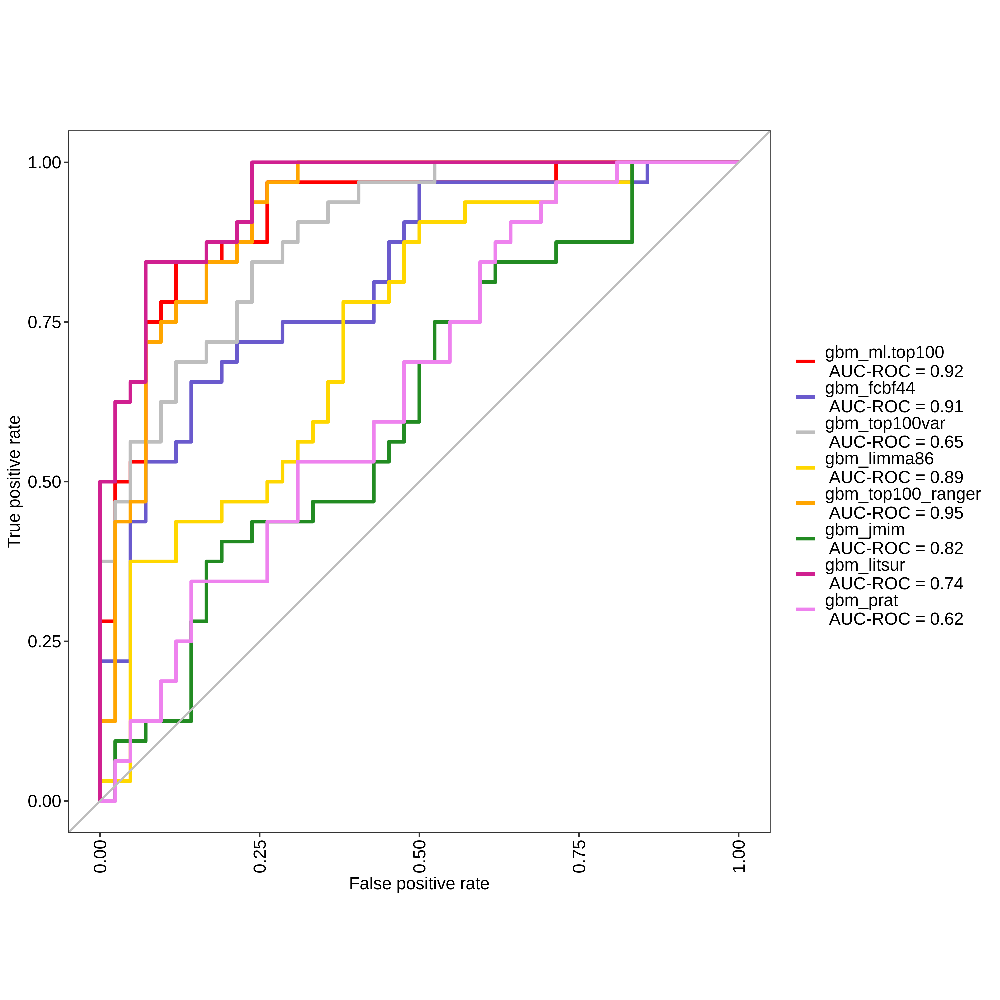

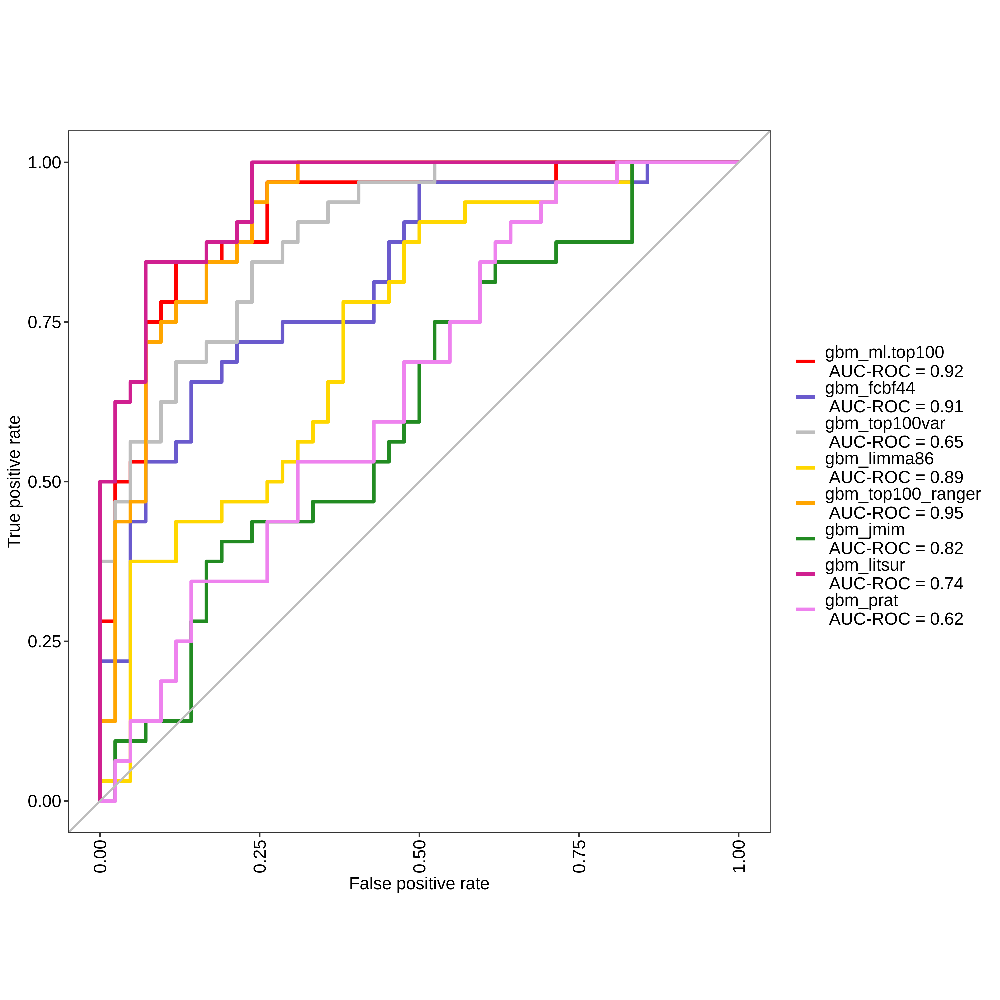

In [55]:
inp_top100_gbm <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.100 >= 4, "Gene_ID"])],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf44_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf44.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100var_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top100var.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma86_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma86.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100_ranger_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp100))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_gbm <- evalm(list(inp_top100_gbm, inp_fcbf44_gbm, inp_top100var_gbm, inp_limma86_gbm, inp_top100_ranger_gbm, inp_jmim_gbm, inp_litsur_gbm, inp_prat_gbm),
             gnames=c('gbm_ml.top100', 'gbm_fcbf44', 'gbm_top100var', 'gbm_limma86', 'gbm_top100_ranger', 'gbm_jmim', 'gbm_litsur', 'gbm_prat'))
res_gbm$roc

## Partial Least Squares

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 592

Number of groups: 8

Observations per group: 74

Positive: Y

Negative: N

Group: pls_ml.top100

Positive: 32

Negative: 42

Group: pls_fcbf44

Positive: 32

Negative: 42

Group: pls_top100var

Positive: 32

Negative: 42

Group: pls_limma86

Positive: 32

Negative: 42

Group: pls_top100_ranger

Positive: 32

Negative: 42

Group: pls_jmim

Positive: 32

Negative: 42

Group: pls_litsur

Positive: 32

Negative: 42

Group: pls_prat

Positive: 32

Negative: 42

***Performance Metrics***



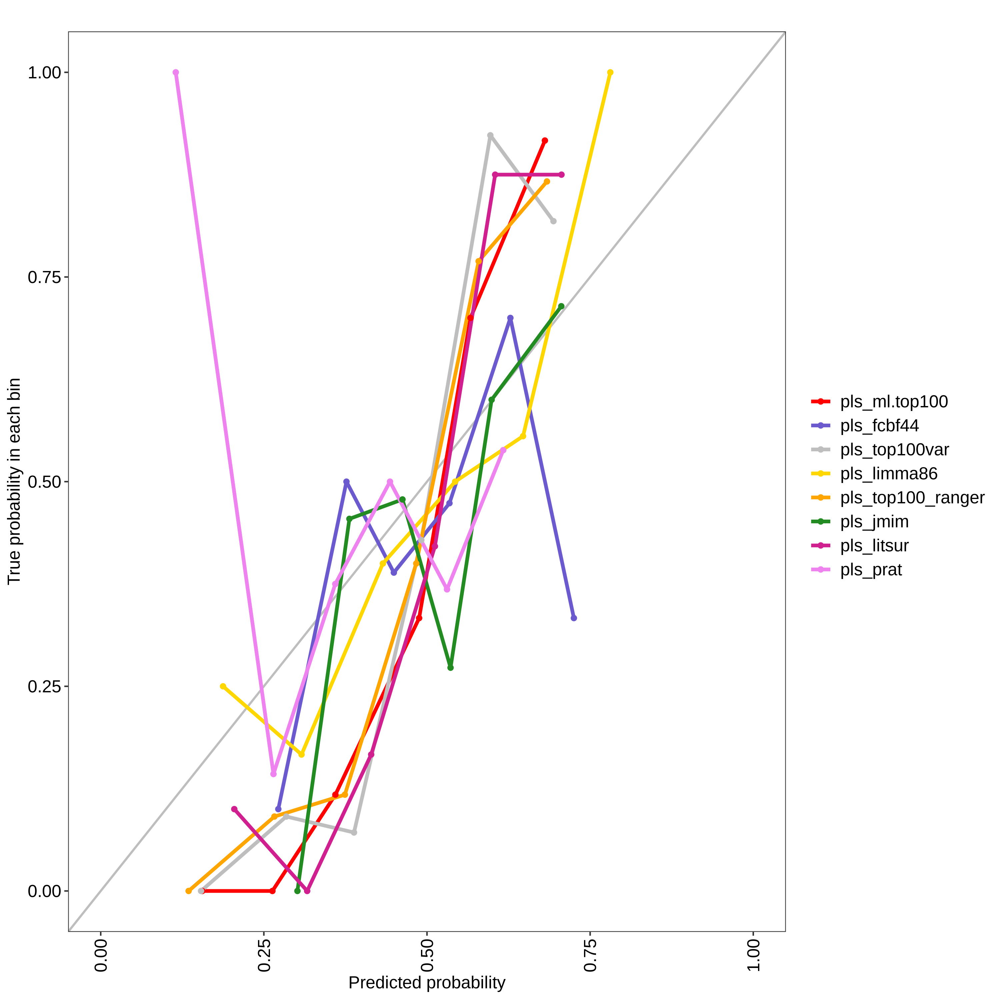

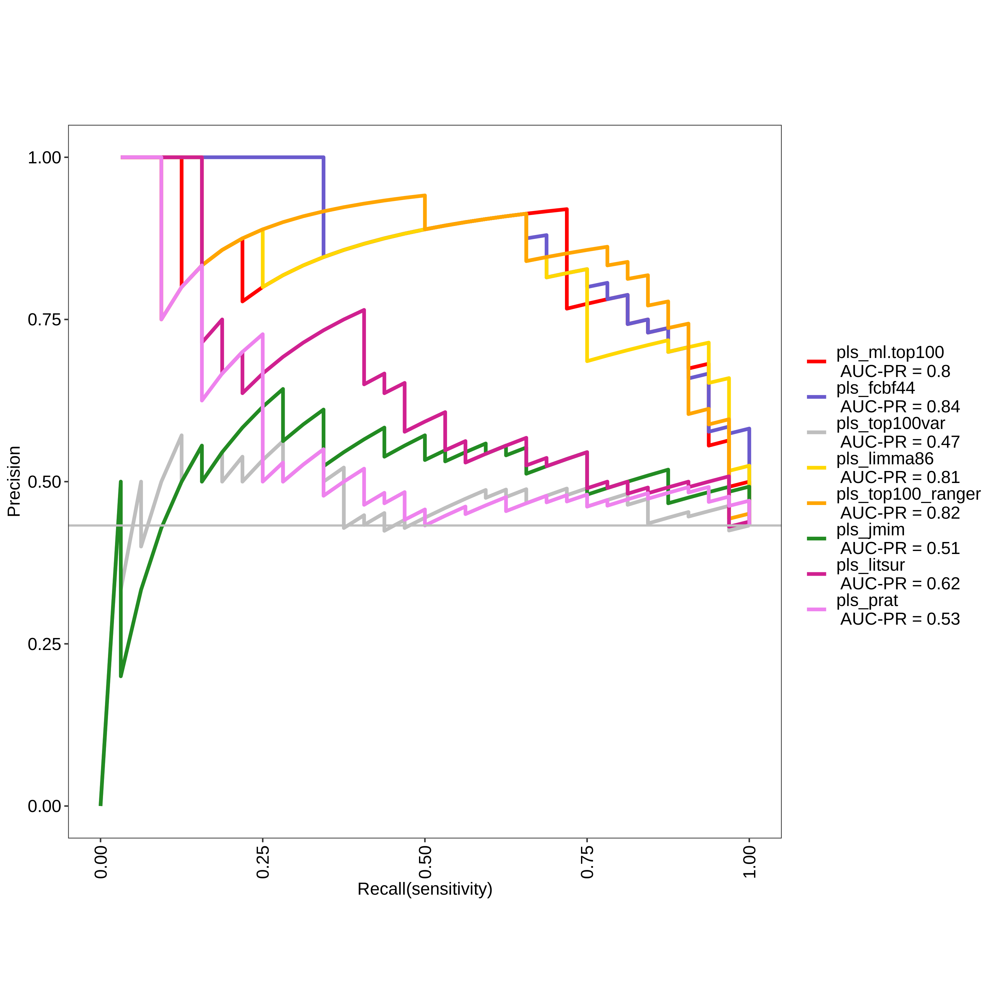

pls_ml.top100 Optimal Informedness = 0.671130952380952

pls_fcbf44 Optimal Informedness = 0.645833333333333

pls_top100var Optimal Informedness = 0.154761904761905

pls_limma86 Optimal Informedness = 0.651785714285714

pls_top100_ranger Optimal Informedness = 0.700892857142857

pls_jmim Optimal Informedness = 0.273809523809524

pls_litsur Optimal Informedness = 0.311011904761905

pls_prat Optimal Informedness = 0.199404761904762

pls_ml.top100 AUC-ROC = 0.88

pls_fcbf44 AUC-ROC = 0.9

pls_top100var AUC-ROC = 0.56

pls_limma86 AUC-ROC = 0.88

pls_top100_ranger AUC-ROC = 0.89

pls_jmim AUC-ROC = 0.65

pls_litsur AUC-ROC = 0.68

pls_prat AUC-ROC = 0.6



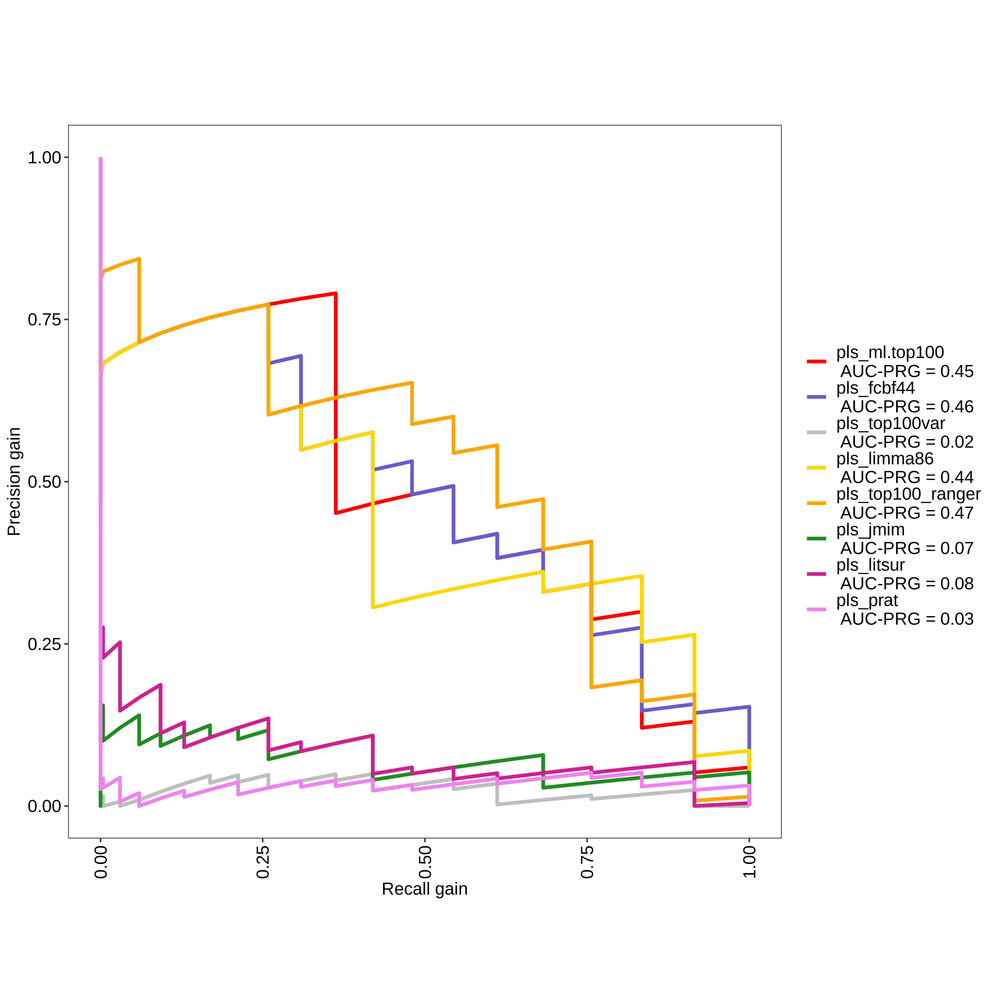

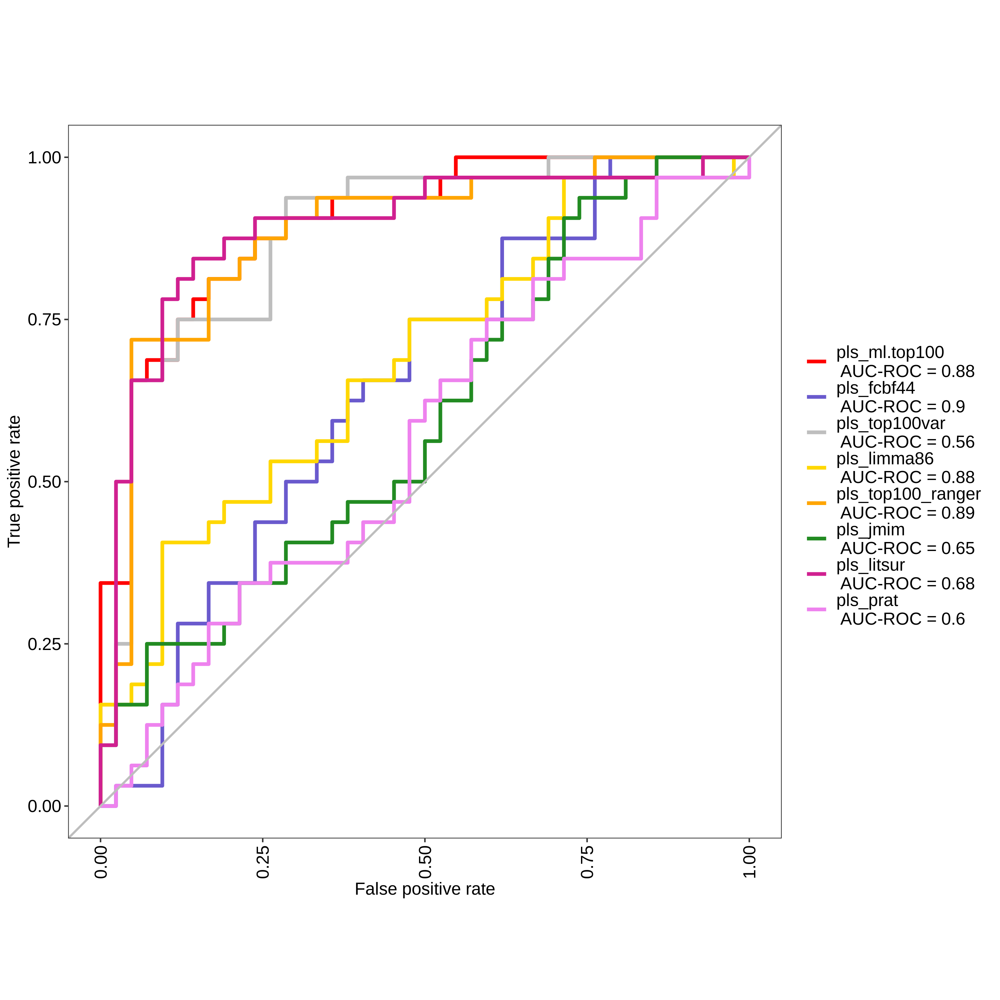

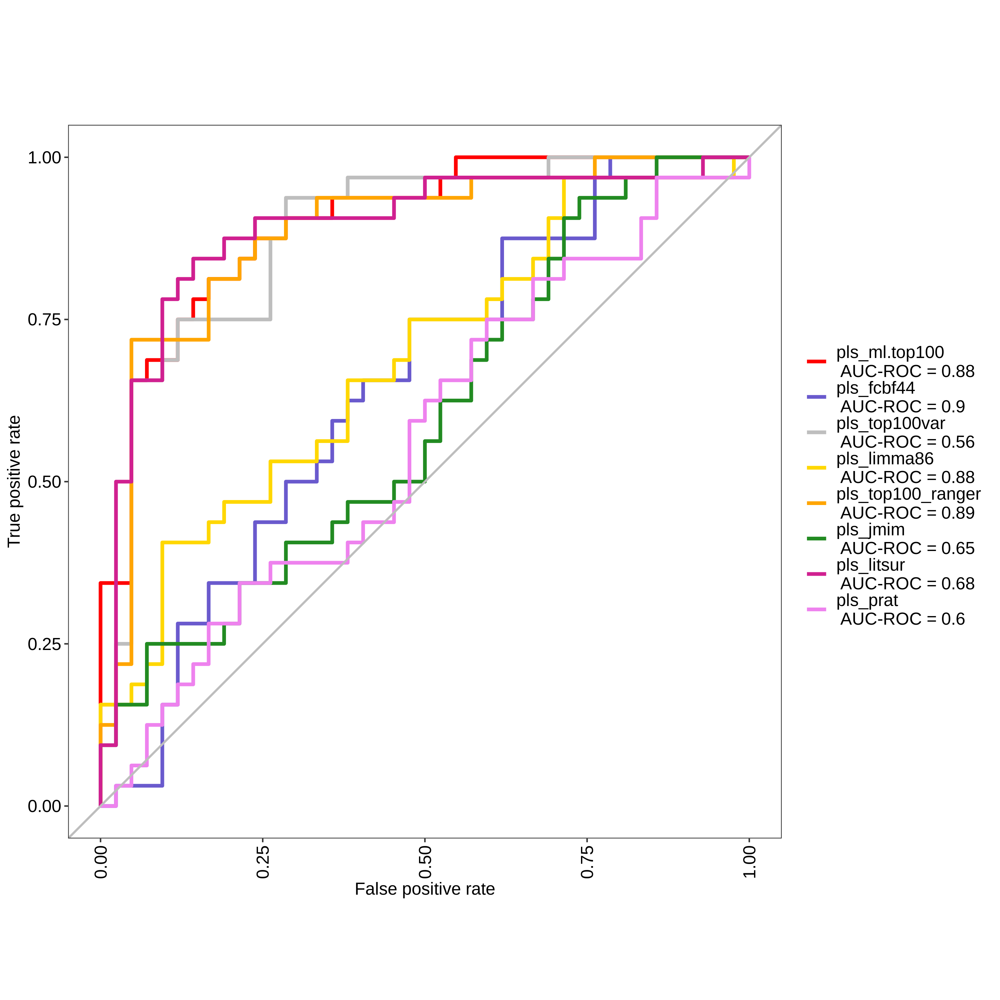

In [57]:
inp_top100_pls <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.100 >= 4, "Gene_ID"])],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf44_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf44.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100var_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top100var.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma86_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma86.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100_ranger_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp100))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_litsur_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_pls <- evalm(list(inp_top100_pls, inp_fcbf44_pls, inp_top100var_pls, inp_limma86_pls, inp_top100_ranger_pls, inp_jmim_pls, inp_litsur_pls, inp_prat_pls),
             gnames=c('pls_ml.top100', 'pls_fcbf44', 'pls_top100var', 'pls_limma86', 'pls_top100_ranger', 'pls_jmim', 'pls_litsur', 'pls_prat'))
res_pls$roc

## Cforest

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 592

Number of groups: 8

Observations per group: 74

Positive: Y

Negative: N

Group: crf_ml.top100

Positive: 32

Negative: 42

Group: crf_fcbf44

Positive: 32

Negative: 42

Group: crf_top100var

Positive: 32

Negative: 42

Group: crf_limma86

Positive: 32

Negative: 42

Group: crf_top100_ranger

Positive: 32

Negative: 42

Group: crf_jmim

Positive: 32

Negative: 42

Group: crf_litsur

Positive: 32

Negative: 42

Group: crf_prat

Positive: 32

Negative: 42

***Performance Metrics***



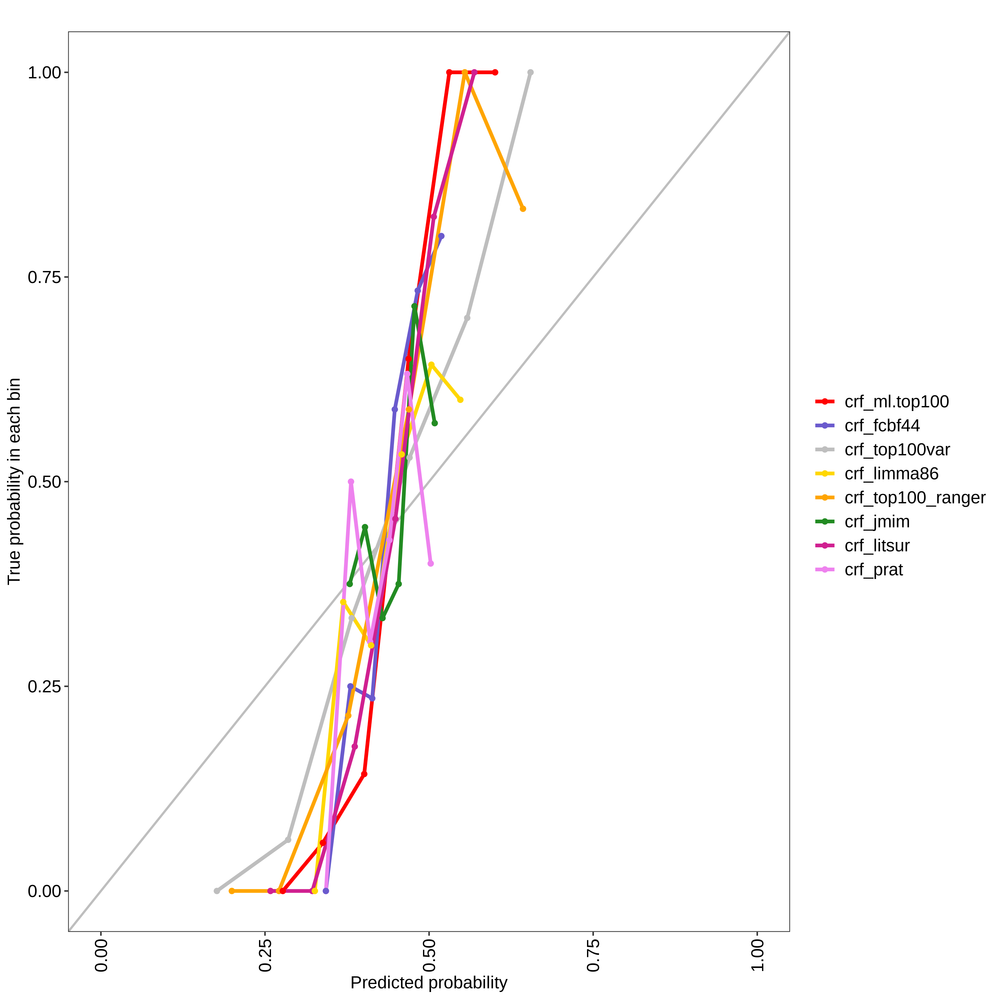

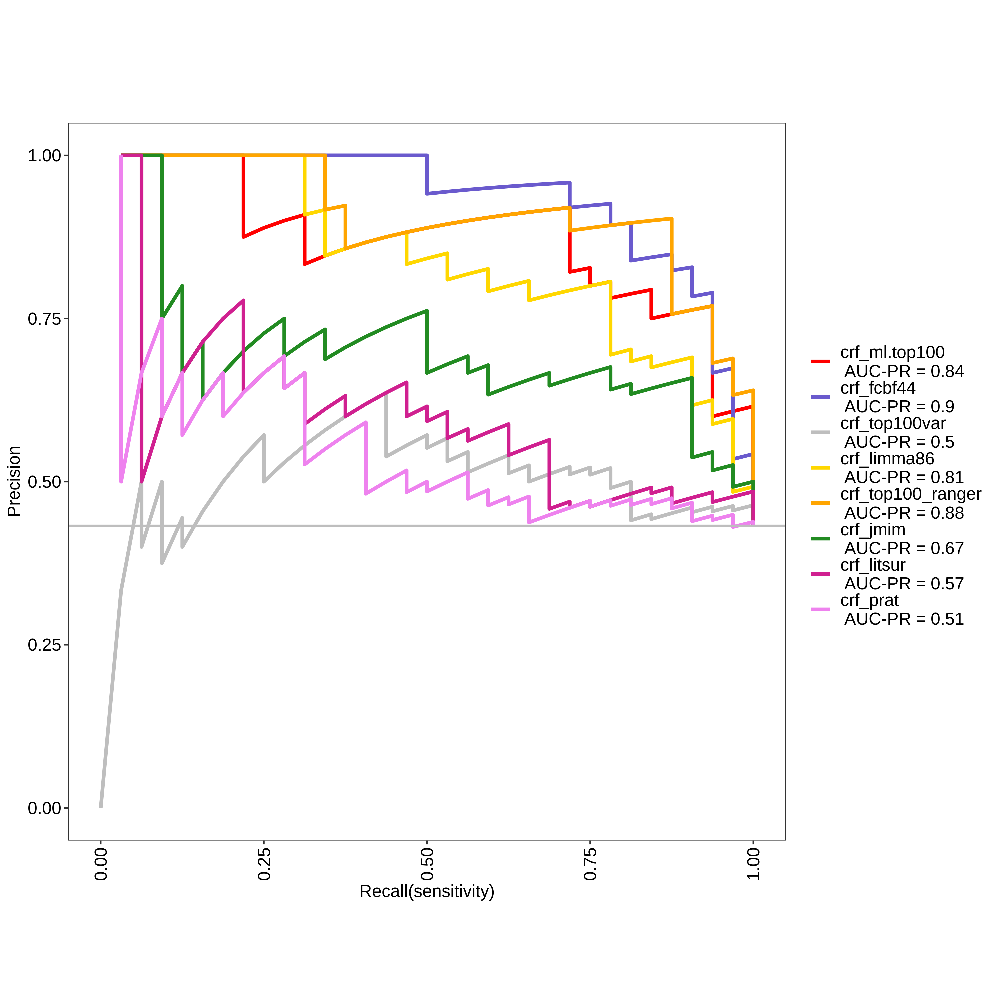

crf_ml.top100 Optimal Informedness = 0.723214285714286

crf_fcbf44 Optimal Informedness = 0.763392857142857

crf_top100var Optimal Informedness = 0.24702380952381

crf_limma86 Optimal Informedness = 0.638392857142857

crf_top100_ranger Optimal Informedness = 0.803571428571429

crf_jmim Optimal Informedness = 0.549107142857143

crf_litsur Optimal Informedness = 0.291666666666667

crf_prat Optimal Informedness = 0.193452380952381

crf_ml.top100 AUC-ROC = 0.91

crf_fcbf44 AUC-ROC = 0.94

crf_top100var AUC-ROC = 0.62

crf_limma86 AUC-ROC = 0.87

crf_top100_ranger AUC-ROC = 0.93

crf_jmim AUC-ROC = 0.79

crf_litsur AUC-ROC = 0.66

crf_prat AUC-ROC = 0.59



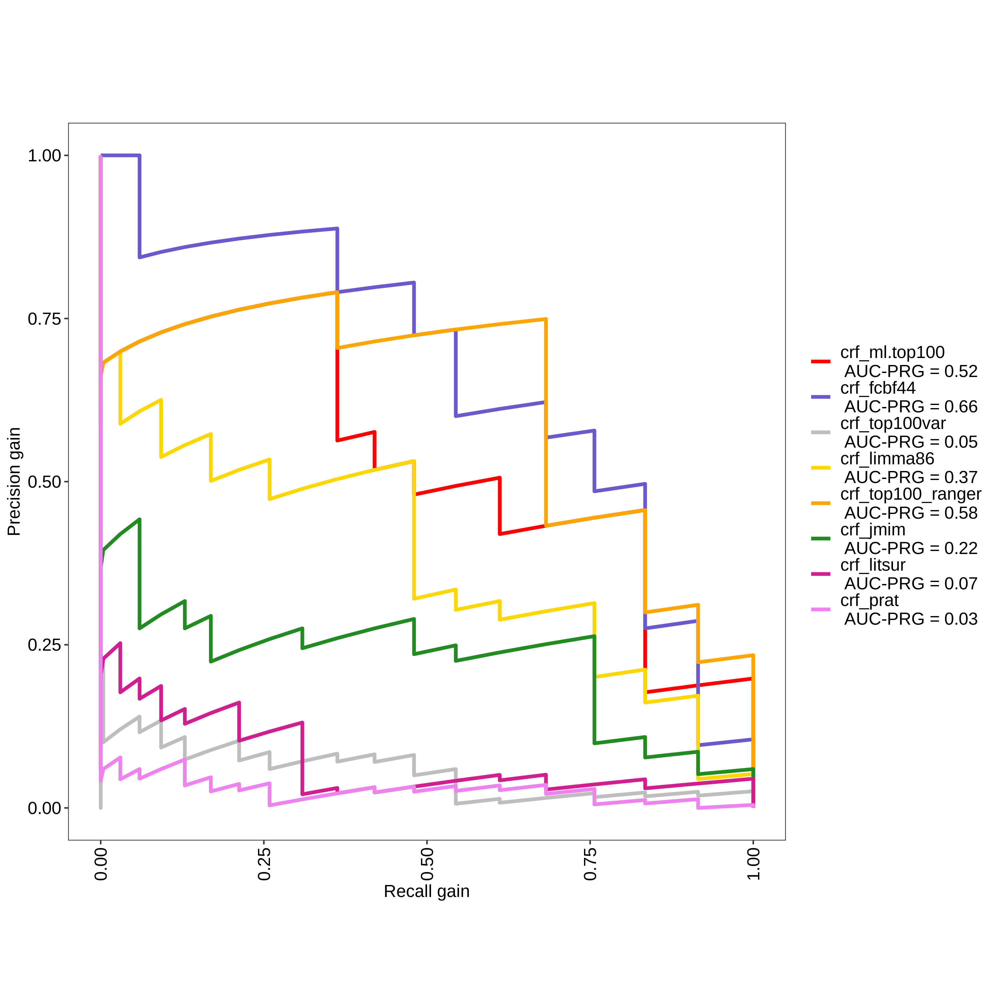

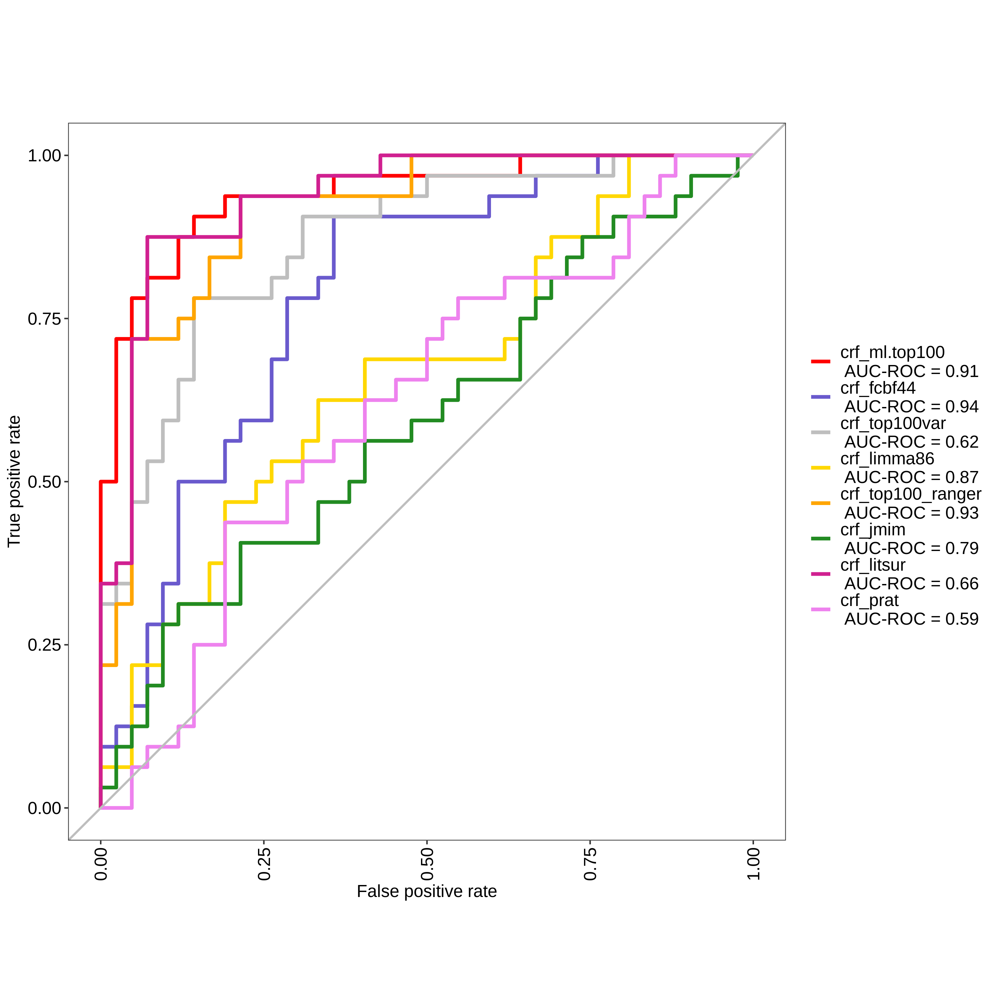

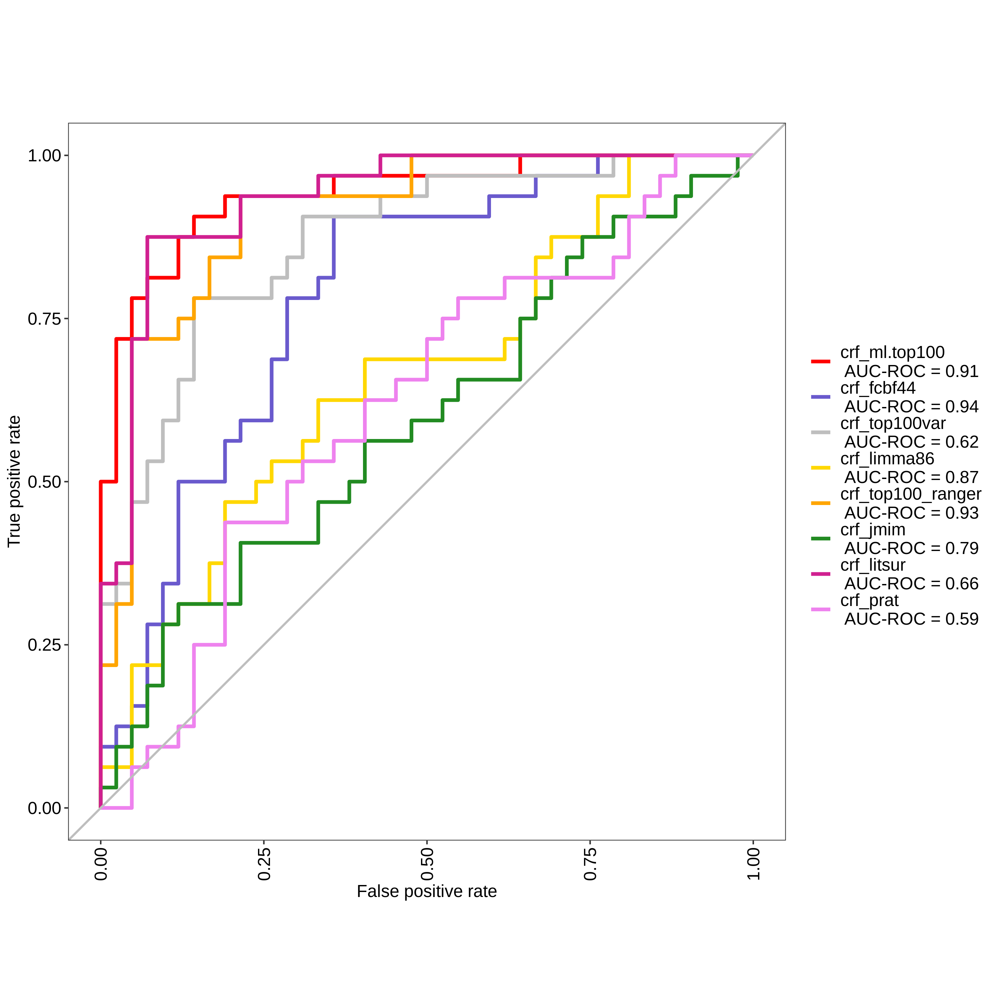

In [58]:
inp_top100_crf <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.100 >= 4, "Gene_ID"])],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf44_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf44.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100var_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top100var.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma86_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma86.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100_ranger_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp100))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_litsur_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_crf <- evalm(list(inp_top100_crf, inp_fcbf44_crf, inp_top100var_crf, inp_limma86_crf, inp_top100_ranger_crf, inp_jmim_crf, inp_litsur_crf, inp_prat_crf),
             gnames=c('crf_ml.top100', 'crf_fcbf44', 'crf_top100var', 'crf_limma86', 'crf_top100_ranger', 'crf_jmim', 'crf_litsur', 'crf_prat'))
res_crf$roc

## High Dimensional Discriminant Analysis

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 592

Number of groups: 8

Observations per group: 74

Positive: Y

Negative: N

Group: hdda_ml.top100

Positive: 32

Negative: 42

Group: hdda_fcbf44

Positive: 32

Negative: 42

Group: hdda_litsurvey

Positive: 32

Negative: 42

Group: hdda_limma86

Positive: 32

Negative: 42

Group: hdda_top100_ranger

Positive: 32

Negative: 42

Group: hdda_jmim

Positive: 32

Negative: 42

Group: hdda_litsur

Positive: 32

Negative: 42

Group: hdda_prat

Positive: 32

Negative: 42

***Performance Metrics***



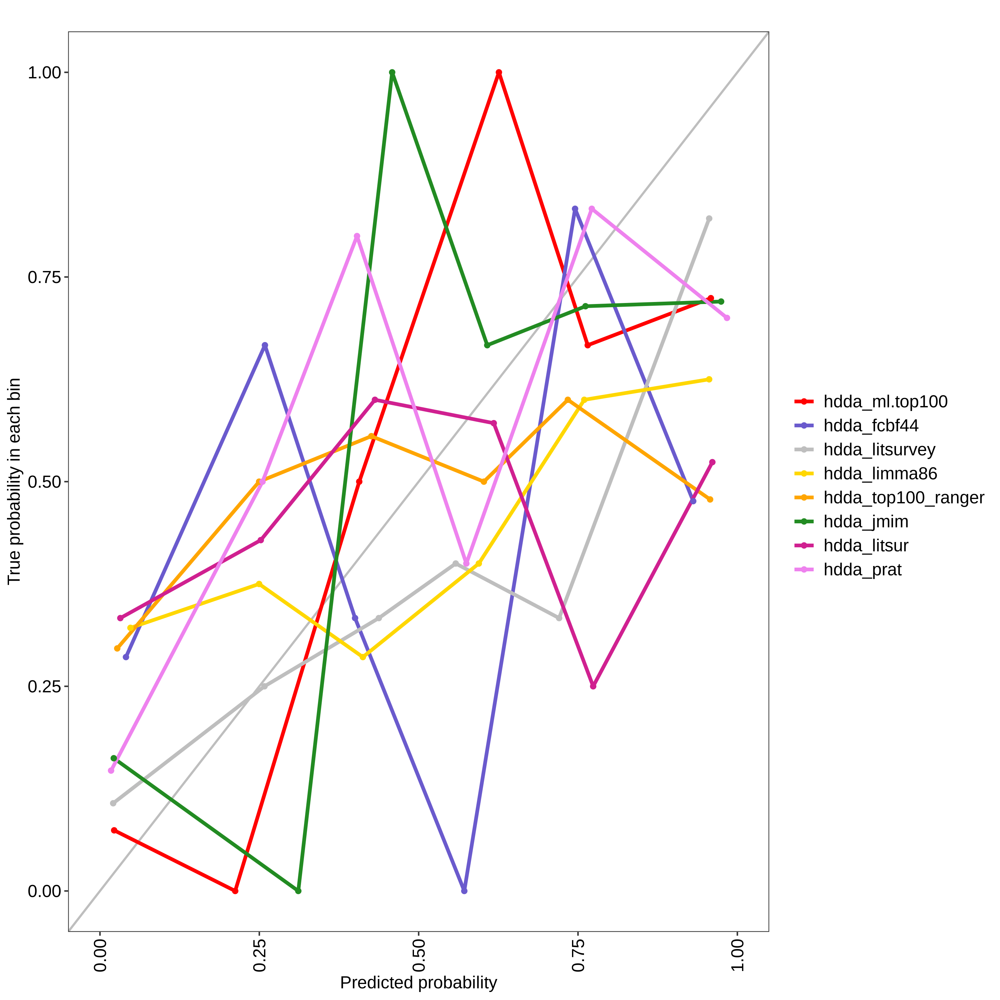

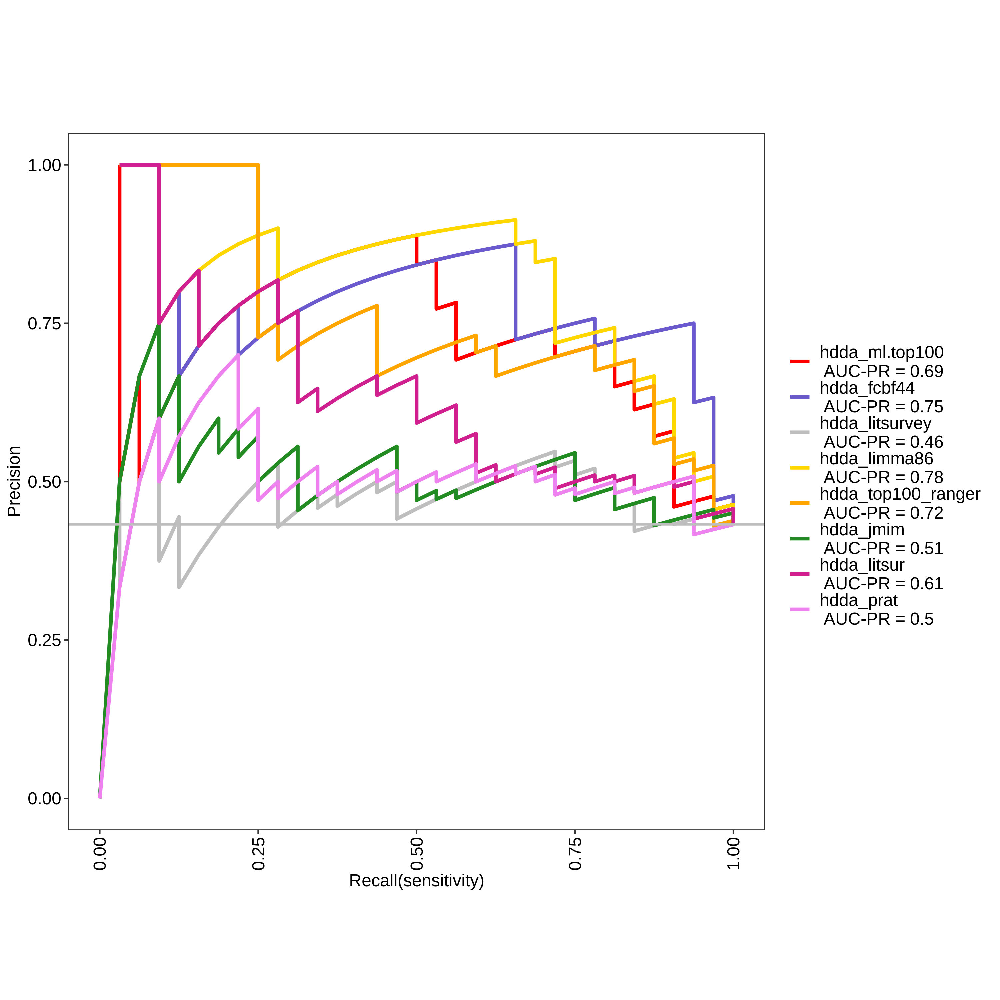

hdda_ml.top100 Optimal Informedness = 0.574404761904762

hdda_fcbf44 Optimal Informedness = 0.699404761904762

hdda_litsurvey Optimal Informedness = 0.266369047619048

hdda_limma86 Optimal Informedness = 0.623511904761905

hdda_top100_ranger Optimal Informedness = 0.558035714285714

hdda_jmim Optimal Informedness = 0.273809523809524

hdda_litsur Optimal Informedness = 0.30952380952381

hdda_prat Optimal Informedness = 0.24702380952381

hdda_ml.top100 AUC-ROC = 0.8

hdda_fcbf44 AUC-ROC = 0.86

hdda_litsurvey AUC-ROC = 0.57

hdda_limma86 AUC-ROC = 0.85

hdda_top100_ranger AUC-ROC = 0.8

hdda_jmim AUC-ROC = 0.6

hdda_litsur AUC-ROC = 0.68

hdda_prat AUC-ROC = 0.61



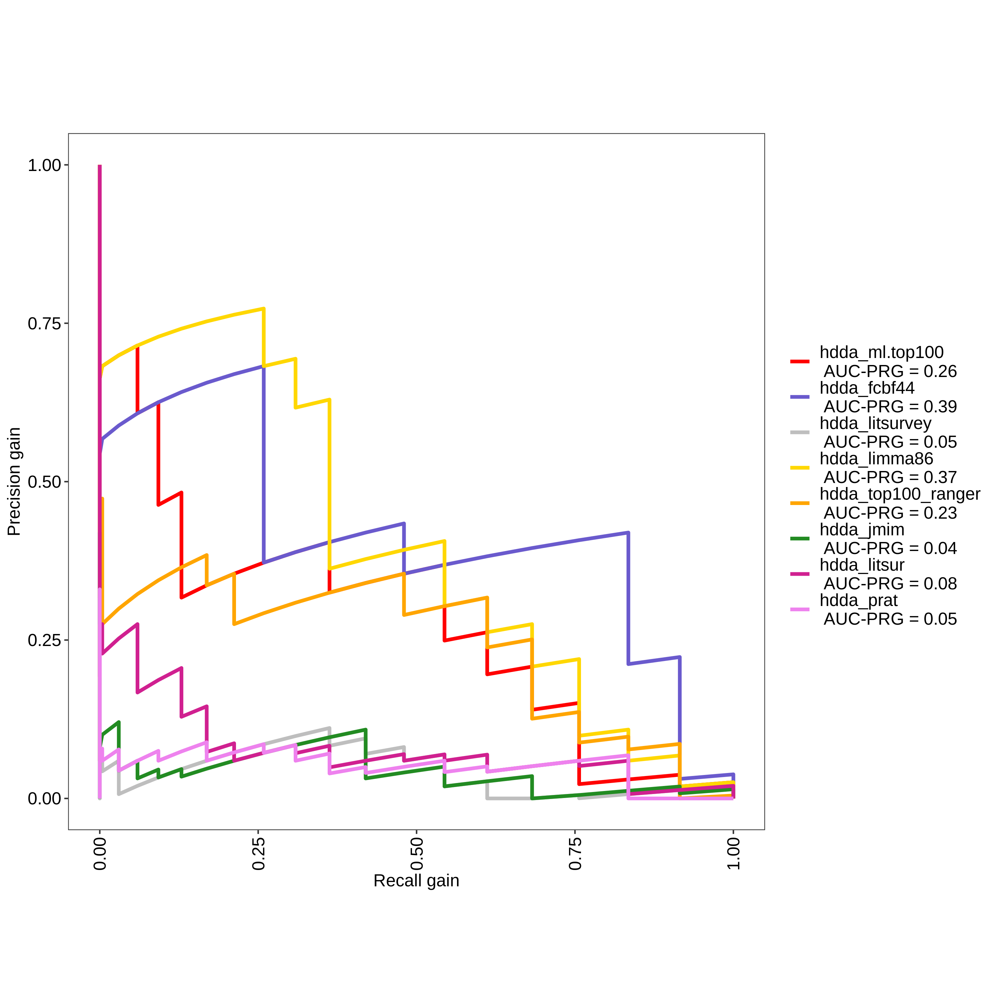

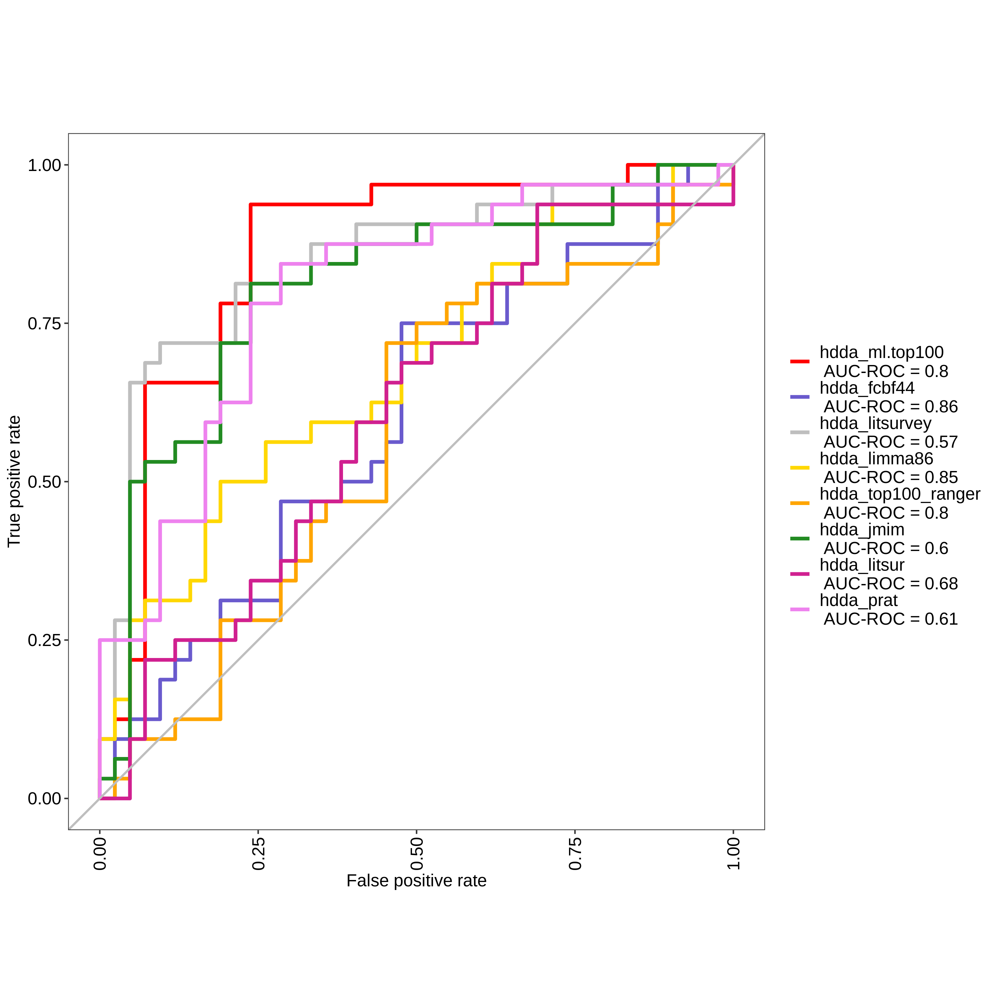

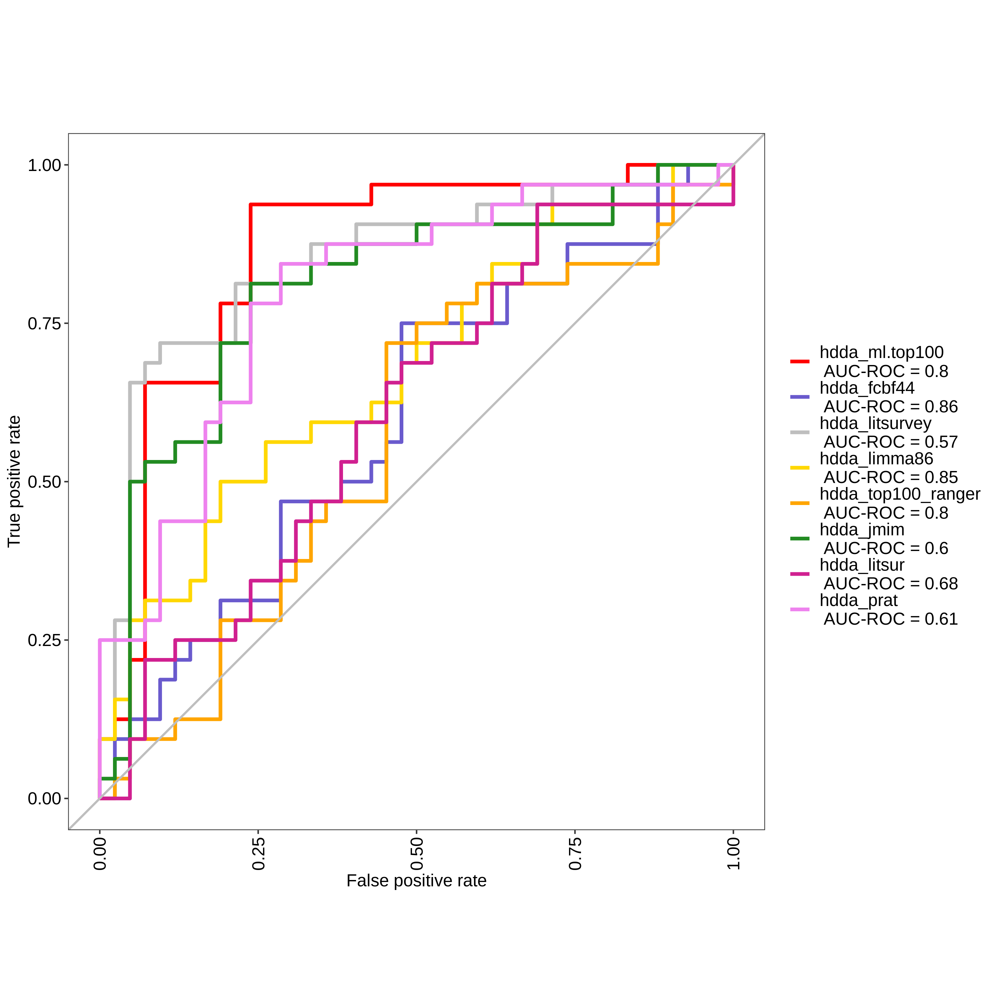

In [59]:
inp_top100_hdda <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.100 >= 4, "Gene_ID"])],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf44_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf44.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100var_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top100var.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma86_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma86.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100_ranger_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp100))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_hdda <- evalm(list(inp_top100_hdda, inp_fcbf44_hdda, inp_top100var_hdda, inp_limma86_hdda, inp_top100_ranger_hdda, inp_jmim_hdda, inp_litsur_hdda, inp_prat_hdda),
             gnames=c('hdda_ml.top100', 'hdda_fcbf44', 'hdda_litsurvey', 'hdda_limma86', 'hdda_top100_ranger', 'hdda_jmim', 'hdda_litsur', 'hdda_prat'))
res_hdda$roc

## Naïve Bayes

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 592

Number of groups: 8

Observations per group: 74

Positive: Y

Negative: N

Group: nb_ml.top100

Positive: 32

Negative: 42

Group: nb_fcbf44

Positive: 32

Negative: 42

Group: nb_litsurvey

Positive: 32

Negative: 42

Group: nb_limma86

Positive: 32

Negative: 42

Group: nb_top100_ranger

Positive: 32

Negative: 42

Group: nb_jmim

Positive: 32

Negative: 42

Group: nb_litsur

Positive: 32

Negative: 42

Group: nb_prat

Positive: 32

Negative: 42

***Performance Metrics***



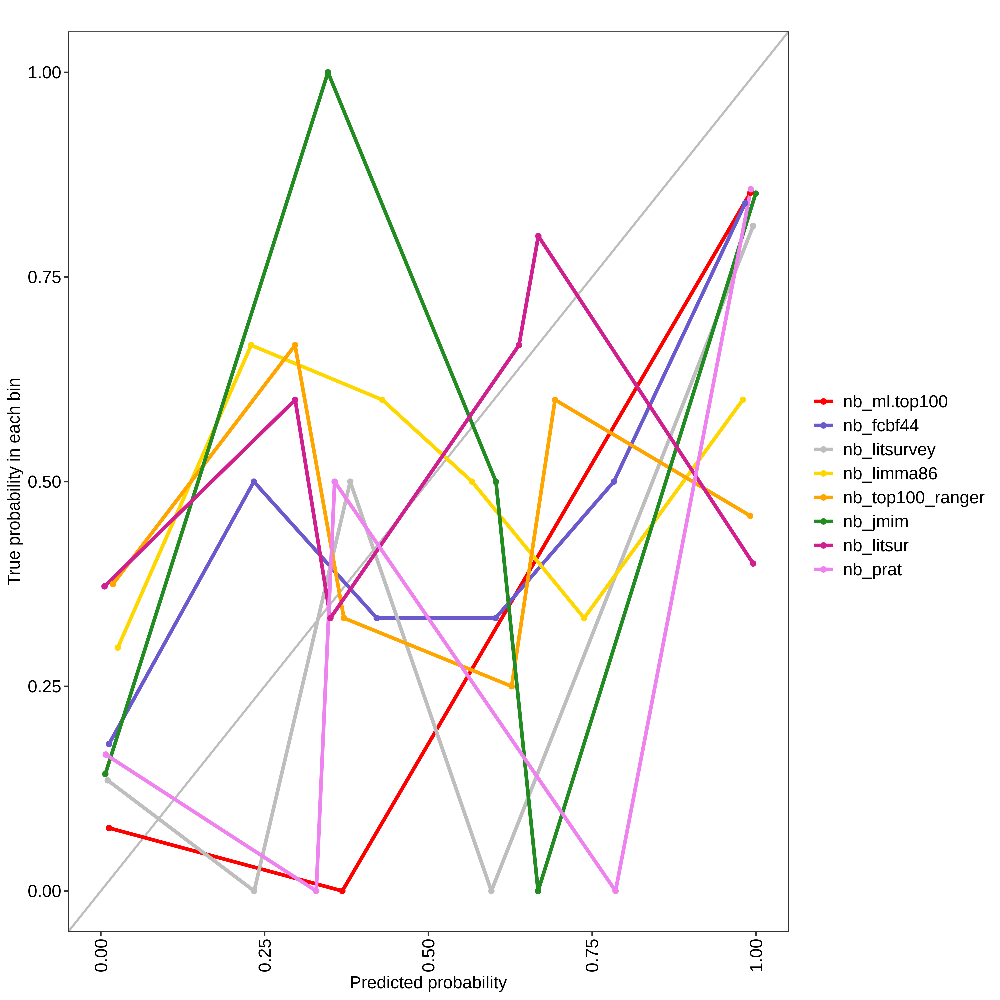

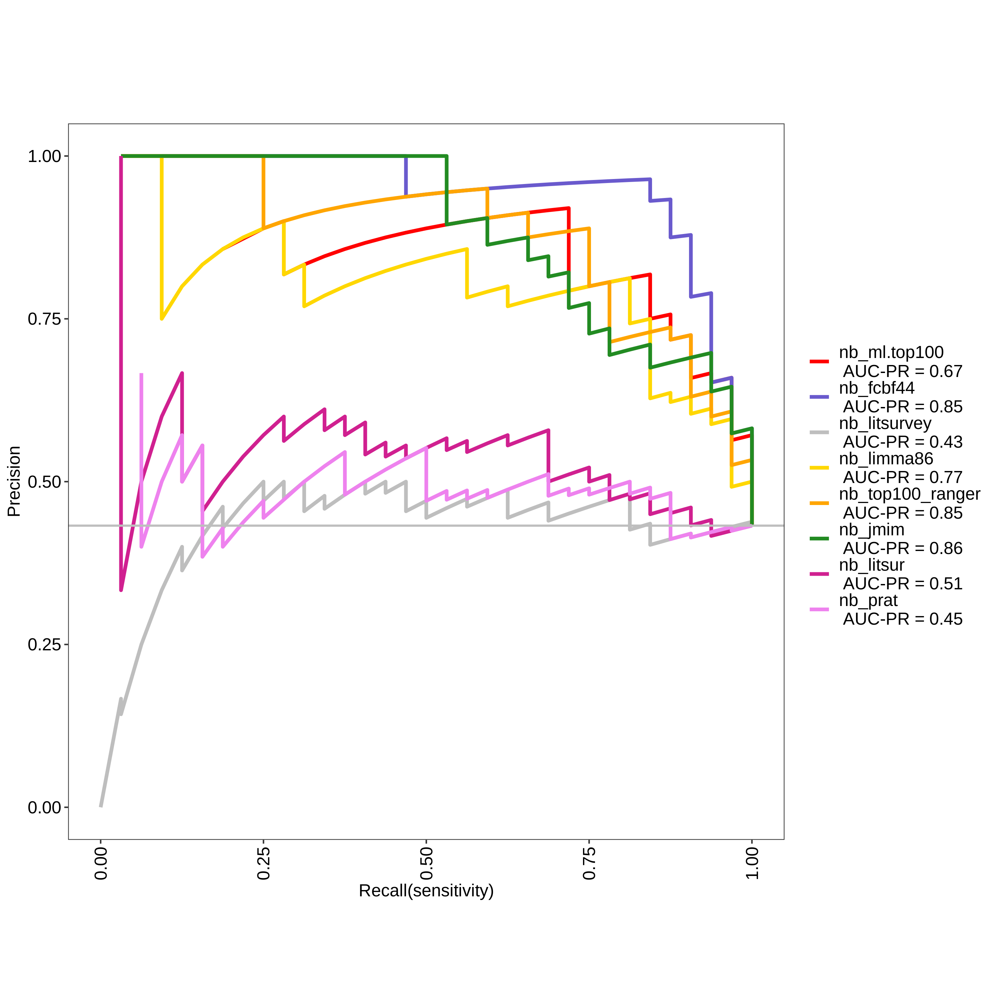

nb_ml.top100 Optimal Informedness = 0.700892857142857

nb_fcbf44 Optimal Informedness = 0.827380952380952

nb_litsurvey Optimal Informedness = 0.145833333333333

nb_limma86 Optimal Informedness = 0.669642857142857

nb_top100_ranger Optimal Informedness = 0.678571428571429

nb_jmim Optimal Informedness = 0.62797619047619

nb_litsur Optimal Informedness = 0.306547619047619

nb_prat Optimal Informedness = 0.193452380952381

nb_ml.top100 AUC-ROC = 0.9

nb_fcbf44 AUC-ROC = 0.95

nb_litsurvey AUC-ROC = 0.52

nb_limma86 AUC-ROC = 0.86

nb_top100_ranger AUC-ROC = 0.9

nb_jmim AUC-ROC = 0.9

nb_litsur AUC-ROC = 0.62

nb_prat AUC-ROC = 0.57



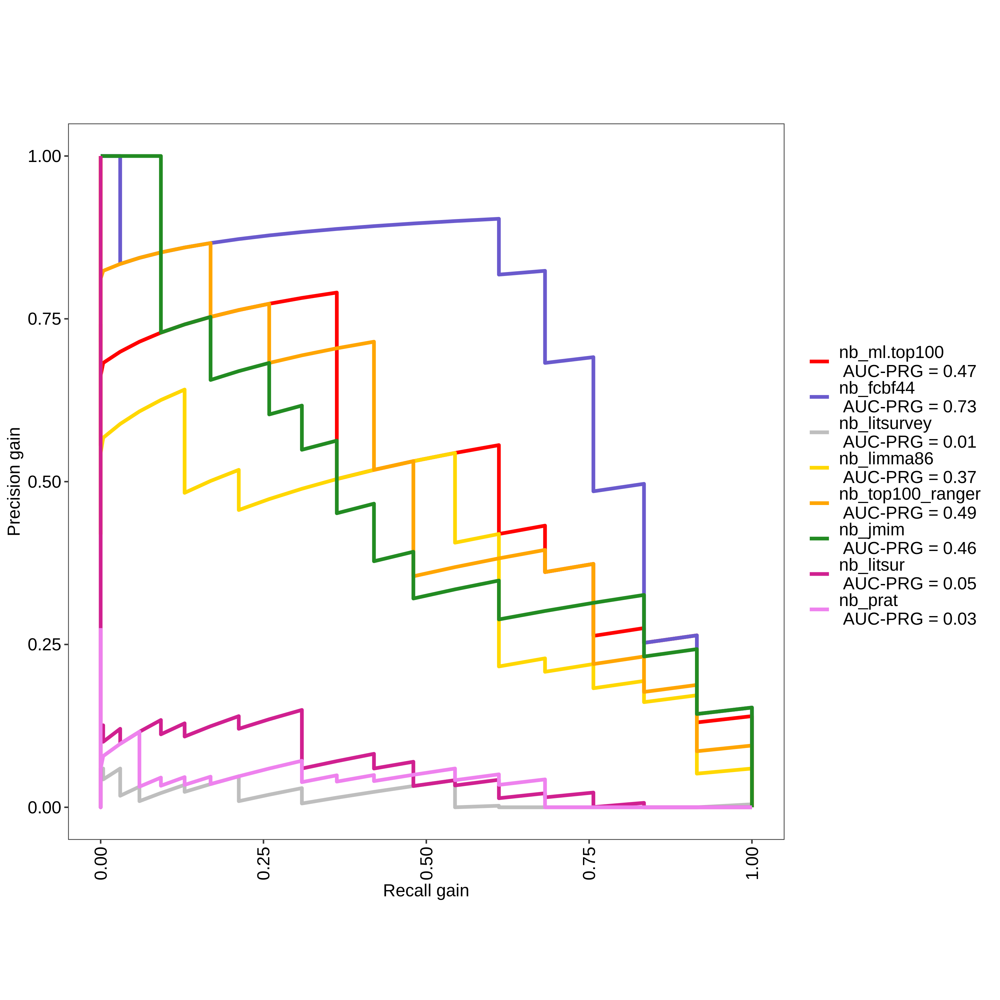

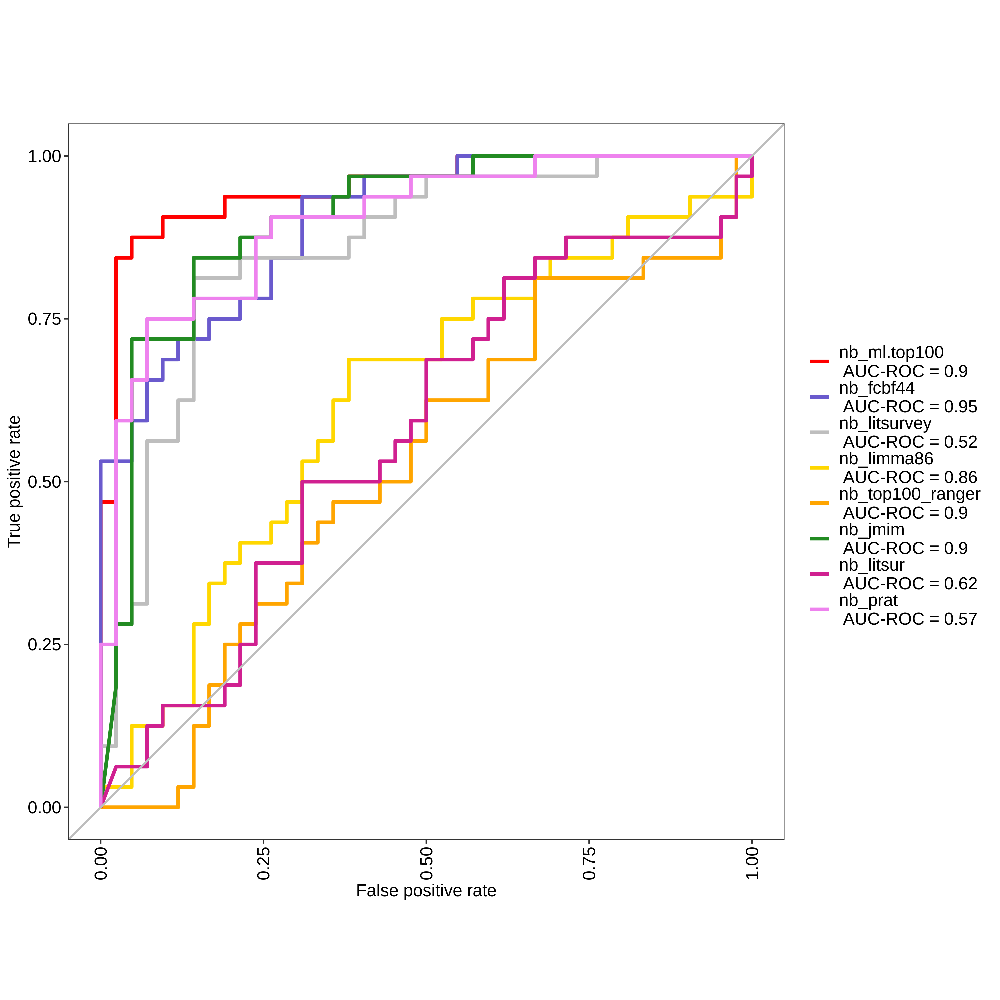

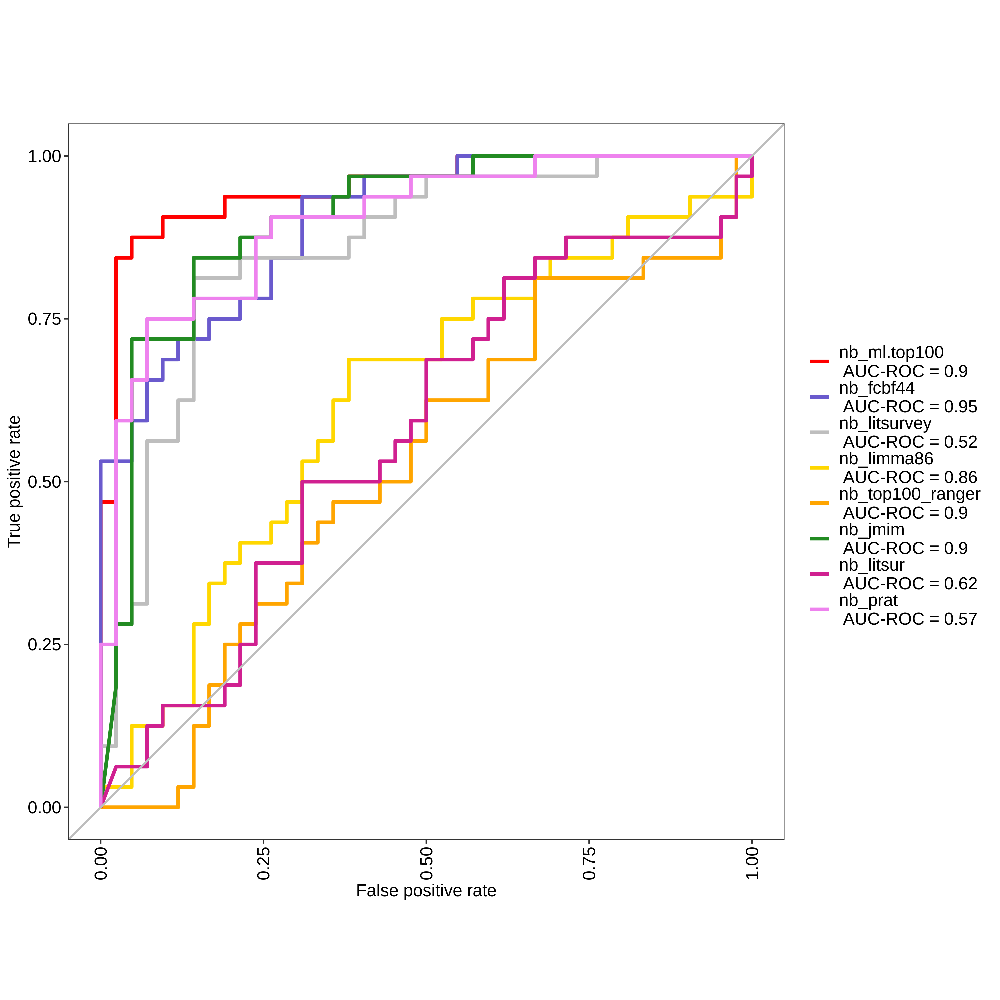

In [60]:
inp_top100_nb <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.100 >= 4, "Gene_ID"])],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf44_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf44.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100var_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top100var.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma86_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma86.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top100_ranger_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp100))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_litsur_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_nb <- evalm(list(inp_top100_nb, inp_fcbf44_nb, inp_top100var_nb, inp_limma86_nb, inp_top100_ranger_nb, inp_jmim_nb, inp_litsur_nb, inp_prat_nb),
             gnames=c('nb_ml.top100', 'nb_fcbf44', 'nb_litsurvey', 'nb_limma86', 'nb_top100_ranger', 'nb_jmim', 'nb_litsur', 'nb_prat'))
res_nb$roc

ROC-AUC Graphs available at https://github.com/runtime-terror101/ICP-Responders/tree/master/ICP_Responders/ROC_AUC%20analysis

# Comparison

In [ ]:
overlap <- length(Reduce(intersect,    list(
#                                             ml.list
#                                             ,fcbf34.list 
#                                             ,top200var.list
#                                             ,limma85.list
#                                             ,ranger.imp200
#                                             ,jmim.list
#                                             ,as.character(genes_lit_rawdata)
#                                             ,prat.list
                                           )))
overlap
# Reduce(intersect, list(ml.list,fcbf34.list))

# head(ml.list)
# head(fcbf34.list) 
# head(top200var.list)
# head(limma85.list)
# head(ranger.imp200)
# head(as.character(genes_lit_rawdata))
# head(prat.list)

 


# Output RDS

In [56]:
saveRDS(jmim.list, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/jmim.list.rds")
saveRDS(as.character(genes_lit_rawdata), "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/litsur.list.rds")
saveRDS(prat.list, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/prat.list.rds")
# saveRDS(mergedRank.list, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/mergedrank.list.rds")

In [ ]:
# saveRds(tmp, "tmp.rds")
# # load by giving path
# # tmp <- readRds("path")
# # R


In [61]:
head(mod_inp_mat)

,Response,1,503538,2,144571,144568,53947,8086,65985,51166,⋯,55754,161291,55161,59353,140738,79041,55151,55254,55116,55287
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2,N,0.44967917,-0.1256063,-0.9428421,-0.613896552,0.3001431,-0.8007014,-0.20012314,0.6050572,-1.070957859,⋯,0.1066520,-0.001637045,0.85260961,-0.06746876,0.5788970,-0.1301452,0.6588969,-0.32640918,0.09944225,0.8028685
5,N,0.67577556,-0.4820313,-1.6330965,0.490900241,2.3912536,-0.7919329,-0.07076524,0.6020135,0.515139163,⋯,-0.1936143,-0.009974824,0.40362548,-0.07548067,-1.0807325,0.1484618,-0.4399667,-0.54194283,-0.09814373,1.4521363
6,N,-0.11535008,-0.1847109,-0.4553360,0.118023126,3.3019088,-0.4543087,0.24283611,0.1082517,-0.775882897,⋯,0.5573582,-0.143680523,-0.35061245,-0.07548067,-0.1909060,0.1878571,0.5705809,0.26392863,-0.38427929,1.9384180
7,N,-0.14481244,1.3029584,-1.1511116,-0.005086172,2.9010415,1.1339221,0.76875725,0.9108753,0.256455283,⋯,-0.7794225,-0.043264200,-0.08733574,-0.07548067,0.4366862,-0.1755413,-0.7675202,0.21593801,-0.55670888,1.5198686
8,N,-0.81082941,0.8105349,1.0845835,-0.574747402,-0.3017081,0.2388977,0.16062935,-0.8485835,2.080058576,⋯,0.1417323,-0.129217787,-0.68809908,0.02847080,-0.9809572,0.4358683,-0.4514615,0.05158051,-0.23156239,-0.7264666
9,N,-0.09359233,-0.2599664,1.0586322,-0.454279206,-0.3388069,0.5777701,-0.15312547,-0.9881818,-0.001514237,⋯,0.6126148,0.062912945,-0.21595784,0.02944681,0.8635538,-0.1465716,-0.1188828,0.02693763,0.37828117,-0.3621200
